In [2]:
def plot_fiber_only_map(
    ref_lat, ref_lon,
    das, sta,
    earthquake_location,
    sparse_corr_file,             # <--- NEW: path to sparse npz file
    cartesian_grid_x, cartesian_grid_y,
    lat_range, lon_range,
    fiber_file,
    title="Fiber Coherence Map",
    event_name=None,
    ax=None,
    boundary_margin=5,
    vicinity_km=1
):
    import matplotlib.pyplot as plt
    from mpl_toolkits.basemap import Basemap
    from matplotlib.lines import Line2D
    from scipy.interpolate import griddata
    import numpy as np
    import os

    # --- Helper: Cartesian -> Geographic ---
    def cartesian_to_geographic(x, y, origin_lat, origin_lon):
        earth_radius = 6371  # km
        lat = origin_lat + (y / earth_radius) * (180 / np.pi)
        lon = origin_lon + (x / (earth_radius * np.cos(np.radians(origin_lat)))) * (180 / np.pi)
        return lat, lon

    # --- Helper: load & reconstruct sparse corrmatrix ---
    def load_sparse_corrmatrix(npz_path):
        data = np.load(npz_path)
        indices = data["indices"]
        values = data["values"]
        nnz = int(data["nnz"])
        nx, ny, nz = data["shape"]

        corr_flat = np.zeros(nx * ny * nz, dtype=values.dtype)
        corr_flat[indices[:nnz]] = values[:nnz]
        return corr_flat.reshape((nx, ny, nz))

    file_dir = os.path.dirname(fiber_file)

    # --- Load dense coherence cube from sparse npz ---
    corrmatrix_das = load_sparse_corrmatrix(sparse_corr_file)

    # --- Mask edges of correlation cube ---
    boundary_margin = 1
    corrmatrix_das = corrmatrix_das[
        boundary_margin:-boundary_margin,
        boundary_margin:-boundary_margin,
        boundary_margin:-boundary_margin
    ]
    cartesian_grid_x = cartesian_grid_x[boundary_margin:-boundary_margin, boundary_margin:-boundary_margin]
    cartesian_grid_y = cartesian_grid_y[boundary_margin:-boundary_margin, boundary_margin:-boundary_margin]

    # --- Normalize coherence matrix ---
    corrmatrix = corrmatrix_das / np.nanmax(corrmatrix_das)
    nx, ny, nz = np.shape(corrmatrix)
    dz = 0.005  # km vertical spacing
    depth_axis = np.arange(nz) * dz
    print("Grid shape:", (nx, ny, nz))

    # --- Top-down projection ---
    CXY = np.max(corrmatrix, axis=2).T

    # --- Geographic conversion ---
    lat_grid, lon_grid = cartesian_to_geographic(cartesian_grid_x, cartesian_grid_y, ref_lat, ref_lon)
    lat_lin = np.linspace(lat_range[0], lat_range[1], ny)
    lon_lin = np.linspace(lon_range[0], lon_range[1], nx)
    grid_lon, grid_lat = np.meshgrid(lon_lin, lat_lin)

    interpolated_CXY = griddata(
        (lat_grid.flatten(), lon_grid.flatten()),
        CXY.flatten(),
        (grid_lat, grid_lon),
        method='cubic'
    )

    # --- Boundary-safe max (avoid edges) on XY projection ---
    margin = 1
    valid_region = np.copy(interpolated_CXY)
    valid_region[:margin, :] = np.nan
    valid_region[-margin:, :] = np.nan
    valid_region[:, :margin] = np.nan
    valid_region[:, -margin:] = np.nan

    max_index_xy = np.unravel_index(np.nanargmax(valid_region), valid_region.shape)
    ix_max, iy_max = max_index_xy

    max_lat = grid_lat[ix_max, iy_max]
    max_lon = grid_lon[ix_max, iy_max]

    # --- Compute depth at max coherence (initial coarse point) ---
    max_depth_index = np.nanargmax(corrmatrix[ix_max, iy_max, :])
    max_depth = depth_axis[max_depth_index]

    print(f"📍 Max Coherence Position (boundary-safe, coarse):")
    print(f"   Latitude : {max_lat:.5f}")
    print(f"   Longitude: {max_lon:.5f}")
    print(f"   Depth    : {max_depth:.5f} km")

    # --- Define vicinity (±vicinity_km) ---
    km_per_deg_lat = 111.32
    km_per_deg_lon = 111.32 * np.cos(np.radians(max_lat))
    half_deg_lat = (vicinity_km / 2) / km_per_deg_lat
    half_deg_lon = (vicinity_km / 2) / km_per_deg_lon
    local_lat_min, local_lat_max = max_lat - half_deg_lat, max_lat + half_deg_lat
    local_lon_min, local_lon_max = max_lon - half_deg_lon, max_lon + half_deg_lon

    # --- Mask local region in XY map ---
    lat_mask = (grid_lat[:, 0] >= local_lat_min) & (grid_lat[:, 0] <= local_lat_max)
    lon_mask = (grid_lon[0, :] >= local_lon_min) & (grid_lon[0, :] <= local_lon_max)
    local_grid_lat = grid_lat[np.ix_(lat_mask, lon_mask)]
    local_grid_lon = grid_lon[np.ix_(lat_mask, lon_mask)]
    local_interp = interpolated_CXY[np.ix_(lat_mask, lon_mask)]

    fig, (ax_map, ax_xz, ax_yz) = plt.subplots(
        1, 3, figsize=(15, 5), dpi=300,
        gridspec_kw={'width_ratios': [1, 1, 1]}
    )

    # ####################
    # XY VIEW (MAP)
    # ####################
    m = Basemap(
        projection='cyl',
        llcrnrlat=local_lat_min, urcrnrlat=local_lat_max,
        llcrnrlon=local_lon_min, urcrnrlon=local_lon_max,
        resolution='h', ax=ax_map
    )
    m.drawcoastlines(linewidth=0.5)
    m.drawcountries(linewidth=0.5)
    m.fillcontinents(color='lightgray', lake_color='lightblue')
    m.drawmapboundary(fill_color='lightblue')

    cs = ax_map.contourf(local_grid_lon, local_grid_lat, local_interp,
                         levels=20, cmap='viridis', alpha=0.85)

    # ticks
    n_xticks = 4
    n_yticks = 4
    xticks = np.linspace(local_lon_min, local_lon_max, n_xticks)
    yticks = np.linspace(local_lat_min, local_lat_max, n_yticks)
    ax_map.set_xticks(xticks)
    ax_map.set_yticks(yticks)
    ax_map.tick_params(axis='both', which='both', direction='out', labelsize=8)

    # --- Plot earthquake & max coherence on map ---
    ax_map.scatter(
        earthquake_location[1], earthquake_location[0],
        marker='*', color='red', edgecolors='black',
        s=130, label='Catalog Location'
    )
    ax_map.scatter(
        max_lon, max_lat, marker='*', facecolors='yellow',
        edgecolors='black', s=130, label='Max Coherence'
    )

    # --- Plot DAS positions (map) ---
    for name, coords in das.items():
        lat, lon = coords[:2]
        if (local_lat_min <= lat <= local_lat_max) and (local_lon_min <= lon <= local_lon_max):
            ax_map.scatter(lon, lat, marker='^', color='orange', s=25)
            ax_map.text(lon + 0.0002, lat + 0.0002, name,
                        fontsize=6, color='black', ha='left', va='bottom')

    # --- Plot Station positions (map) ---
    for name, coords in sta.items():
        lat, lon = coords[:2]
        if (local_lat_min <= lat <= local_lat_max) and (local_lon_min <= lon <= local_lon_max):
            ax_map.scatter(lon, lat, marker='^', color='crimson', s=25)
            ax_map.text(lon + 0.0002, lat + 0.0002, name,
                        fontsize=6, color='black', ha='left', va='bottom')

    ax_map.set_title(f"{title} (Local ±{vicinity_km/2:.1f} km)", fontsize=12)
    ax_map.set_xlabel("Longitude")
    ax_map.set_ylabel("Latitude")

    cbar = fig.colorbar(cs, ax=ax_map, orientation='vertical', pad=0.02, shrink=0.8)
    cbar.set_label('Normalized Coherence')

    # ####################
    # LOCAL VOLUME & REFINED MAX
    # ####################
    # Extract local slice indices in the *original* longitude / latitude axes
    lat_indices = np.where((lat_lin >= local_lat_min) & (lat_lin <= local_lat_max))[0]
    lon_indices = np.where((lon_lin >= local_lon_min) & (lon_lin <= local_lon_max))[0]
    depth_indices = np.arange(nz)

    # REFINE: search for THE max in the 3D sub-volume
    local_corr = corrmatrix[np.ix_(lon_indices, lat_indices, depth_indices)]
    local_max_index = np.unravel_index(np.nanargmax(local_corr), local_corr.shape)
    lx, ly, lz = local_max_index   # indices in local_corr

    # Convert back to global lon/lat/depth
    refined_lon = lon_lin[lon_indices[lx]]
    refined_lat = lat_lin[lat_indices[ly]]
    refined_depth = depth_axis[depth_indices[lz]]

    print("🔍 Refined local max in volume:")
    print(f"   Latitude : {refined_lat:.5f}")
    print(f"   Longitude: {refined_lon:.5f}")
    print(f"   Depth    : {refined_depth:.5f} km")

    # ####################
    # XZ VIEW (Longitude–Depth)
    # ####################
    C_xz_local = local_corr.transpose(2, 1, 0)  # (depth, lat, lon)
    C_xz_slice = np.max(C_xz_local, axis=1)     # max over lat -> (depth, lon)

    lon_extent = [lon_lin[lon_indices[0]], lon_lin[lon_indices[-1]]]
    im1 = ax_xz.imshow(
        C_xz_slice,
        extent=[lon_extent[0], lon_extent[1], depth_axis[-1], depth_axis[0]],
        aspect='auto', cmap='viridis'
    )
    ax_xz.set_xlabel("Longitude")
    ax_xz.set_ylabel("Depth (km)")
    ax_xz.set_title("Longitude–Depth")
    ax_xz.invert_yaxis()
    ax_xz.tick_params(axis='both', which='both', direction='out', labelsize=8)

    # --- XZ refined max marker ---
    ax_xz.scatter(refined_lon, refined_depth,
                  color='yellow', edgecolor='black', s=70, marker='*', zorder=5)

    # ####################
    # YZ VIEW (Latitude–Depth)
    # ####################
    C_yz_local = local_corr.transpose(2, 0, 1)  # (depth, lon, lat)
    C_yz_slice = np.max(C_yz_local, axis=1)     # max over lon -> (depth, lat)

    lat_extent = [lat_lin[lat_indices[0]], lat_lin[lat_indices[-1]]]
    im2 = ax_yz.imshow(
        C_yz_slice,
        extent=[lat_extent[0], lat_extent[1], depth_axis[-1], depth_axis[0]],
        aspect='auto', cmap='viridis'
    )
    ax_yz.set_xlabel("Latitude")
    ax_yz.set_ylabel("Depth (km)")
    ax_yz.set_title("Latitude–Depth")
    ax_yz.invert_yaxis()
    ax_yz.tick_params(axis='both', which='both', direction='out', labelsize=8)

    # --- YZ refined max marker ---
    ax_yz.scatter(refined_lat, refined_depth,
                  color='yellow', edgecolor='black', s=70, marker='*', zorder=5)

    # ####################
    # Fixed red star marker in all views
    # ####################
    ref_lat_marker = 46.51049267 #46.51057784
    ref_lon_marker = 8.476303318 #8.47647181
    ref_depth_km = 1.427 #1.420


    ax_map.scatter(ref_lon_marker, ref_lat_marker,
                   marker='*', color='red', edgecolors='black', s=130, zorder=5)

    ax_xz.scatter(ref_lon_marker, ref_depth_km,
                  color='red', edgecolor='black', s=80, marker='*', zorder=5)
    ax_yz.scatter(ref_lat_marker, ref_depth_km,
                  color='red', edgecolor='black', s=80, marker='*', zorder=5)

    # ####################
    # DAS & STATIONS on vertical slices
    # ####################
    for name, coords in das.items():
        lat, lon, depth_das = coords[:3]
        if (local_lat_min <= lat <= local_lat_max) and (local_lon_min <= lon <= local_lon_max):
            ax_xz.scatter(lon, depth_das, marker='^', color='orange', s=20)
            ax_yz.scatter(lat, depth_das, marker='^', color='orange', s=20)

    for name, coords in sta.items():
        lat, lon, depth_sta = coords[:3]
        if (local_lat_min <= lat <= local_lat_max) and (local_lon_min <= lon <= local_lon_max):
            ax_xz.scatter(lon, depth_sta, marker='^', color='crimson', s=20)
            ax_yz.scatter(lat, depth_sta, marker='^', color='crimson', s=20)

    # ####################
    # Legend
    # ####################
    custom_handles = [
        Line2D([0], [0], marker='*', color='red', label='Catalog Location',
               markersize=10, linestyle='', markeredgecolor='black'),
        Line2D([0], [0], marker='*', color='none', label='Max Coherence (refined)',
               markersize=10, linestyle='', markeredgecolor='black'),
        Line2D([0], [0], marker='^', color='crimson', label='Seismometers',
               linestyle='', markersize=6),
        Line2D([0], [0], marker='^', color='orange', label='DAS',
               linestyle='', markersize=6),
    ]
    ax_map.legend(handles=custom_handles, loc='lower right',
                  fontsize='small', frameon=True)

    fig.suptitle(title, fontsize=14)
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])

    output_file = os.path.join(
        file_dir,
        f"{event_name}_fiber_map_local_2km_horizontal.pdf" if event_name else "fiber_map_local_2km_horizontal.pdf"
    )
    plt.savefig(output_file, bbox_inches='tight')
    plt.show()

    print(f"✅ Saved local vicinity plot: {output_file}")



=== Orion ===
Using .loc: /home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/fiber/fiber.loc
Best trial index in .loc (info): 3
Selected sparse file: /home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/fiber/corrmatrix_sparse_best_3_fiber.npz
Max coherence in sparse file: 1.0172

--- Processing Event 'cluster' for 'Orion' ---
Grid shape: (999, 999, 999)
📍 Max Coherence Position (boundary-safe, coarse):
   Latitude : 46.51026
   Longitude: 8.47679
   Depth    : 1.32500 km
🔍 Refined local max in volume:
   Latitude : 46.51031
   Longitude: 8.47686
   Depth    : 1.29000 km


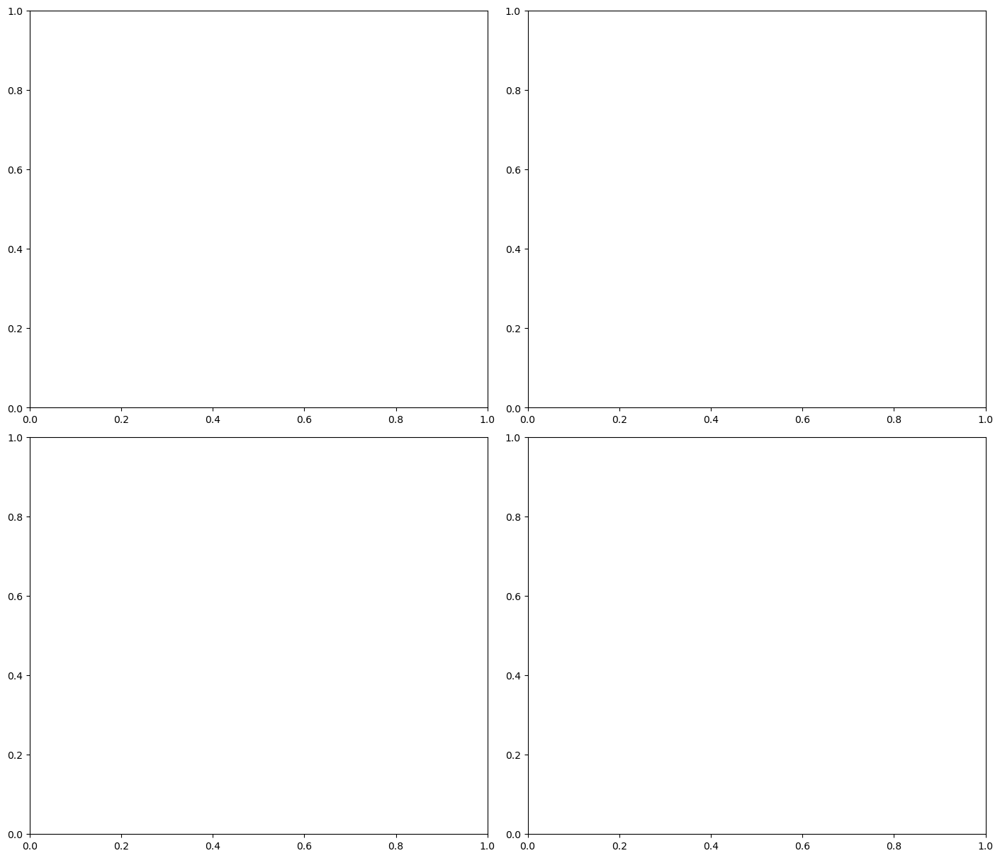

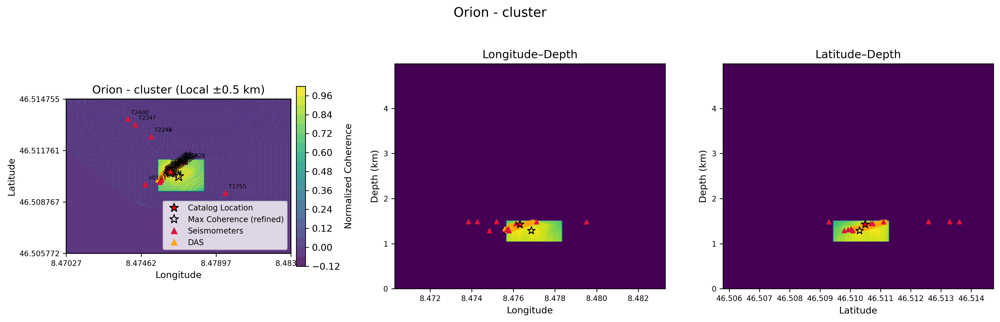

✅ Saved local vicinity plot: /home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/fiber/Orion_cluster_fiber_map_local_2km_horizontal.pdf

=== Hybrid_gilbert ===
Using .loc: /home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/hybrid_gilbert/hybrid_gilbert.loc
Best trial index in .loc (info): 3
Selected sparse file: /home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/hybrid_gilbert/corrmatrix_sparse_best_3_hybrid.npz
Max coherence in sparse file: 0.0627

--- Processing Event 'cluster' for 'Hybrid_gilbert' ---
Grid shape: (999, 999, 999)
📍 Max Coherence Position (boundary-safe, coarse):
   Latitude : 46.51067
   Longitude: 8.47614
   Depth    : 1.04500 km
🔍 Refined local max in volume:
   Latitude : 46.51072
   Longitude: 8.47620
   Depth    : 1.32000 km


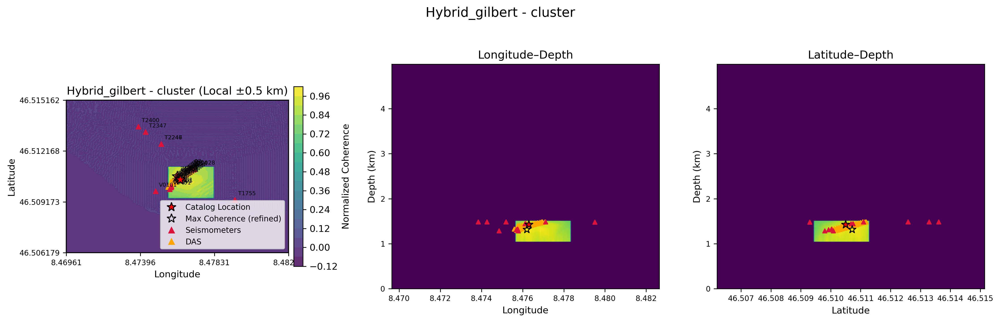

✅ Saved local vicinity plot: /home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/hybrid_gilbert/Hybrid_gilbert_cluster_fiber_map_local_2km_horizontal.pdf

=== Stations ===
Using .loc: /home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/stations/stations.loc
Best trial index in .loc (info): 3
Selected sparse file: /home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/stations/corrmatrix_sparse_best_13_stations.npz
Max coherence in sparse file: 0.5012

--- Processing Event 'cluster' for 'Stations' ---
Grid shape: (999, 999, 999)
📍 Max Coherence Position (boundary-safe, coarse):
   Latitude : 46.50715
   Longitude: 8.48237
   Depth    : 0.00000 km
🔍 Refined local max in volume:
   Latitude : 46.50782
   Longitude: 8.48362
   Depth    : 1.70500 km


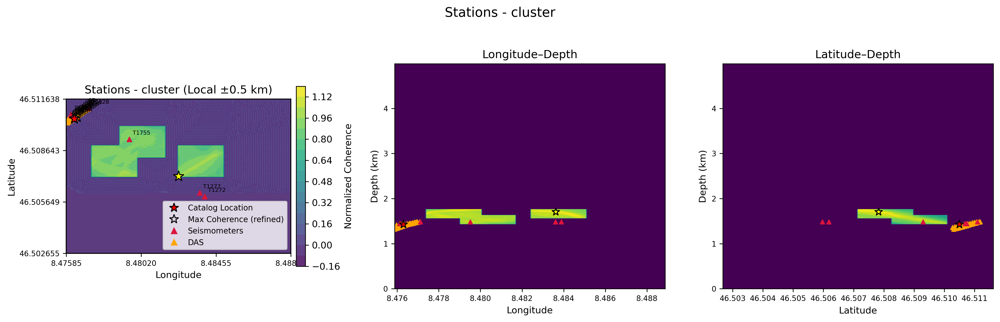

✅ Saved local vicinity plot: /home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/stations/Stations_cluster_fiber_map_local_2km_horizontal.pdf


In [5]:
import numpy as np
import os
import glob
import matplotlib.pyplot as plt

# --- Reference Coordinates ---
ref_lat = 46.49305
ref_lon = 8.4518559

# --- Station Geometry ---
sta = {
    "BTAO": (46.52964, 8.59026, 1.3116),
    "BTAP": (46.51812, 8.47682, 2.70497),
    "BTCP": (46.49485, 8.47078, 1.9910),
    "BTNF": (46.47739, 8.36925, 1.9237),
    "BTPT": (46.49305, 8.48771, 1.5640),
    "BTRH": (46.54555, 8.48623, 2.5478),
    "BTRN": (46.50012, 8.49865, 1.4980),
    "GSF03": (46.57738, 8.39105, 2.4030),
    "T0498": (46.500972, 8.490454, 1.4812),
    "T1272": (46.50597, 8.48389, 1.48291),
    "T1277": (46.5061808, 8.4836008, 1.483039),
    "T1755": (46.509295, 8.479507, 1.48416),
    "T2028": (46.51109751, 8.4771154, 1.48549),
    "T2246": (46.512585, 8.475187, 1.48697),
    "T2247": (46.512585, 8.475187, 1.48697),
    "T2347": (46.51328659, 8.474261548, 1.48778),
    "T2400": (46.5136063, 8.4738397, 1.48798),
    "T2700": (46.5157422, 8.4710314, 1.49005),
    "T3500": (46.5209128, 8.4641667, 1.49482),
    "T4912": (46.5303416, 8.4518559, 1.5042),
    "T5200": (46.53074, 8.45084, 1.5053),
    "V0101": (46.50979941, 8.474849352, 1.28995),
    "V0401": (46.50992683, 8.475684419, 1.31232),
    "V0501": (46.51002093, 8.475752935, 1.32992),
    "V0701": (46.51067617, 8.476143751, 1.44496),
    "V0801": (46.5100849, 8.475792078, 1.28619),
    "Z1701": (46.510742, 8.476111, 1.4449),
    "Z1801": (46.510742, 8.476111, 1.4449),
}

das = {
    "0":   (46.51114946027361, 8.476964009761309, 1.4850231296),
    "10":  (46.51107317961245, 8.476846203053816, 1.4749029376),
    "20":  (46.51099678920282, 8.476725963262176, 1.4649624576),
    "30":  (46.51092021688518, 8.476604590108504, 1.4551209984),
    "40":  (46.5108411743232,  8.476480875842794, 1.4457025536),
    "50":  (46.51075933348957, 8.476354492213998, 1.4368026624),
    "60":  (46.510675082120535,8.476225635780128, 1.4284036096),
    "70":  (46.51058831681691, 8.4760951212587,   1.4204853248),
    "80":  (46.51049978366563, 8.47596560840627,  1.4127137792),
    "90":  (46.510410431886974,8.47583672164917,  1.4049969152),
    "96":  (46.510356259210006,8.475759300178975, 1.4004573184),
    "97":  (46.5111840075104,  8.476918906087484, 1.48471296),
    "107": (46.511117263823735,8.476830645984025, 1.4722601984),
    "117": (46.51105185408604, 8.476741573836176, 1.459753984),
    "127": (46.51098522451364, 8.47665462711282,  1.4472398848),
    "137": (46.51091763142704, 8.47656998295007,  1.4346970112),
    "147": (46.51085217835482, 8.476485652879173, 1.4220020736),
    "157": (46.51078862750322, 8.47640241853776,  1.4091460608),
    "167": (46.51072406232895, 8.476321175839429, 1.3962778624),
    "177": (46.51065877459628, 8.476241765482808, 1.3833875456),
    "187": (46.51059281693908, 8.476162593618803, 1.3705310208),
    "197": (46.51052498550538, 8.476084532102918, 1.3577558016),
    "207": (46.51045454646837, 8.476007891602071, 1.3451055104),
    "217": (46.510383016349785,8.475931592926718, 1.3325188096),
    "227": (46.510311844118384,8.475855497492187, 1.3198999552),
    "237": (46.51024101954059, 8.475779761425516, 1.307244032),
    "247": (46.51017055520713, 8.47570430286234,  1.29582336),
    "254": (46.511061807021726,8.477082715911758, 1.4847443968),
    "264": (46.5109930062887,  8.476974355161763, 1.4734123008),
    "274": (46.510922808229054,8.476866475511105, 1.462159872),
    "284": (46.51085065037063, 8.476759752612297, 1.450996736),
    "294": (46.510777785950935,8.47665349968178,  1.4398640128),
    "304": (46.51070538636775, 8.476545985831184, 1.4287647744),
    "314": (46.51063266688518, 8.476437999130336, 1.4177186816),
    "324": (46.510559224930454,8.476331796989141, 1.4066301952),
    "334": (46.51048736762539, 8.476224275578621, 1.3954883584),
    "344": (46.51041570516042, 8.476118101338137, 1.384254976),
    "354": (46.51034404177559, 8.476012084978931, 1.3730128896),
    "364": (46.51027264567066, 8.475906954926794, 1.3617011712),
    "374": (46.5102010898532,  8.475801529327587, 1.3504181248),
    "384": (46.5101291325122,  8.475696468609556, 1.339146752),
    "394": (46.51005781595852, 8.475591797367052, 1.327877),
}

# --- Grid Parameters ---
nx = ny = 1001
nz = 1001
dx = dz = 0.005

cartesian_grid_x, cartesian_grid_y = np.meshgrid(
    np.linspace(0, 5, nx), np.linspace(0, 5, ny)
)
lat_range = (ref_lat, ref_lat + nx * dx / 111)
lon_range = (ref_lon, ref_lon + ny * dx / (111 * np.cos(np.radians(ref_lat))))

# --- Event List ---
events = {
    'cluster': (46.51057784,8.47647181,1.42),
}

# --- Data Roots ---
base_dirs = {
    "Orion": (
        #"/home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_3_02_26_new/event1/fiber",
        "/home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/fiber",
        "fiber.loc",
    ),
    #"Random": (
    #    "/home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2_gilbert/kef0187/fiber_uniform",
    #    "fiber_uniform.loc",
    #),
    "Hybrid_gilbert": (
         #"/home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_3_02_26_new/event1/hybrid_gilbert",    #
         "/home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/hybrid_gilbert",
         "hybrid_gilbert.loc",
    ),
    "Stations": (
        #"/home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_3_02_26_new/event1/stations",
        "/home/emanuele/data/emanuele/loki-das/bedretto/output_test_hybrid_network_04_02_26/event2/stations",
        "stations.loc",
    ),
}

def select_highest_coherence_sparse_file(folder, loc_filename):
    """
    1. Check if a 'best' sparse matrix exists in the folder.
    2. If so, use it directly.
    3. Otherwise, scan all trial sparse files and select the one with highest values.max().
    """
    loc_file = os.path.join(folder, loc_filename)
    if not os.path.isfile(loc_file):
        raise FileNotFoundError(f"Missing .loc file: {loc_file}")

    catalog = np.loadtxt(loc_file)
    if catalog.ndim == 1:
        catalog = catalog[np.newaxis, :]

    coherence = catalog[:, 4]
    best_trial_idx_loc = int(np.argmax(coherence))

    # 1️⃣ Look for best sparse matrix
    best_pattern = os.path.join(folder, "corrmatrix_sparse_best_*.npz")
    best_files = glob.glob(best_pattern)

    if best_files:
        # If multiple best files exist, take the one with largest max value
        best_file = None
        best_cmax = -np.inf
        for f in best_files:
            try:
                dat = np.load(f)
                values = dat["values"]
                cmax = float(values.max())
                if cmax > best_cmax:
                    best_cmax = cmax
                    best_file = f
            except Exception as e:
                print(f"Warning: could not read {f}: {e}")
                continue
        if best_file:
            return best_file, best_trial_idx_loc, best_cmax

    # 2️⃣ Fall back to scanning all trial sparse files
    patterns = [
        os.path.join(folder, "corrmatrix_sparse_trial_*.npz"),
        os.path.join(folder, "*corrmatrix_sparse*.npz"),
    ]
    candidates = []
    for pat in patterns:
        candidates.extend(glob.glob(pat))
    candidates = list(dict.fromkeys(candidates))  # remove duplicates

    if not candidates:
        raise FileNotFoundError(
            f"No sparse corrmatrix files found in {folder} with patterns {patterns}"
        )

    # Pick file with largest values.max()
    best_file = None
    best_cmax = -np.inf
    for f in candidates:
        try:
            dat = np.load(f)
            values = dat["values"]
            cmax = float(values.max())
            if cmax > best_cmax:
                best_cmax = cmax
                best_file = f
        except Exception as e:
            print(f"Warning: could not read {f}: {e}")
            continue

    if best_file is None:
        raise RuntimeError(
            f"All sparse candidates in {folder} failed to load; patterns {patterns}"
        )

    return best_file, best_trial_idx_loc, best_cmax



# --- Plotting Comparison ---
fig, axes = plt.subplots(2, 2, figsize=(14, 12), constrained_layout=True)
axes = axes.flatten()

for ax, (label, (base_dir, loc_file)) in zip(axes, base_dirs.items()):
    print(f"\n=== {label} ===")
    try:
        sparse_file, best_trial_loc, best_cmax = select_highest_coherence_sparse_file(
            base_dir, loc_file
        )
        print(f"Using .loc: {os.path.join(base_dir, loc_file)}")
        print(f"Best trial index in .loc (info): {best_trial_loc}")
        print(f"Selected sparse file: {sparse_file}")
        print(f"Max coherence in sparse file: {best_cmax:.4f}")
    except Exception as e:
        print(f"Skipping {label}: {e}")
        continue

    for name, eq_loc in events.items():
        print(f"\n--- Processing Event '{name}' for '{label}' ---")
        plot_fiber_only_map(
            ref_lat,
            ref_lon,
            das,
            sta,
            eq_loc,
            sparse_file,              # path to sparse .npz
            cartesian_grid_x,
            cartesian_grid_y,
            lat_range,
            lon_range,
            sparse_file,              # used for output dir / naming
            title=f"{label} - {name}",
            event_name=f"{label}_{name}",
            ax=ax,
        )

fig.suptitle(
    "Comparison of Coherence Maps (sparse): Orion vs Random vs Hybrid vs Stations",
    fontsize=16,
)
plt.show()


## PLOT ALL EVENTS

In [ ]:
import pandas as pd
import numpy as np
import os
import glob
import matplotlib.pyplot as plt

# --- Reference Coordinates ---
ref_lat = 46.49305
ref_lon = 8.4518559

# --- Load stations and DAS --- (same as before)
# ... [sta and das dictionaries here]


# --- Station Geometry ---
sta = {
    "BTAO": (46.52964, 8.59026, 1.3116),
    "BTAP": (46.51812, 8.47682, 2.70497),
    "BTCP": (46.49485, 8.47078, 1.9910),
    "BTNF": (46.47739, 8.36925, 1.9237),
    "BTPT": (46.49305, 8.48771, 1.5640),
    "BTRH": (46.54555, 8.48623, 2.5478),
    "BTRN": (46.50012, 8.49865, 1.4980),
    "GSF03": (46.57738, 8.39105, 2.4030),
    "T0498": (46.500972, 8.490454, 1.4812),
    "T1272": (46.50597, 8.48389, 1.48291),
    "T1277": (46.5061808, 8.4836008, 1.483039),
    "T1755": (46.509295, 8.479507, 1.48416),
    "T2028": (46.51109751, 8.4771154, 1.48549),
    "T2246": (46.512585, 8.475187, 1.48697),
    "T2247": (46.512585, 8.475187, 1.48697),
    "T2347": (46.51328659, 8.474261548, 1.48778),
    "T2400": (46.5136063, 8.4738397, 1.48798),
    "T2700": (46.5157422, 8.4710314, 1.49005),
    "T3500": (46.5209128, 8.4641667, 1.49482),
    "T4912": (46.5303416, 8.4518559, 1.5042),
    "T5200": (46.53074, 8.45084, 1.5053),
    "V0101": (46.50979941, 8.474849352, 1.28995),
    "V0401": (46.50992683, 8.475684419, 1.31232),
    "V0501": (46.51002093, 8.475752935, 1.32992),
    "V0701": (46.51067617, 8.476143751, 1.44496),
    "V0801": (46.5100849, 8.475792078, 1.28619),
    "Z1701": (46.510742, 8.476111, 1.4449),
    "Z1801": (46.510742, 8.476111, 1.4449),
}


das = {
    "0":   (46.51114946027361, 8.476964009761309, 1.4850231296),
    "10":  (46.51107317961245, 8.476846203053816, 1.4749029376),
    "20":  (46.51099678920282, 8.476725963262176, 1.4649624576),
    "30":  (46.51092021688518, 8.476604590108504, 1.4551209984),
    "40":  (46.5108411743232,  8.476480875842794, 1.4457025536),
    "50":  (46.51075933348957, 8.476354492213998, 1.4368026624),
    "60":  (46.510675082120535,8.476225635780128, 1.4284036096),
    "70":  (46.51058831681691, 8.4760951212587,   1.4204853248),
    "80":  (46.51049978366563, 8.47596560840627,  1.4127137792),
    "90":  (46.510410431886974,8.47583672164917,  1.4049969152),
    "96":  (46.510356259210006,8.475759300178975, 1.4004573184),
    "97":  (46.5111840075104,  8.476918906087484, 1.48471296),
    "107": (46.511117263823735,8.476830645984025, 1.4722601984),
    "117": (46.51105185408604, 8.476741573836176, 1.459753984),
    "127": (46.51098522451364, 8.47665462711282,  1.4472398848),
    "137": (46.51091763142704, 8.47656998295007,  1.4346970112),
    "147": (46.51085217835482, 8.476485652879173, 1.4220020736),
    "157": (46.51078862750322, 8.47640241853776,  1.4091460608),
    "167": (46.51072406232895, 8.476321175839429, 1.3962778624),
    "177": (46.51065877459628, 8.476241765482808, 1.3833875456),
    "187": (46.51059281693908, 8.476162593618803, 1.3705310208),
    "197": (46.51052498550538, 8.476084532102918, 1.3577558016),
    "207": (46.51045454646837, 8.476007891602071, 1.3451055104),
    "217": (46.510383016349785,8.475931592926718, 1.3325188096),
    "227": (46.510311844118384,8.475855497492187, 1.3198999552),
    "237": (46.51024101954059, 8.475779761425516, 1.307244032),
    "247": (46.51017055520713, 8.47570430286234,  1.29582336),
    "254": (46.511061807021726,8.477082715911758, 1.4847443968),
    "264": (46.5109930062887,  8.476974355161763, 1.4734123008),
    "274": (46.510922808229054,8.476866475511105, 1.462159872),
    "284": (46.51085065037063, 8.476759752612297, 1.450996736),
    "294": (46.510777785950935,8.47665349968178,  1.4398640128),
    "304": (46.51070538636775, 8.476545985831184, 1.4287647744),
    "314": (46.51063266688518, 8.476437999130336, 1.4177186816),
    "324": (46.510559224930454,8.476331796989141, 1.4066301952),
    "334": (46.51048736762539, 8.476224275578621, 1.3954883584),
    "344": (46.51041570516042, 8.476118101338137, 1.384254976),
    "354": (46.51034404177559, 8.476012084978931, 1.3730128896),
    "364": (46.51027264567066, 8.475906954926794, 1.3617011712),
    "374": (46.5102010898532,  8.475801529327587, 1.3504181248),
    "384": (46.5101291325122,  8.475696468609556, 1.339146752),
    "394": (46.51005781595852, 8.475591797367052, 1.327877),
}

# --- Grid Parameters ---
nx = ny = 1001
dx = dz = 0.005  # km spacing
cartesian_grid_x, cartesian_grid_y = np.meshgrid(
    np.linspace(0, 5, nx), np.linspace(0, 5, ny)
)

# --- Paths ---
main_base_dir = "/home/emanuele/data/emanuele/loki-das/bedretto/Bedretto_DAS/M0B_snippets_mseed_location"
loc_filename = "fiber.loc"
csv_file = "/home/emanuele/data/emanuele/loki-das/bedretto/Bedretto_DAS/experiment_incl_permanent_2024_08_15_17_00_00__2024_09_10_15_00_00_xyz_permanent_events_only.csv"

# -----------------------------
# --- Load CSV and clean column names ---
# -----------------------------
df = pd.read_csv(csv_file)
df.columns = [c.strip() for c in df.columns]  # remove any extra spaces
perm_to_mag = dict(zip(df['permanent event id'], df['permanent magnitude']))
print(f"Loaded {len(perm_to_mag)} permanent event magnitudes from CSV")

# -----------------------------
# --- Functions ---
# -----------------------------
def select_highest_coherence_sparse_file(folder, loc_filename):
    loc_file = os.path.join(folder, loc_filename)
    if not os.path.isfile(loc_file):
        raise FileNotFoundError(f"Missing .loc file: {loc_file}")

    catalog = np.loadtxt(loc_file)
    if catalog.ndim == 1:
        catalog = catalog[np.newaxis, :]
    best_trial_idx_loc = int(np.argmax(catalog[:, 4]))

    best_files = glob.glob(os.path.join(folder, "corrmatrix_sparse_best_*.npz"))
    if best_files:
        best_file = max(best_files, key=lambda f: float(np.load(f)["values"].max()))
        return best_file, best_trial_idx_loc

    candidates = glob.glob(os.path.join(folder, "*corrmatrix_sparse*.npz"))
    if not candidates:
        raise FileNotFoundError(f"No sparse files found in {folder}")
    best_file = max(candidates, key=lambda f: float(np.load(f)["values"].max()))
    return best_file, best_trial_idx_loc

def extract_max_coherence(sparse_file, cartesian_grid_x, cartesian_grid_y,
                          ref_lat, ref_lon, boundary_margin=1):
    data = np.load(sparse_file)
    indices = data["indices"]
    values = data["values"]
    nnz = int(data["nnz"])
    nx, ny, nz = data["shape"]

    corr_flat = np.zeros(nx*ny*nz, dtype=values.dtype)
    corr_flat[indices[:nnz]] = values[:nnz]
    corrmatrix = corr_flat.reshape((nx, ny, nz))

    # Mask edges
    corrmatrix = corrmatrix[boundary_margin:-boundary_margin,
                            boundary_margin:-boundary_margin,
                            boundary_margin:-boundary_margin]
    cartesian_grid_x = cartesian_grid_x[boundary_margin:-boundary_margin,
                                        boundary_margin:-boundary_margin]
    cartesian_grid_y = cartesian_grid_y[boundary_margin:-boundary_margin,
                                        boundary_margin:-boundary_margin]

    # Top-down projection
    CXY = np.max(corrmatrix, axis=2).T

    # Cartesian → geographic
    earth_radius = 6371  # km
    lat_grid = ref_lat + (cartesian_grid_y / earth_radius) * (180 / np.pi)
    lon_grid = ref_lon + (cartesian_grid_x / (earth_radius * np.cos(np.radians(ref_lat)))) * (180 / np.pi)

    # Boundary-safe max
    margin = 1
    CXY[:margin, :] = np.nan
    CXY[-margin:, :] = np.nan
    CXY[:, :margin] = np.nan
    CXY[:, -margin:] = np.nan

    idx_max = np.unravel_index(np.nanargmax(CXY), CXY.shape)
    max_lat = lat_grid[idx_max]
    max_lon = lon_grid[idx_max]

    return max_lat, max_lon

# -----------------------------
# --- Collect maxima with magnitude ---
# -----------------------------
all_maxima = []
csv_refs = []

for event_folder in sorted(os.listdir(main_base_dir))[:400]:
    dataset_path = os.path.join(main_base_dir, event_folder, "fiber")
    if not os.path.isdir(dataset_path):
        continue
    try:
        sparse_file, _ = select_highest_coherence_sparse_file(dataset_path, loc_filename)
        max_lat, max_lon = extract_max_coherence(
            sparse_file,
            cartesian_grid_x,
            cartesian_grid_y,
            ref_lat,
            ref_lon
        )

        # Extract permanent event ID from folder name
        perm_event_id = event_folder.split("__")[1]  # e.g., '2024qwpfvftna'

        # Look for this ID as a substring in the CSV column
        row = df[df['permanent event id'].astype(str).str.contains(perm_event_id, regex=False)]

        if not row.empty:
            magnitude = float(row['permanent magnitude'].values[0])
            csv_lat = float(row['latitude'].values[0])
            csv_lon = float(row['longitude'].values[0])
        else:
            print(f"Warning: Event ID {perm_event_id} not found in CSV")
            magnitude = np.nan
            csv_lat, csv_lon = np.nan, np.nan

        # Store maxima (with magnitude)
        all_maxima.append((max_lat, max_lon, magnitude))
        # Store CSV reference
        csv_refs.append((csv_lat, csv_lon))

        # Debug print
        print(f"{event_folder} → perm_event_id: {perm_event_id}, magnitude: {magnitude}, CSV lat/lon: {csv_lat}/{csv_lon}")

    except Exception as e:
        print(f"Skipping {event_folder}: {e}")
        continue

print(f"Collected maxima for {len(all_maxima)} events")

# -----------------------------
# --- Plotting ---
# -----------------------------
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)
ax.set_title("Epicentral locations of M0B phase Bedretto, DAS-only raw traces")

# DAS fiber
das_lats = [v[0] for v in das.values()]
das_lons = [v[1] for v in das.values()]
ax.plot(das_lons, das_lats, 'k-', lw=2, label="DAS fiber")

# Stations
sta_lats = [v[0] for v in sta.values()]
sta_lons = [v[1] for v in sta.values()]
ax.scatter(sta_lons, sta_lats, c='darkblue', edgecolors='black', marker='^', s=80, label="Stations")

if all_maxima:
    max_lats, max_lons, mags = zip(*all_maxima)
    mags = np.array(mags)
    
    # Invertiamo i segni: valori più forti diventano grandi
    mags_inv = mags
    
    # Scala esponenziale/potenza per evidenziare differenze
    min_size, max_size = 1, 100
    mags_norm = (mags_inv - mags_inv.min()) / (mags_inv.max() - mags_inv.min())
    sizes = min_size + (mags_norm ** 2) * (max_size - min_size)  # **4 for dramatic effect
     
    # Coherence maxima (orange)
    ax.scatter(max_lons, max_lats, 
               c='darkorange', edgecolors='black', s=sizes, 
               label="Coherence maxima", alpha=0.7)

    # CSV reference locations (grey)
    csv_lats, csv_lons = zip(*csv_refs)
    ax.scatter(csv_lons, csv_lats, 
               c='grey', edgecolors='black', s=sizes, 
               label="Catalog", alpha=0.7)

ax.set_xlim(8.465, 8.485)
ax.set_ylim(46.504, 46.516)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend()
ax.grid(True)
plt.show()


Loaded 388 permanent event magnitudes from CSV
0000_2024_08_29T_18_46_29797500__2024qxojzwcgn__permM-0.5_expM-2.1 → perm_event_id: 2024qxojzwcgn, magnitude: -0.546890709, CSV lat/lon: 46.51057784/8.47647181
0001_2024_08_28T_06_58_53937527__2024quvxetfna__permM-0.8_expM-2.0 → perm_event_id: 2024quvxetfna, magnitude: -0.80439391, CSV lat/lon: 46.51072427/8.476684783
0002_2024_08_27T_13_30_30765269__2024qtnmldlaa__permM-1.0_expM-2.1 → perm_event_id: 2024qtnmldlaa, magnitude: -1.039052663, CSV lat/lon: 46.51067675/8.476493015
0003_2024_08_29T_08_51_32558757__2024qwuwghuaa__permM-1.6_expM-2.1 → perm_event_id: 2024qwuwghuaa, magnitude: -1.582163939, CSV lat/lon: 46.51044441/8.475594947
0004_2024_08_30T_10_52_27699535__2024qyuckbstn__permM-1.7_expM-2.2 → perm_event_id: 2024qyuckbstn, magnitude: -1.662616055, CSV lat/lon: 46.51042918/8.475745582
0005_2024_08_29T_05_59_58301061__2024qwpfvftna__permM-1.7_expM-2.2 → perm_event_id: 2024qwpfvftna, magnitude: -1.739337636, CSV lat/lon: 46.51039335/8

KeyboardInterrupt: 

In [ ]:
das = {
    "0":   (46.51114946027361, 8.476964009761309, 1.4850231296),
    "10":  (46.51107317961245, 8.476846203053816, 1.4749029376),
    "20":  (46.51099678920282, 8.476725963262176, 1.4649624576),
    "30":  (46.51092021688518, 8.476604590108504, 1.4551209984),
    "40":  (46.5108411743232,  8.476480875842794, 1.4457025536),
    "50":  (46.51075933348957, 8.476354492213998, 1.4368026624),
    "60":  (46.510675082120535,8.476225635780128, 1.4284036096),
    "70":  (46.51058831681691, 8.4760951212587,   1.4204853248),
    "80":  (46.51049978366563, 8.47596560840627,  1.4127137792),
    "90":  (46.510410431886974,8.47583672164917,  1.4049969152),
    "96":  (46.510356259210006,8.475759300178975, 1.4004573184),
    "97":  (46.5111840075104,  8.476918906087484, 1.48471296),
    "107": (46.511117263823735,8.476830645984025, 1.4722601984),
    "117": (46.51105185408604, 8.476741573836176, 1.459753984),
    "127": (46.51098522451364, 8.47665462711282,  1.4472398848),
    "137": (46.51091763142704, 8.47656998295007,  1.4346970112),
    "147": (46.51085217835482, 8.476485652879173, 1.4220020736),
    "157": (46.51078862750322, 8.47640241853776,  1.4091460608),
    "167": (46.51072406232895, 8.476321175839429, 1.3962778624),
    "177": (46.51065877459628, 8.476241765482808, 1.3833875456),
    "187": (46.51059281693908, 8.476162593618803, 1.3705310208),
    "197": (46.51052498550538, 8.476084532102918, 1.3577558016),
    "207": (46.51045454646837, 8.476007891602071, 1.3451055104),
    "217": (46.510383016349785,8.475931592926718, 1.3325188096),
    "227": (46.510311844118384,8.475855497492187, 1.3198999552),
    "237": (46.51024101954059, 8.475779761425516, 1.307244032),
    "247": (46.51017055520713, 8.47570430286234,  1.29582336),
    "254": (46.511061807021726,8.477082715911758, 1.4847443968),
    "264": (46.5109930062887,  8.476974355161763, 1.4734123008),
    "274": (46.510922808229054,8.476866475511105, 1.462159872),
    "284": (46.51085065037063, 8.476759752612297, 1.450996736),
    "294": (46.510777785950935,8.47665349968178,  1.4398640128),
    "304": (46.51070538636775, 8.476545985831184, 1.4287647744),
    "314": (46.51063266688518, 8.476437999130336, 1.4177186816),
    "324": (46.510559224930454,8.476331796989141, 1.4066301952),
    "334": (46.51048736762539, 8.476224275578621, 1.3954883584),
    "344": (46.51041570516042, 8.476118101338137, 1.384254976),
    "354": (46.51034404177559, 8.476012084978931, 1.3730128896),
    "364": (46.51027264567066, 8.475906954926794, 1.3617011712),
    "374": (46.5102010898532,  8.475801529327587, 1.3504181248),
    "384": (46.5101291325122,  8.475696468609556, 1.339146752),
    "394": (46.51005781595852, 8.475591797367052, 1.327877),
}

Loaded 50 permanent events from CSV (first 50)


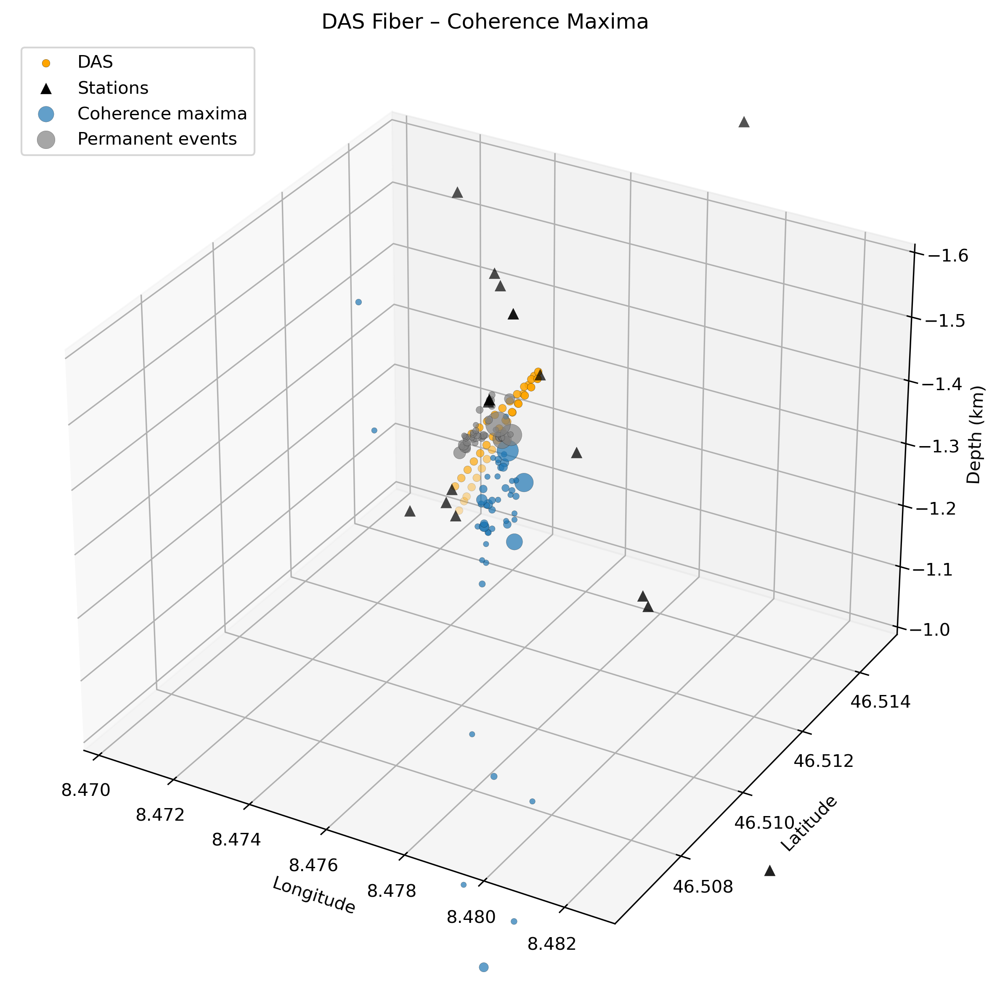

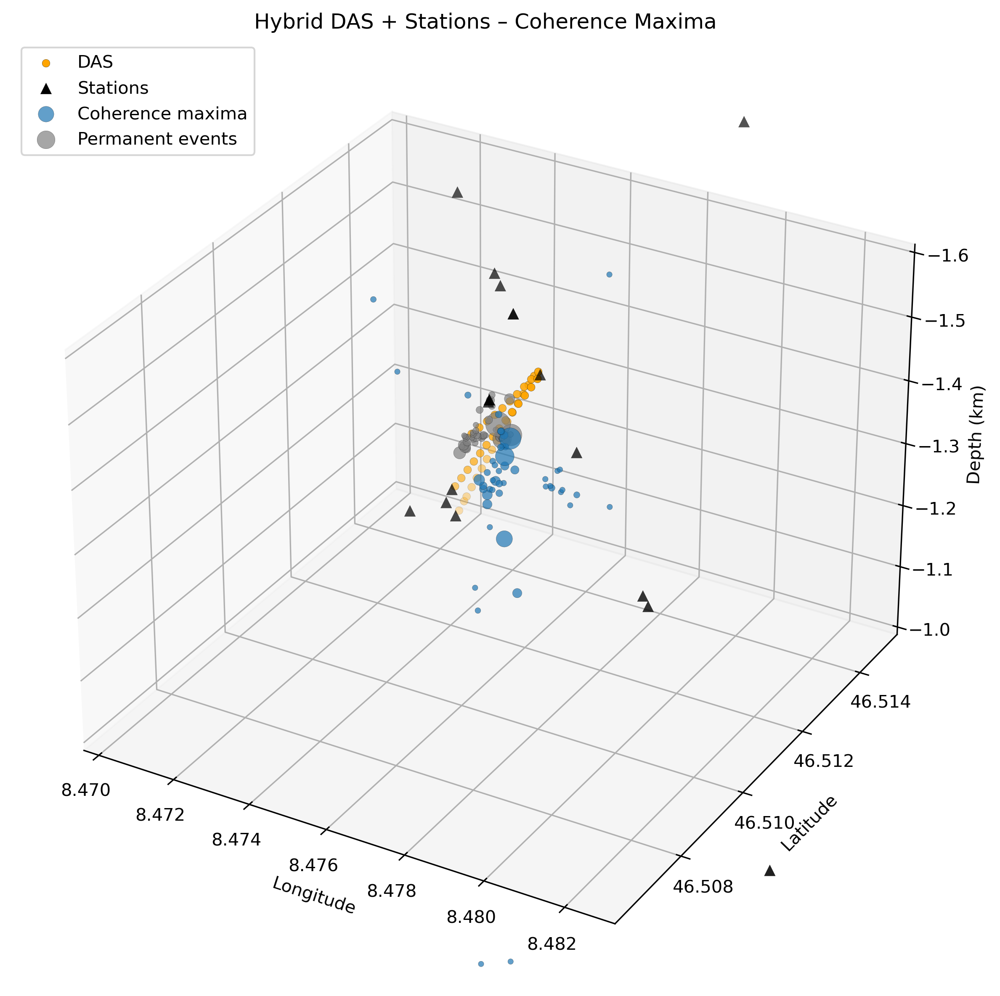

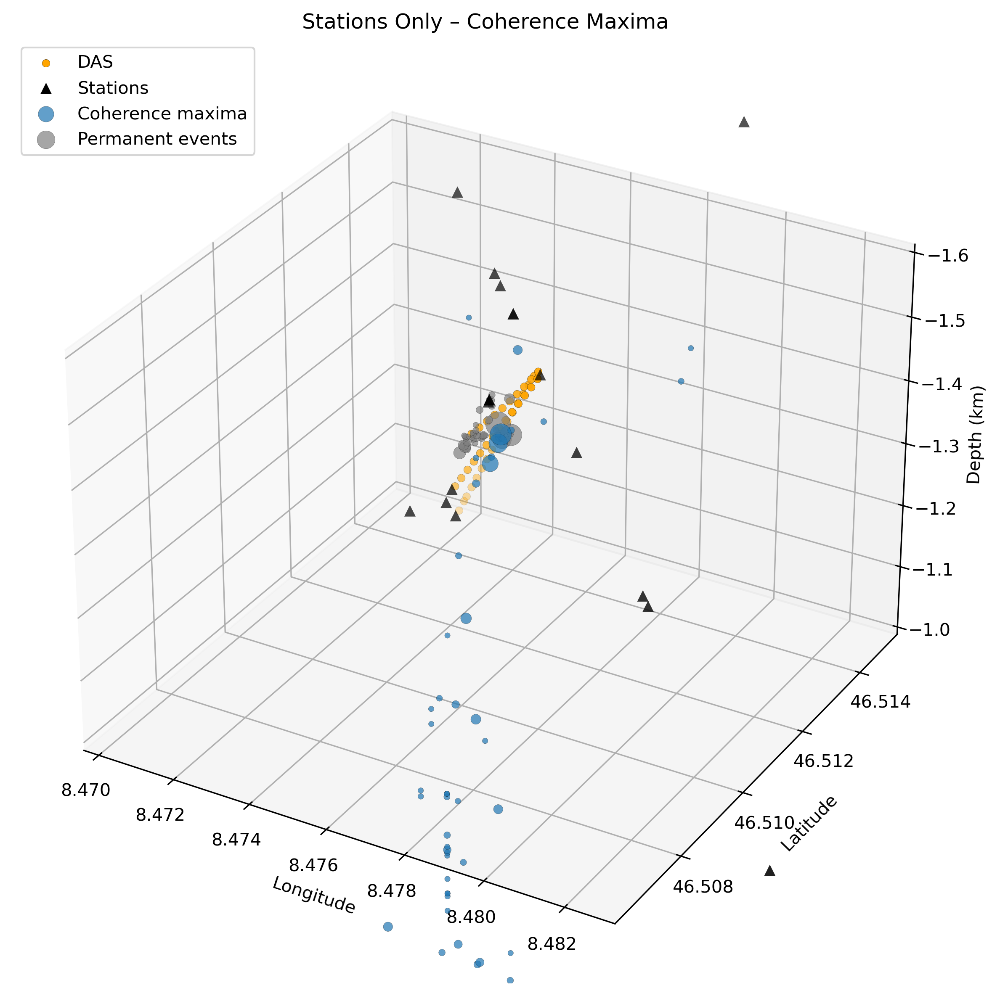

In [1]:
import pandas as pd
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# -----------------------------
# Reference coordinates
# -----------------------------
ref_lat = 46.49305
ref_lon = 8.4518559
earth_radius = 6371.0  # km

# -----------------------------
# Station geometry (lat, lon, elev[km])
# -------------------
# -----------------------------
# Convert elevation → depth
# -----------------------------
def elev_to_depth(elev_km):
    return -elev_km

# -----------------------------
# Grid definition
# -----------------------------
nx = ny = nz = 1001
dx = dy = dz = 0.005  # km

x = np.linspace(0, 5, nx)
y = np.linspace(0, 5, ny)
z = np.linspace(0, 5, nz)  # depth (km)


# --- Station Geometry ---
sta = {
    "BTAO": (46.52964, 8.59026, 1.3116),
    "BTAP": (46.51812, 8.47682, 2.70497),
    "BTCP": (46.49485, 8.47078, 1.9910),
    "BTNF": (46.47739, 8.36925, 1.9237),
    "BTPT": (46.49305, 8.48771, 1.5640),
    "BTRH": (46.54555, 8.48623, 2.5478),
    "BTRN": (46.50012, 8.49865, 1.4980),
    "GSF03": (46.57738, 8.39105, 2.4030),
    "T0498": (46.500972, 8.490454, 1.4812),
    "T1272": (46.50597, 8.48389, 1.48291),
    "T1277": (46.5061808, 8.4836008, 1.483039),
    "T1755": (46.509295, 8.479507, 1.48416),
    "T2028": (46.51109751, 8.4771154, 1.48549),
    "T2246": (46.512585, 8.475187, 1.48697),
    "T2247": (46.512585, 8.475187, 1.48697),
    "T2347": (46.51328659, 8.474261548, 1.48778),
    "T2400": (46.5136063, 8.4738397, 1.48798),
    "T2700": (46.5157422, 8.4710314, 1.49005),
    "T3500": (46.5209128, 8.4641667, 1.49482),
    "T4912": (46.5303416, 8.4518559, 1.5042),
    "T5200": (46.53074, 8.45084, 1.5053),
    "V0101": (46.50979941, 8.474849352, 1.28995),
    "V0401": (46.50992683, 8.475684419, 1.31232),
    "V0501": (46.51002093, 8.475752935, 1.32992),
    "V0701": (46.51067617, 8.476143751, 1.44496),
    "V0801": (46.5100849, 8.475792078, 1.28619),
    "Z1701": (46.510742, 8.476111, 1.4449),
    "Z1801": (46.510742, 8.476111, 1.4449),
}



das = {
    "0": (46.51117388228803, 8.477002836024479, 1.485022769497359),
    "10": (46.51109362185419, 8.476891135352052, 1.4748773870790801),
    "20": (46.51101167235938, 8.476778841068812, 1.4649402234052),
    "30": (46.510928562532285, 8.476667110466991, 1.4550855528413031),
    "40": (46.510842892239914, 8.476553251617887, 1.4456554833287238),
    "50": (46.51075426062536, 8.476437080385669, 1.436744576198073),
    "60": (46.510663125571405, 8.476318695112875, 1.428331351729287),
    "70": (46.5105691740487, 8.476199320552205, 1.4203973553057319),
    "80": (46.51047397224248, 8.476080335455169, 1.412614721089162),
    "90": (46.51037853878461, 8.475961251467826, 1.40487547096938),
    "100": (46.51019520730891, 8.47591692851893, 1.3065019669820541),
    "110": (46.51012031681824, 8.475849822334675, 1.293850469761536),
    "120": (46.511055715207206, 8.477082361976963, 1.480226018365028),
    "130": (46.51098003455409, 8.476983691487437, 1.468917801146866),
    "140": (46.51090330920477, 8.476884988859537, 1.457699125971678),
    "150": (46.510824732912695, 8.476787972373112, 1.4465529612196841),
    "160": (46.5107461891643, 8.476690487311947, 1.435427957708539),
    "170": (46.51066784627063, 8.476591567501076, 1.424359961756596),
    "180": (46.51058885915287, 8.476493298669144, 1.413315104346548),
    "190": (46.51050988777837, 8.476395929593558, 1.4022218515574751),
    "200": (46.510432284592376, 8.47629798970954, 1.391038727272279),
    "210": (46.510354722721544, 8.476200656594461, 1.37982098874829),
    "220": (46.51027740698342, 8.476103674315395, 1.3685647067640372),
    "230": (46.5102000616682, 8.476007171981085, 1.3572868480248752),
    "240": (46.51012267559671, 8.475910747476536, 1.346008417287316),
    "250": (46.51004464248322, 8.475814199257798, 1.334791701754418),
    "260": (46.51116682382971, 8.47690623223654, 1.477288089415411),
    "270": (46.5110968253803, 8.47682315154027, 1.464847841242926),
    "280": (46.51102596468219, 8.476743171201976, 1.452348953467553),
    "290": (46.51095364086239, 8.47666552885672, 1.439867370894928),
    "300": (46.51088248385917, 8.47658889477018, 1.4272669302951462),
    "310": (46.51081340465495, 8.47651253992642, 1.414514160392275),
    "320": (46.510745194135566, 8.476437899843908, 1.401644340831496),
    "330": (46.51067528603765, 8.476365287216192, 1.388819469736375),
    "340": (46.51060519832883, 8.476293616149945, 1.375975491359243),
    "350": (46.510533607916834, 8.476222787100637, 1.363207052539112),
    "360": (46.51045966865964, 8.476153724842671, 1.350548411783915),
    "370": (46.51038392058217, 8.47608594400964, 1.337981621153042),
    "380": (46.51030806880711, 8.47601815418308, 1.325422817516368),
    "390": (46.510232735322155, 8.47595054788133, 1.312819603913941),
}



#import pandas as pd
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# -----------------------------
# Reference coordinates
# -----------------------------
ref_lat = 46.49305
ref_lon = 8.4518559
earth_radius = 6371.0  # km

# -----------------------------
# Station geometry (lat, lon, elev[km])
# -----------------------------
def elev_to_depth(elev_km):
    return -elev_km

# --- Load DAS and stations ---
# (same dictionaries `sta` and `das` as before)

# -----------------------------
# Paths
# -----------------------------
BASE_DIR = "/home/emanuele/data/emanuele/loki-das/bedretto/output_first_50_events_magnitude_geophones_only_denoised_tkeo_full"
CSV_FILE = "/home/emanuele/data/emanuele/loki-das/bedretto/Bedretto_DAS/experiment_incl_permanent_2024_08_15_17_00_00__2024_09_10_15_00_00_xyz_permanent_events_only.csv"

# -----------------------------
# Load permanent events CSV
# -----------------------------
# -----------------------------
# Load permanent events CSV
# -----------------------------
df_perm = pd.read_csv(CSV_FILE)
df_perm.columns = [c.strip() for c in df_perm.columns]  # strip spaces
perm_events = df_perm[['latitude', 'longitude', 'depth', 'permanent magnitude']].dropna()

# Only take the first 50 events
perm_events = perm_events.head(50)

print(f"Loaded {len(perm_events)} permanent events from CSV (first 50)")


# -----------------------------
# Function to select best sparse
# -----------------------------
def select_best_sparse(folder, loc_filename):
    loc_path = os.path.join(folder, loc_filename)
    if not os.path.isfile(loc_path):
        raise FileNotFoundError(f"Missing loc file: {loc_path}")

    catalog = np.loadtxt(loc_path)
    if catalog.ndim == 1:
        catalog = catalog[np.newaxis, :]

    candidates = glob.glob(os.path.join(folder, "*corrmatrix_sparse*.npz"))
    if not candidates:
        raise FileNotFoundError(f"No sparse matrices in {folder}")

    best_file = max(candidates, key=lambda f: float(np.load(f)["values"].max()))
    return best_file, None

# -----------------------------
# Extract 3D coherence maxima
# -----------------------------
nx = ny = nz = 1001
x = np.linspace(0, 5, nx)
y = np.linspace(0, 5, ny)
z = np.linspace(0, 5, nz)  # depth (km)
from scipy.ndimage import gaussian_filter, uniform_filter

def extract_max_3d(sparse_file, boundary=1):
    data = np.load(sparse_file)
    indices = data["indices"]
    values = data["values"]
    nnz = int(data["nnz"])
    nx, ny, nz = data["shape"]

    flat = np.zeros(nx * ny * nz, dtype=values.dtype)
    flat[indices[:nnz]] = values[:nnz]
    cube = flat.reshape((nx, ny, nz))

    cube = cube[boundary:-boundary,
                boundary:-boundary,
                boundary:-boundary]

    ix, iy, iz = np.unravel_index(np.nanargmax(cube), cube.shape)

    x_km = x[ix + boundary]
    y_km = y[iy + boundary]
    z_km = z[iz + boundary]

    lat = ref_lat + (y_km / earth_radius) * (180 / np.pi)
    lon = ref_lon + (x_km / (earth_radius * np.cos(np.radians(ref_lat)))) * (180 / np.pi)

    return lat, lon, z_km

# -----------------------------
# Collect maxima
# -----------------------------
results = {"fiber": [], "hybrid_gilbert": [], "stations": []}

for event in sorted(os.listdir(BASE_DIR)):
    event_path = os.path.join(BASE_DIR, event)
    if not os.path.isdir(event_path):
        continue

    for key in results.keys():
        sub = os.path.join(event_path, key)
        if not os.path.isdir(sub):
            continue
        try:
            loc_filename = f"{key}.loc"
            sparse, _ = select_best_sparse(sub, loc_filename)
            lat, lon, depth = extract_max_3d(sparse)
            event_idx = len(results[key])
            if event_idx < len(perm_events):
                mag = perm_events.iloc[event_idx]['permanent magnitude']
            else:
                mag = np.nan

            results[key].append((lon, lat, depth, mag))

        except Exception as e:
            print(f"Skipping {event} ({key}): {e}")

# -----------------------------
# Plotting 3D with DAS, stations, coherence maxima, permanent events
# -----------------------------
def plot_3d(points, title, perm_events=None, zoom_km=0.5):
    if not points and perm_events is None:
        return

    fig = plt.figure(figsize=(10, 8), dpi=300)
    ax = fig.add_subplot(111, projection="3d")

    # --- DAS cable ---
    das_lons = [v[1] for v in das.values()]
    das_lats = [v[0] for v in das.values()]
    das_depths = np.clip([elev_to_depth(v[2]) for v in das.values()], -1.6, -1)
    ax.scatter(das_lons, das_lats, das_depths, c="orange", marker="o", s=20, edgecolors="k", lw=0.1, label="DAS")

    # --- Stations ---
    sta_lons = [v[1] for v in sta.values()]
    sta_lats = [v[0] for v in sta.values()]
    sta_depths = np.clip([elev_to_depth(v[2]) for v in sta.values()], -1.6, -1)
    ax.scatter(sta_lons, sta_lats, sta_depths, c="black", marker="^", s=40, edgecolors="k", lw=0.1, label="Stations")

    # --- Coherence maxima ---
    if points:
        lons, lats, depths, mags = zip(*points)
        depths = np.clip([-d for d in depths], -2, 0)

        mags = np.array(mags, dtype=float)
        valid = np.isfinite(mags)

        min_size, max_size = 10, 150
        mags_norm = (mags[valid] - mags[valid].min()) / (mags[valid].ptp() + 1e-6)
        sizes = min_size + mags_norm**2 * (max_size - min_size)

        ax.scatter(
            np.array(lons)[valid],
            np.array(lats)[valid],
            np.array(depths)[valid],
            s=sizes,
            edgecolors="k",
            alpha=0.7,
            lw=0.1,
            label="Coherence maxima"
        )

    # --- Permanent events from CSV ---
# --- Permanent events from CSV ---
    if perm_events is not None and not perm_events.empty:
        perm_lats = perm_events['latitude'].values
        perm_lons = perm_events['longitude'].values
        perm_depths = np.clip(perm_events['depth'].values / 1000, -1.6, -1)
        mags = perm_events['permanent magnitude'].values

        # Robust magnitude → size scaling
        min_size, max_size = 10, 200
        mags_norm = (mags - mags.min()) / (mags.max() - mags.min() + 1e-6)
        sizes = min_size + mags_norm**2 * (max_size - min_size)

        ax.scatter(
            perm_lons, perm_lats, perm_depths,
            s=sizes,
            c='grey',
            edgecolors='k',
            lw=0.1,
            alpha=0.7,
            label='Permanent events'
        )


    # --- Zoom around DAS center ---
    center_lat = np.mean(das_lats)
    center_lon = np.mean(das_lons)
    km_to_deg_lat = 1 / 111.0
    km_to_deg_lon = 1 / (111.0 * np.cos(np.radians(center_lat)))

    ax.set_xlim(center_lon - zoom_km * km_to_deg_lon, center_lon + zoom_km * km_to_deg_lon)
    ax.set_ylim(center_lat - zoom_km * km_to_deg_lat, center_lat + zoom_km * km_to_deg_lat)

    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_zlabel("Depth (km)")
    ax.set_zlim(-1.6, -1)
    ax.set_title(title)
    ax.invert_zaxis()
    ax.legend()
    plt.tight_layout()
    plt.show()


# -----------------------------
# Plotting
# -----------------------------
plot_3d(results["fiber"], "DAS Fiber – Coherence Maxima", perm_events=perm_events, zoom_km=0.5)
plot_3d(results["hybrid_gilbert"], "Hybrid DAS + Stations – Coherence Maxima", perm_events=perm_events, zoom_km=0.5)
plot_3d(results["stations"], "Stations Only – Coherence Maxima", perm_events=perm_events, zoom_km=0.5)






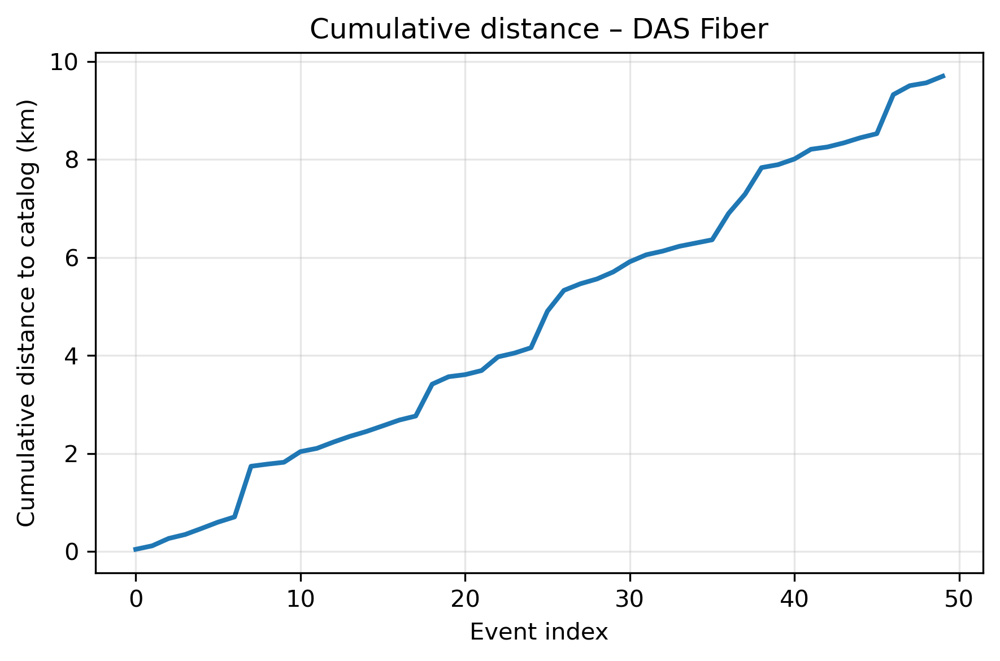

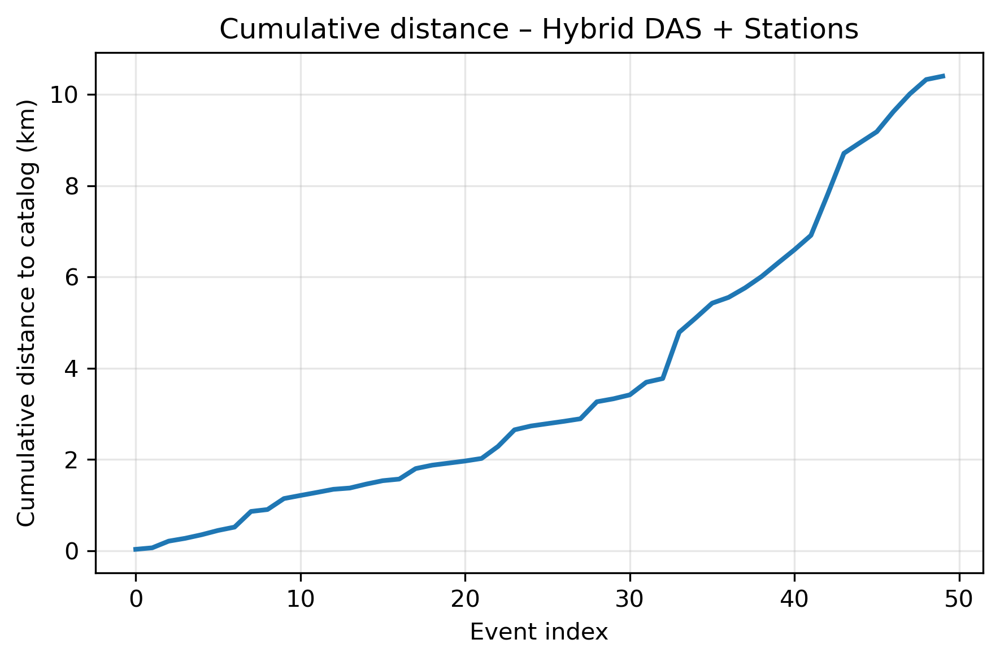

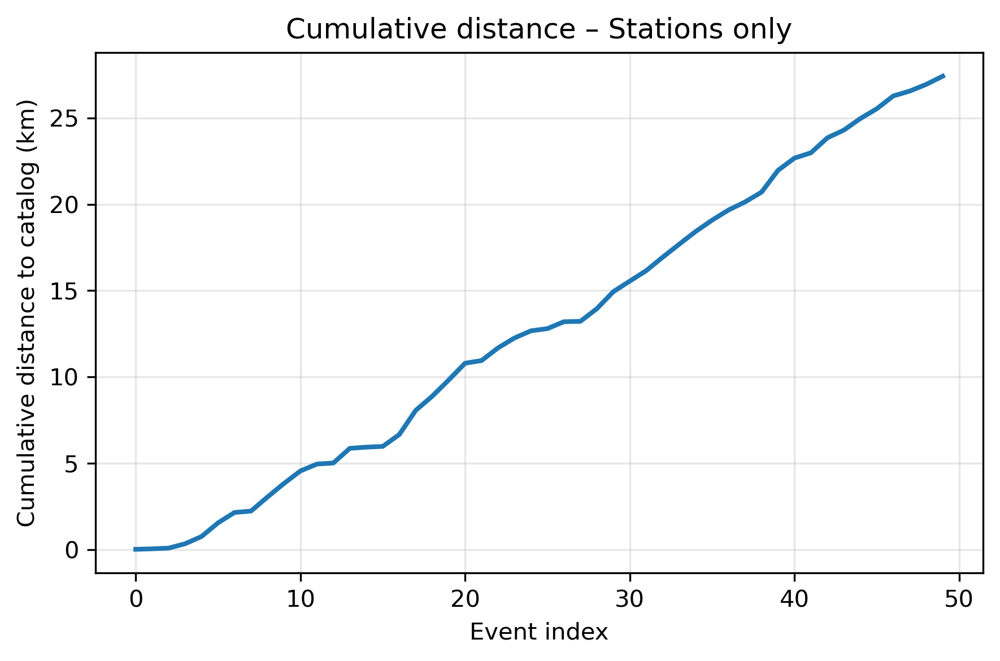

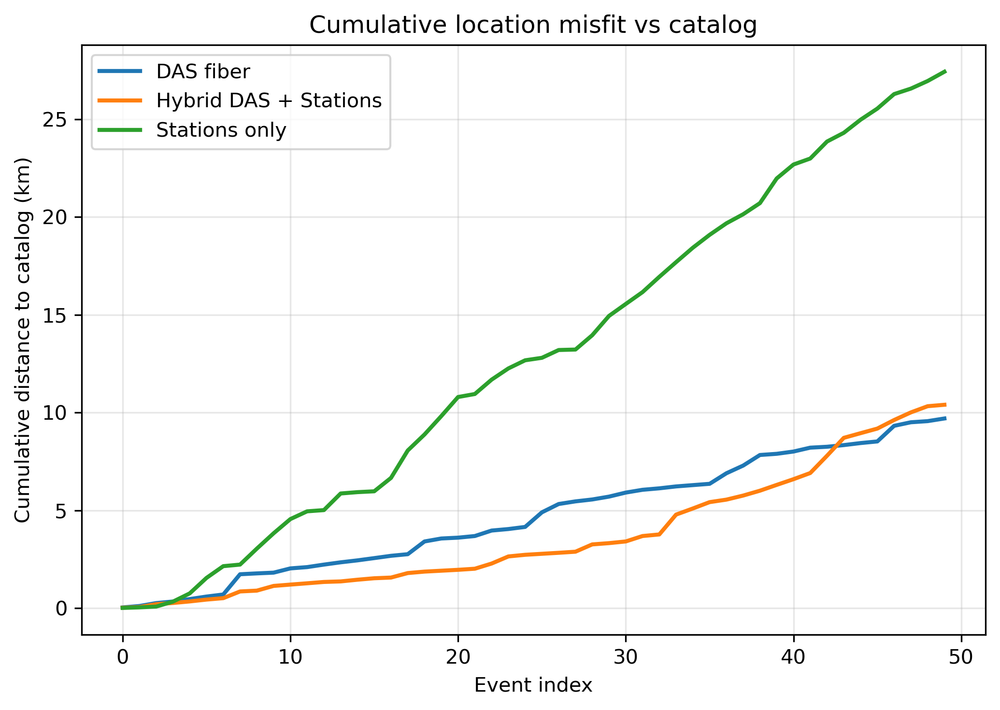

In [2]:
# ==============================================================
# DISTANCE TO CATALOG & CUMULATIVE MISFIT ANALYSIS
# ==============================================================

# -----------------------------
# 3D distance function
# -----------------------------
def haversine_3d(lon1, lat1, z1, lon2, lat2, z2, R=6371.0):
    """
    3D distance between two points (lon, lat in degrees, depth in km)
    """
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    dh = R * c  # horizontal distance [km]

    dv = z2 - z1  # vertical distance [km]

    return np.sqrt(dh**2 + dv**2)


# -----------------------------
# Distance to catalog
# -----------------------------
def distance_to_catalog(points, catalog):
    """
    points  : [(lon, lat, depth_km, mag), ...]
    catalog : dataframe with latitude, longitude, depth (m)
    """
    distances = []
    lon_list = []
    lat_list = []
    z_list = []
    lon_c_list = []
    lat_c_list = []
    z_c_list = []

    n = min(len(points), len(catalog))
    for i in range(n):
        lon, lat, z, _ = points[i]

        lat_c = catalog.iloc[i]["latitude"]
        lon_c = catalog.iloc[i]["longitude"]
        z_c   = catalog.iloc[i]["depth"] / 1000.0  # m → km

        lon_list.append(lon)
        lat_list.append(lat)
        z_list.append(z)
        lon_c_list.append(lon_c)
        lat_c_list.append(lat_c)
        z_c_list.append(z_c)
        d = haversine_3d(lon, lat, -z, lon_c, lat_c, z_c)
        distances.append(d)

    return np.array(distances), np.array(lon_list), np.array(lat_list), np.array(z_list), np.array(lon_c_list), np.array(lat_c_list), np.array(z_c_list)
# -----------------------------
# Compute distances & cumulative sums
# -----------------------------
dist_fiber ,   lon_fiber,   lat_fiber,   z_fiber,   lon_c_fiber,   lat_c_fiber,   z_c_fiber = distance_to_catalog(results["fiber"], perm_events)
dist_hybrid  , lon_hybrid,  lat_hybrid,  z_hybrid,  lon_c_hybrid,  lat_c_hybrid,  z_c_hybrid = distance_to_catalog(results["hybrid_gilbert"], perm_events)
dist_station , lon_station, lat_station, z_station, lon_c_station, lat_c_station, z_c_station = distance_to_catalog(results["stations"], perm_events)

cum_fiber   = np.cumsum(dist_fiber)
cum_hybrid  = np.cumsum(dist_hybrid)
cum_station = np.cumsum(dist_station)


# -----------------------------
# Individual cumulative plots
# -----------------------------
def plot_cumulative(cum_dist, title):
    plt.figure(figsize=(6, 4), dpi=300)
    plt.plot(cum_dist, lw=2)
    plt.xlabel("Event index")
    plt.ylabel("Cumulative distance to catalog (km)")
    plt.title(title)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


plot_cumulative(cum_fiber,   "Cumulative distance – DAS Fiber")
plot_cumulative(cum_hybrid,  "Cumulative distance – Hybrid DAS + Stations")
plot_cumulative(cum_station, "Cumulative distance – Stations only")


# -----------------------------
# Comparison plot (recommended)
# -----------------------------
plt.figure(figsize=(7, 5), dpi=300)
plt.plot(cum_fiber,   label="DAS fiber", lw=2)
plt.plot(cum_hybrid,  label="Hybrid DAS + Stations", lw=2)
plt.plot(cum_station, label="Stations only", lw=2)

plt.xlabel("Event index")
plt.ylabel("Cumulative distance to catalog (km)")
plt.title("Cumulative location misfit vs catalog")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


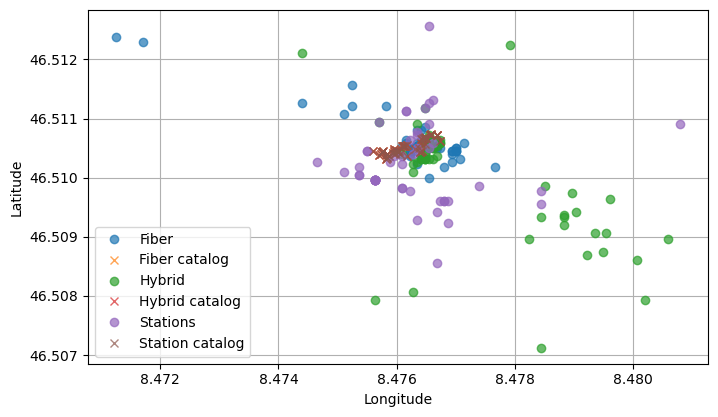

In [3]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))

# Fiber
plt.plot(lon_fiber, lat_fiber, 'o', label='Fiber', alpha=0.7)
plt.plot(lon_c_fiber, lat_c_fiber, 'x', label='Fiber catalog', alpha=0.7)

# Hybrid
plt.plot(lon_hybrid, lat_hybrid, 'o', label='Hybrid', alpha=0.7)
plt.plot(lon_c_hybrid, lat_c_hybrid, 'x', label='Hybrid catalog', alpha=0.7)

# Stations
plt.plot(lon_station, lat_station, 'o', label='Stations', alpha=0.7)
plt.plot(lon_c_station, lat_c_station, 'x', label='Station catalog', alpha=0.7)

# Make sure lon/lat aren’t distorted
plt.gca().set_aspect('equal', adjustable='box')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True)

plt.show()


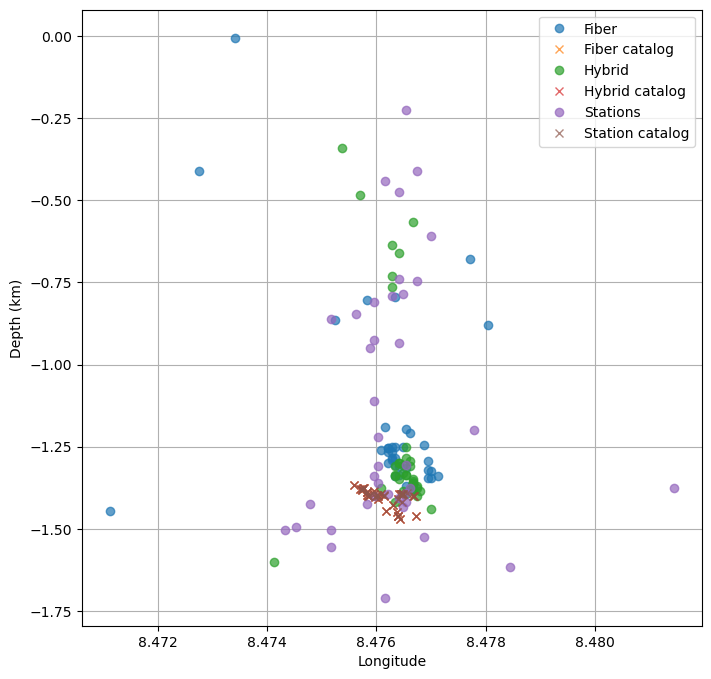

In [4]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))

# Fiber
plt.plot(lon_fiber, -z_fiber, 'o', label='Fiber', alpha=0.7)
plt.plot(lon_c_fiber, z_c_fiber, 'x', label='Fiber catalog', alpha=0.7)

# Hybrid
plt.plot(lon_hybrid, -z_hybrid, 'o', label='Hybrid', alpha=0.7)
plt.plot(lon_c_hybrid, z_c_hybrid, 'x', label='Hybrid catalog', alpha=0.7)
# Stations
plt.plot(lon_station, -z_station, 'o', label='Stations', alpha=0.7)
plt.plot(lon_c_station, z_c_station, 'x', label='Station catalog', alpha=0.7)

# Make sure lon/lat aren’t distorted
#plt.gca().set_aspect('equal', adjustable='box')

plt.xlabel('Longitude')
plt.ylabel('Depth (km)')
plt.legend()
plt.grid(True)

plt.show()


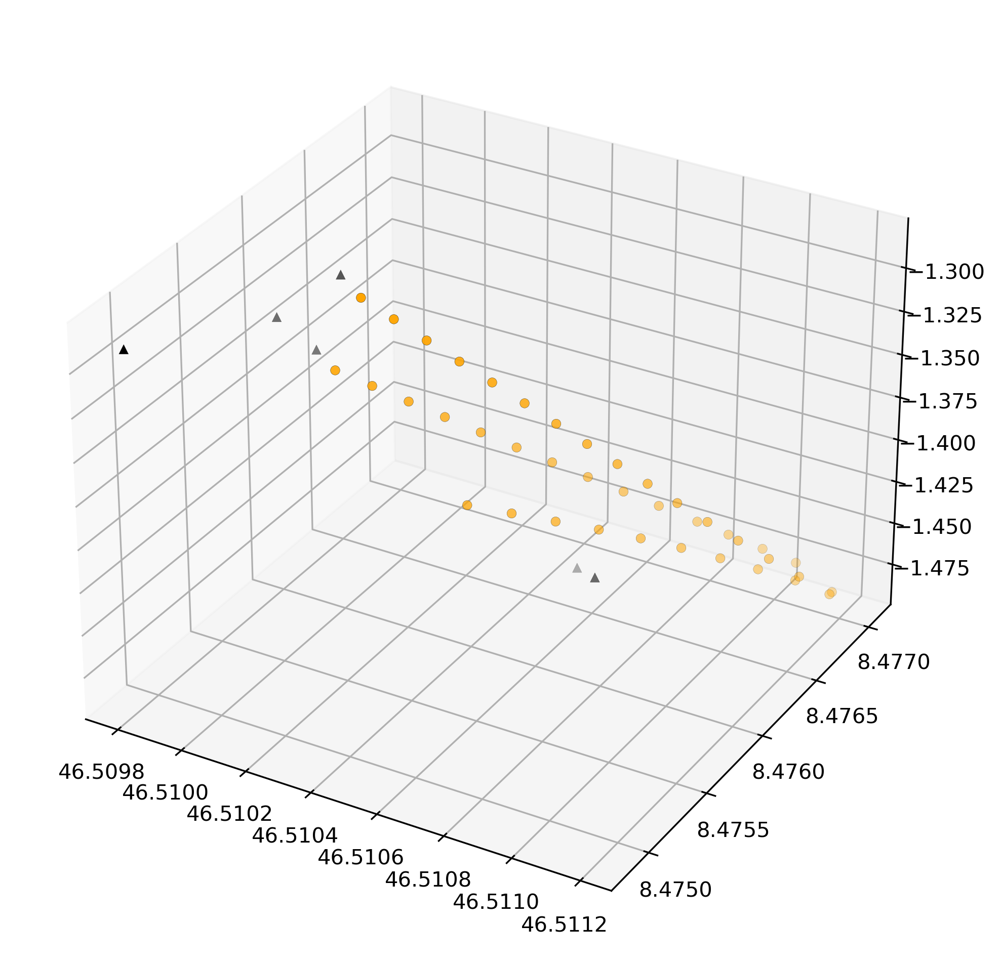

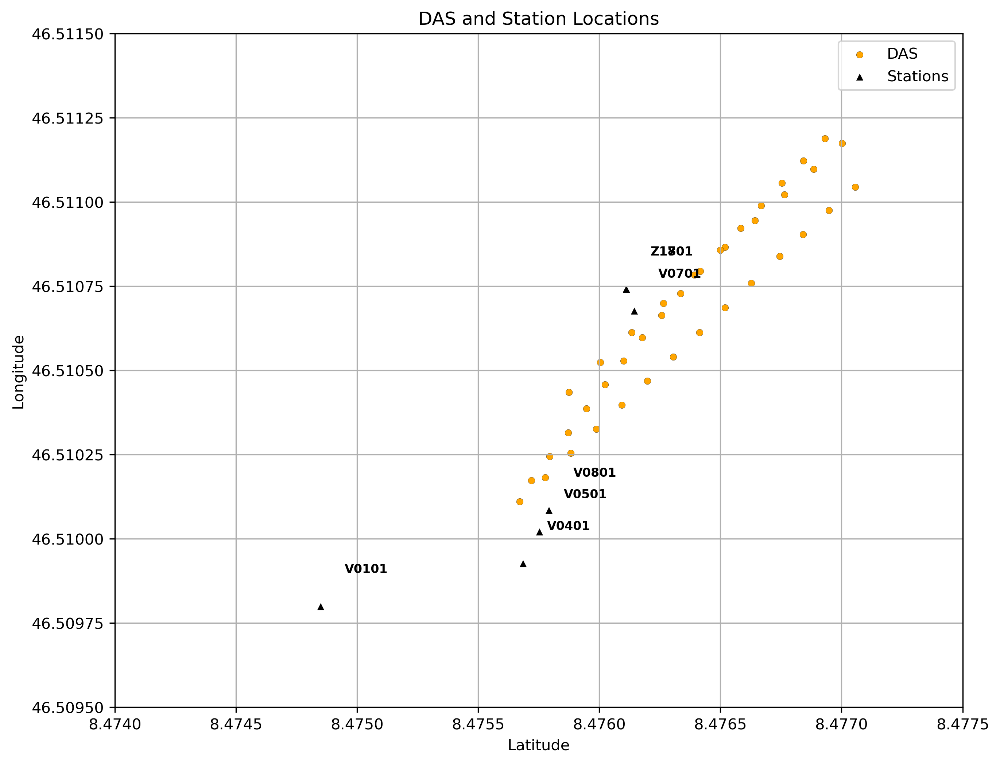

In [42]:
# --- Station Geometry ---
sta = {
    "V0101": (46.50979941, 8.474849352, 1.28995),
    "V0401": (46.50992683, 8.475684419, 1.31232),
    "V0501": (46.51002093, 8.475752935, 1.32992),
    "V0701": (46.51067617, 8.476143751, 1.44496),
    "V0801": (46.5100849, 8.475792078, 1.28619),
    "Z1701": (46.510742, 8.476111, 1.4449),
    "Z1801": (46.510742, 8.476111, 1.4449),
}



das = {
    "0":   (46.511173967933885, 8.477002707294663, 1.4850231296),
    "10":  (46.51109768727272, 8.476884896680229, 1.4749029376),
    "20":  (46.5110212968631,  8.476764652900954, 1.4649624576000002),
    "30":  (46.51094472454545, 8.476643275722061, 1.4551209984),
    "40":  (46.51086568198347, 8.476519557353491, 1.4457025536),
    "50":  (46.51078384114984, 8.476393169533306, 1.4368026623999999),
    "60":  (46.51069958978081, 8.47626430882604, 1.4284036096),
    "70":  (46.510612824477185, 8.476133789976227, 1.4204853248),
    "80":  (46.51052429132591, 8.47600427282863,  1.4127137792000002),
    "90":  (46.51043493954725, 8.475875381797131, 1.4049969152000001),
    "100": (46.511188365964784, 8.47693110897684,  1.480986112),
    "110": (46.511122026460654, 8.476842594748044, 1.4685172736),
    "120": (46.51105660707869,  8.47675390859838,  1.4559953920000002),
    "130": (46.51098942468559,  8.47666768547833,  1.4434882560000002),
    "140": (46.5109222460654,   8.476583378590979, 1.4309045248),
    "150": (46.51085738699964,  8.476499110715796, 1.4181692416),
    "160": (46.510794024146605, 8.476416626540532, 1.4052731904),
    "170": (46.51072892260151,  8.476336030654558, 1.3924145152),
    "180": (46.51066369660079,  8.47625666561509,  1.3795185664),
    "190": (46.510597156234276, 8.476177712918389, 1.3666913280000001),
    "200": (46.51052853451671,  8.476100064581491, 1.3539538944),
    "210": (46.51045758325548,  8.476023651351529, 1.341330944),
    "220": (46.510386087114625, 8.475947411462581, 1.3287397375999999),
    "230": (46.5103150721236,   8.475871375489495, 1.3161075711999999),
    "240": (46.51024438897593,  8.475795693883917, 1.3034399744),
    "250": (46.510173867897954, 8.47572044700925,  1.2907459584),
    "260": (46.51104506783327,  8.477056456458559, 1.4779394047999999),
    "270": (46.51097559846209,  8.476948246973153, 1.4666493952000001),
    "280": (46.51090425504132,  8.47684094855141,  1.455453696),
    "290": (46.51083872225656,  8.476745407662676, 1.4454254592),
    "300": (46.51075882233561,  8.476627876941768, 1.4331956224),
    "310": (46.510686331800215, 8.47651975366741,  1.422138368),
    "320": (46.51061302957959,  8.476413009101533, 1.4110691328),
    "330": (46.51054032452749,  8.476306110742494, 1.399960064),
    "340": (46.5104689103701,   8.476199157666173, 1.3887504384),
    "350": (46.510397173740564, 8.476093060602077, 1.3775183872),
    "360": (46.51032578740927,  8.475987659241095, 1.3662205952),
    "370": (46.510254163406394, 8.475882234573058, 1.3549425664),
    "380": (46.51018247455264,  8.475777287323766, 1.343643648),
    "390": (46.51011019002515,  8.475671475959075, 1.332439552),
}



fig = plt.figure(figsize=(10, 8), dpi=300)
ax = fig.add_subplot(111, projection="3d")

# --- DAS cable ---
das_lons = [v[1] for v in das.values()]
das_lats = [v[0] for v in das.values()]
#das_depths = [v[2] for v in das.values()]
das_depths = np.clip([elev_to_depth(v[2]) for v in das.values()], -2, -1)
ax.scatter(das_lats, das_lons, das_depths, c="orange", marker="o", s=20, edgecolors="k", lw=0.1, label="DAS")

# --- Stations ---
sta_lons = [v[1] for v in sta.values()]
sta_lats = [v[0] for v in sta.values()]
#sta_depths = [v[2] for v in sta.values()]
sta_depths = np.clip([elev_to_depth(v[2]) for v in sta.values()], -2, -1)
ax.scatter(sta_lats, sta_lons,sta_depths, c="black", marker="^", s=20, edgecolors="k", lw=0.1, label="Stations")



fig = plt.figure(figsize=(10, 8), dpi=300)

# Scatter DAS
plt.scatter(das_lons, das_lats, c="orange", marker="o", s=20, edgecolors="k", lw=0.1, label="DAS")

# Scatter Stations
plt.scatter(sta_lons, sta_lats, c="black", marker="^", s=20, edgecolors="k", lw=0.1, label="Stations")

# Annotate station names
for name, (lat, lon, _) in sta.items():
    plt.text(lon + 0.0001, lat + 0.0001, name, fontsize=8, color="black", weight="bold")
plt.ylim(46.5095, 46.5115)
plt.xlim(8.474, 8.4775)
plt.xlabel("Latitude")
plt.ylabel("Longitude")
plt.title("DAS and Station Locations")
plt.legend()
plt.grid(True)
plt.show()


In [9]:
def haversine(lat1, lon1, lat2, lon2):
    """
    Compute Haversine distance between two points (in km)
    """
    R = 6371  # Earth radius in km
    lat1_rad, lon1_rad = np.radians(lat1), np.radians(lon1)
    lat2_rad, lon2_rad = np.radians(lat2), np.radians(lon2)
    
    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad
    
    a = np.sin(dlat/2)**2 + np.cos(lat1_rad) * np.cos(lat2_rad) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    return R * c

# -----------------------------
# --- Compute distances ---
# -----------------------------
distances = []
for (max_lat, max_lon, _), (csv_lat, csv_lon) in zip(all_maxima, csv_refs):
    if not (np.isnan(max_lat) or np.isnan(csv_lat)):
        d = haversine(max_lat, max_lon, csv_lat, csv_lon)
        distances.append(d)

if distances:
    avg_distance = np.mean(distances)
    print(f"Average distance between extracted maxima and CSV reference points: {avg_distance:.6f} km")
else:
    print("No valid distances to compute.")


Average distance between extracted maxima and CSV reference points: 0.392111 km


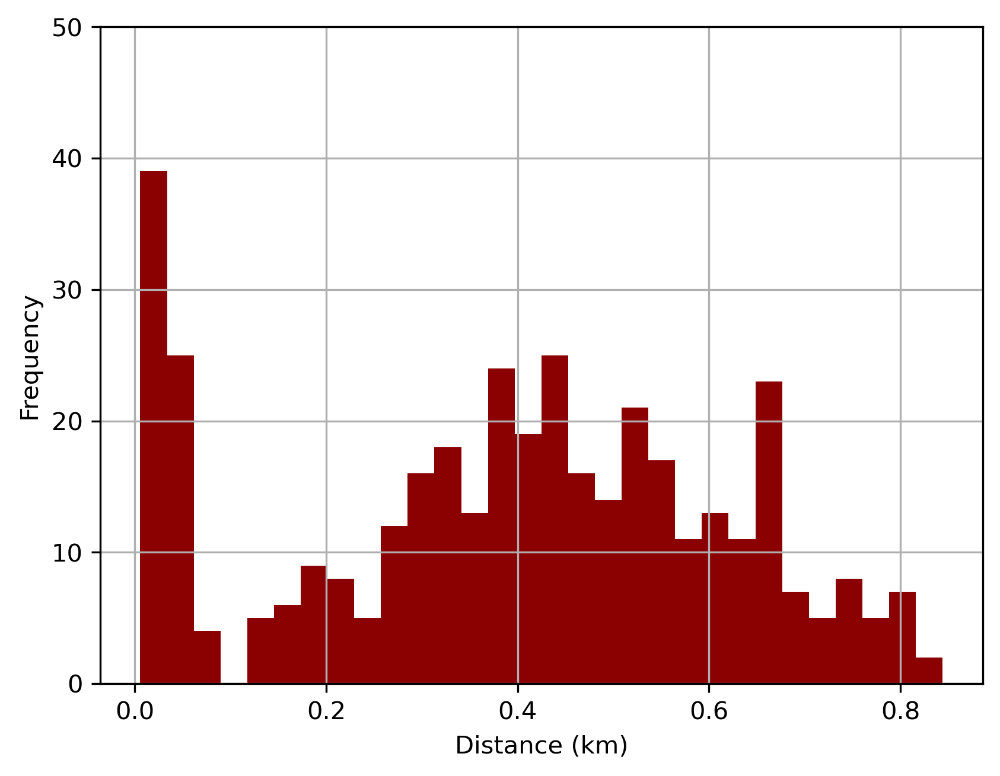

In [10]:
plt.figure(dpi=300)
plt.hist(distances, bins=30, color='darkred')
plt.xlabel("Distance (km)")
plt.ylabel("Frequency")
plt.grid(True)
plt.ylim(0,50)
plt.show()

Collected 3D maxima for 388 events


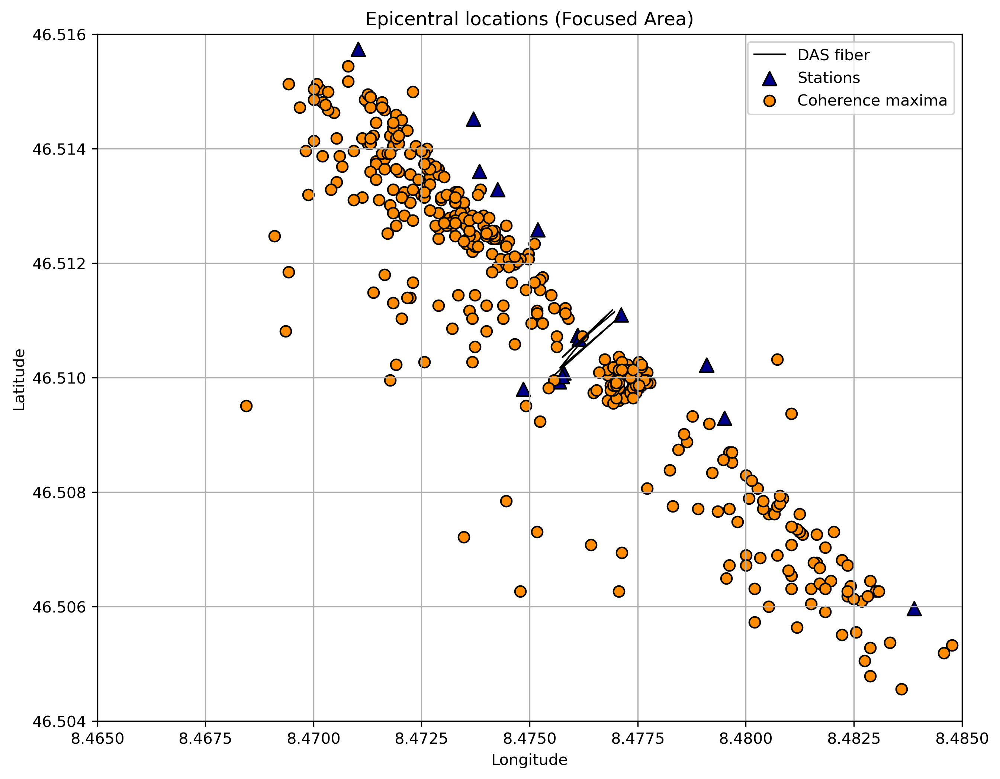

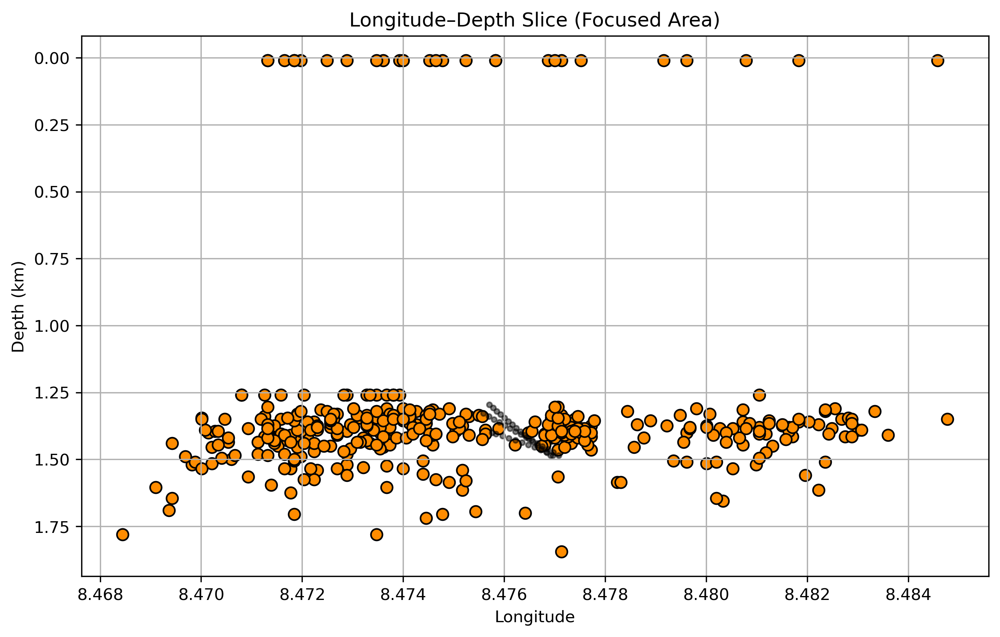

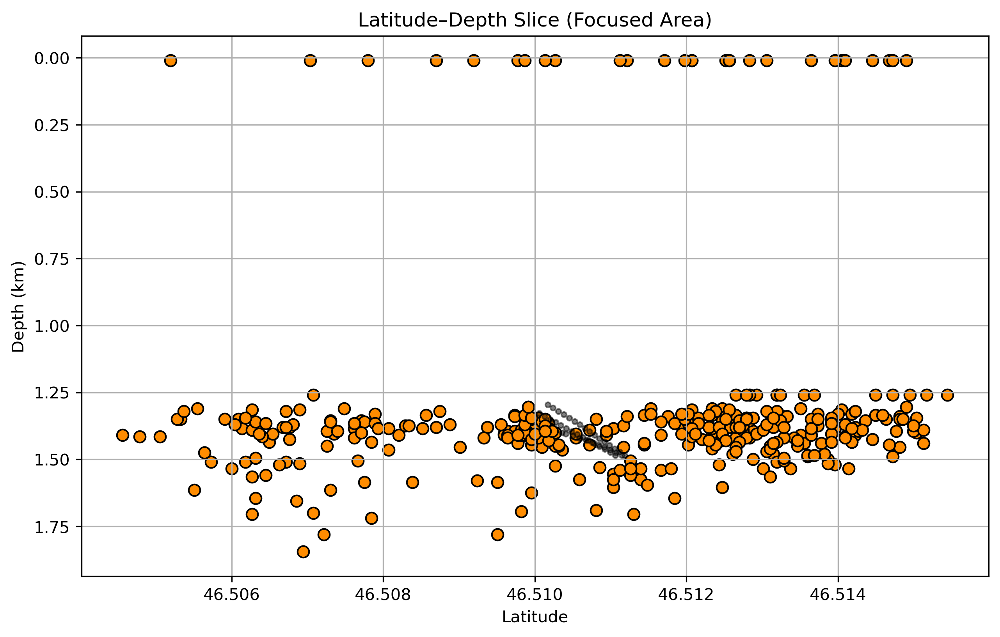

In [55]:
import numpy as np
import os
import glob
import matplotlib.pyplot as plt

# -----------------------------
# --- Reference Coordinates ---
# -----------------------------
ref_lat = 46.49305
ref_lon = 8.4518559

# -----------------------------
# --- Station Geometry ---
# -----------------------------
sta = {
    "GSF03": (46.57738, 8.39105, 2.4030),
    "T4912": (46.5303416, 8.4518559, 1.5042),
    "V0801": (46.5100849, 8.475792078, 1.28619),
    "T0498": (46.500972, 8.490454, 1.4812),
    "BTNF": (46.47739, 8.36925, 1.9237),
    "BTAP": (46.51812, 8.47682, 2.70497),
    "BTRH": (46.54555, 8.48623, 2.5478),
    "T2700": (46.5157422, 8.4710314, 1.49005),
    "T2246": (46.512585, 8.475187, 1.48697),
    "T2400": (46.5136063, 8.4738397, 1.48798),
    "T1755": (46.509295, 8.479507, 1.48416),
    "BTCP": (46.49485, 8.47078, 1.9910),
    "T3500": (46.5209128, 8.4641667, 1.49482),
    "T2347": (46.51328659, 8.474261548, 1.48778),
    "T2028": (46.51109751, 8.4771154, 1.48549),
    "Z1701": (46.510742, 8.476111, 1.4449),
    "Z1801": (46.510742, 8.476111, 1.4449),
    "T1747": (46.510223558208764, 8.479091916717769, None),
    "T1756": (46.510223558208764, 8.479091916717769, None),
    "V0701": (46.51067617, 8.476143751, 1.44496),
    "V0401": (46.50992683, 8.475684419, 1.31232),
    "BTAO": (46.52964, 8.59026, 1.3116),
    "V0101": (46.50979941, 8.474849352, 1.28995),
    "V0501": (46.51002093, 8.475752935, 1.32992),
    "T1272": (46.50597, 8.48389, 1.48291),
    "F1801": (46.51452332083445, 8.47370427127321, None),
}

das = {
    "0":   (46.51114946027361, 8.476964009761309, 1.4850231296),
    "10":  (46.51107317961245, 8.476846203053816, 1.4749029376),
    "20":  (46.51099678920282, 8.476725963262176, 1.4649624576),
    "30":  (46.51092021688518, 8.476604590108504, 1.4551209984),
    "40":  (46.5108411743232,  8.476480875842794, 1.4457025536),
    "50":  (46.51075933348957, 8.476354492213998, 1.4368026624),
    "60":  (46.510675082120535,8.476225635780128, 1.4284036096),
    "70":  (46.51058831681691, 8.4760951212587,   1.4204853248),
    "80":  (46.51049978366563, 8.47596560840627,  1.4127137792),
    "90":  (46.510410431886974,8.47583672164917,  1.4049969152),
    "96":  (46.510356259210006,8.475759300178975, 1.4004573184),
    "97":  (46.5111840075104,  8.476918906087484, 1.48471296),
    "107": (46.511117263823735,8.476830645984025, 1.4722601984),
    "117": (46.51105185408604, 8.476741573836176, 1.459753984),
    "127": (46.51098522451364, 8.47665462711282,  1.4472398848),
    "137": (46.51091763142704, 8.47656998295007,  1.4346970112),
    "147": (46.51085217835482, 8.476485652879173, 1.4220020736),
    "157": (46.51078862750322, 8.47640241853776,  1.4091460608),
    "167": (46.51072406232895, 8.476321175839429, 1.3962778624),
    "177": (46.51065877459628, 8.476241765482808, 1.3833875456),
    "187": (46.51059281693908, 8.476162593618803, 1.3705310208),
    "197": (46.51052498550538, 8.476084532102918, 1.3577558016),
    "207": (46.51045454646837, 8.476007891602071, 1.3451055104),
    "217": (46.510383016349785,8.475931592926718, 1.3325188096),
    "227": (46.510311844118384,8.475855497492187, 1.3198999552),
    "237": (46.51024101954059, 8.475779761425516, 1.307244032),
    "247": (46.51017055520713, 8.47570430286234,  1.29582336),
    "254": (46.511061807021726,8.477082715911758, 1.4847443968),
    "264": (46.5109930062887,  8.476974355161763, 1.4734123008),
    "274": (46.510922808229054,8.476866475511105, 1.462159872),
    "284": (46.51085065037063, 8.476759752612297, 1.450996736),
    "294": (46.510777785950935,8.47665349968178,  1.4398640128),
    "304": (46.51070538636775, 8.476545985831184, 1.4287647744),
    "314": (46.51063266688518, 8.476437999130336, 1.4177186816),
    "324": (46.510559224930454,8.476331796989141, 1.4066301952),
    "334": (46.51048736762539, 8.476224275578621, 1.3954883584),
    "344": (46.51041570516042, 8.476118101338137, 1.384254976),
    "354": (46.51034404177559, 8.476012084978931, 1.3730128896),
    "364": (46.51027264567066, 8.475906954926794, 1.3617011712),
    "374": (46.5102010898532,  8.475801529327587, 1.3504181248),
    "384": (46.5101291325122,  8.475696468609556, 1.339146752),
    "394": (46.51005781595852, 8.475591797367052, 1.327877),
}

# -----------------------------
# --- Grid Parameters ---
# -----------------------------
nx = ny = 1001
dx = dz = 0.005  # km spacing
cartesian_grid_x, cartesian_grid_y = np.meshgrid(
    np.linspace(0, 5, nx), np.linspace(0, 5, ny)
)

# -----------------------------
# --- Paths ---
# -----------------------------
main_base_dir = "/home/emanuele/data/emanuele/loki-das/bedretto/Bedretto_DAS/M0B_snippets_mseed_location"
loc_filename = "fiber.loc"

# -----------------------------
# --- Functions ---
# -----------------------------
def select_highest_coherence_sparse_file(folder, loc_filename):
    loc_file = os.path.join(folder, loc_filename)
    if not os.path.isfile(loc_file):
        raise FileNotFoundError(f"Missing .loc file: {loc_file}")

    catalog = np.loadtxt(loc_file)
    if catalog.ndim == 1:
        catalog = catalog[np.newaxis, :]
    best_trial_idx_loc = int(np.argmax(catalog[:, 4]))

    # Look for 'best' sparse file
    best_files = glob.glob(os.path.join(folder, "corrmatrix_sparse_best_*.npz"))
    if best_files:
        best_file = max(best_files, key=lambda f: float(np.load(f)["values"].max()))
        return best_file, best_trial_idx_loc

    # Fallback: all sparse files
    candidates = glob.glob(os.path.join(folder, "*corrmatrix_sparse*.npz"))
    if not candidates:
        raise FileNotFoundError(f"No sparse files found in {folder}")
    best_file = max(candidates, key=lambda f: float(np.load(f)["values"].max()))
    return best_file, best_trial_idx_loc

def extract_max_coherence_3d_sparse(sparse_file, cartesian_grid_x, cartesian_grid_y,
                                    ref_lat, ref_lon, dz=0.005, boundary_margin=2, z_margin=2):
    """
    Extract (lat, lon, depth) of maximum coherence from a sparse 3D correlation matrix,
    without building the full dense array. Masks edges in x/y/z.
    """
    data = np.load(sparse_file)
    indices = data["indices"][:data["nnz"]]
    values = data["values"][:data["nnz"]]
    nx, ny, nz = data["shape"]

    # Convert flat indices to 3D coordinates
    ix, iy, iz = np.unravel_index(indices, (nx, ny, nz))

    # Apply boundary mask directly
    mask = (ix >= boundary_margin) & (ix < nx - boundary_margin) & \
           (iy >= boundary_margin) & (iy < ny - boundary_margin) & \
           (iz >= z_margin) & (iz < nz - z_margin)

    if not np.any(mask):
        raise ValueError("No valid points after boundary masking.")

    # Index of max coherence among masked values
    max_idx = np.argmax(values[mask])

    ix_max = ix[mask][max_idx]
    iy_max = iy[mask][max_idx]
    iz_max = iz[mask][max_idx]
    max_depth = iz_max * dz

    # Convert Cartesian to geographic coordinates
    earth_radius = 6371  # km
    lat_grid = ref_lat + (cartesian_grid_y / earth_radius) * (180 / np.pi)
    lon_grid = ref_lon + (cartesian_grid_x / (earth_radius * np.cos(np.radians(ref_lat)))) * (180 / np.pi)

    max_lat = lat_grid[ix_max, iy_max]
    max_lon = lon_grid[ix_max, iy_max]

    return max_lat, max_lon, max_depth



# -----------------------------
# --- Collect 3D maxima ---
# -----------------------------
all_maxima_3d = []

for event_folder in sorted(os.listdir(main_base_dir)):
    dataset_path = os.path.join(main_base_dir, event_folder, "fiber")
    if not os.path.isdir(dataset_path):
        continue
    try:
        sparse_file, _ = select_highest_coherence_sparse_file(dataset_path, loc_filename)
        max_lat, max_lon, max_depth = extract_max_coherence_3d_sparse(
            sparse_file, cartesian_grid_x, cartesian_grid_y, ref_lat, ref_lon
        )
        all_maxima_3d.append((max_lat, max_lon, max_depth))
    except Exception as e:
        print(f"Skipping {event_folder}: {e}")
        continue

print(f"Collected 3D maxima for {len(all_maxima_3d)} events")

# -----------------------------
# --- Filter maxima in focused area ---
# -----------------------------
maxima_focus = [(lat, lon, depth) for lat, lon, depth in all_maxima_3d
                if 46.504 <= lat <= 46.516 and 8.465 <= lon <= 8.485]

# -----------------------------
# --- XY Plot ---
# -----------------------------
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)
ax.set_title("Epicentral locations (Focused Area)")

# DAS fiber
das_lats = [v[0] for v in das.values()]
das_lons = [v[1] for v in das.values()]
ax.plot(das_lons, das_lats, 'k-', lw=1, label="DAS fiber")

# Stations
sta_lats = [v[0] for v in sta.values()]
sta_lons = [v[1] for v in sta.values()]
ax.scatter(sta_lons, sta_lats, c='darkblue', marker='^', edgecolors='black', s=80, label="Stations")

# Maxima
if maxima_focus:
    max_lats, max_lons, _ = zip(*maxima_focus)
    ax.scatter(max_lons, max_lats, c='darkorange', edgecolors='black', s=50, label="Coherence maxima")

ax.set_xlim(8.465, 8.485)
ax.set_ylim(46.504, 46.516)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend()
ax.grid(True)
plt.show()

# -----------------------------
# --- XZ Plot (Longitude vs Depth) ---
# -----------------------------
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
ax.set_title("Longitude–Depth Slice (Focused Area)")

# Maxima
for lat, lon, depth in maxima_focus:
    ax.scatter(lon, depth, c='darkorange', edgecolors='black', s=50)

# DAS (optional markers)
for _, (lat, lon, depth) in das.items():
    ax.scatter(lon, depth, c='black', s=10, alpha=0.5)

ax.set_xlabel("Longitude")
ax.set_ylabel("Depth (km)")
ax.invert_yaxis()
ax.grid(True)
plt.show()

# -----------------------------
# --- YZ Plot (Latitude vs Depth) ---
# -----------------------------
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
ax.set_title("Latitude–Depth Slice (Focused Area)")

# Maxima
for lat, lon, depth in maxima_focus:
    ax.scatter(lat, depth, c='darkorange', edgecolors='black', s=50)

# DAS (optional markers)
for _, (lat, lon, depth) in das.items():
    ax.scatter(lat, depth, c='black', s=10, alpha=0.5)

ax.set_xlabel("Latitude")
ax.set_ylabel("Depth (km)")
ax.invert_yaxis()
ax.grid(True)
plt.show()


In [6]:
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# Load sparse coherence cube
# ============================================================
def load_sparse_corrmatrix(npz_path):
    """
    Load sparse 3-D coherence matrix stored as (indices, values, nnz, shape)
    and return full dense array (nx, ny, nz).
    """
    data = np.load(npz_path)

    indices = data["indices"]
    values = data["values"]
    nnz = int(data["nnz"])
    nx, ny, nz = data["shape"]

    corr_flat = np.zeros(nx * ny * nz, dtype=values.dtype)
    corr_flat[indices[:nnz]] = values[:nnz]

    return corr_flat.reshape((nx, ny, nz))


# ============================================================
# Cartesian → Geographic conversion
# ============================================================
def cartesian_to_geographic(x, y, origin_lat, origin_lon):
    """
    Convert local Cartesian coordinates (km) to lat/lon.
    """
    earth_radius = 6371.0  # km

    lat = origin_lat + (y / earth_radius) * (180.0 / np.pi)
    lon = origin_lon + (
        x / (earth_radius * np.cos(np.radians(origin_lat)))
    ) * (180.0 / np.pi)

    return lat, lon


# ============================================================
# Extract coherence maxima (XY / XZ / YZ)
# ============================================================
def extract_coherence_maxima(
    ref_lat,
    ref_lon,
    sparse_corr_file,
    cartesian_grid_x,
    cartesian_grid_y,
    dz=0.005,
    boundary_margin=1,
    do_plot=False,
    ax=None,
):
    """
    Load sparse coherence cube and extract maxima on:
      - XY (max over Z)
      - XZ (max over Y)
      - YZ (max over X)

    Returns:
      (lon_xy, lat_xy),
      (lon_xz, depth_xz),
      (lat_yz, depth_yz)
    """

    # --------------------------------------------------------
    # Load & trim
    # --------------------------------------------------------
    corr = load_sparse_corrmatrix(sparse_corr_file)

    corr = corr[
        boundary_margin:-boundary_margin,
        boundary_margin:-boundary_margin,
        boundary_margin:-boundary_margin,
    ]

    cart_x = cartesian_grid_x[
        boundary_margin:-boundary_margin,
        boundary_margin:-boundary_margin,
    ]
    cart_y = cartesian_grid_y[
        boundary_margin:-boundary_margin,
        boundary_margin:-boundary_margin,
    ]

    nx, ny, nz = corr.shape
    depth_axis = np.arange(nz) * dz

    # --------------------------------------------------------
    # Section maxima
    # --------------------------------------------------------
    C_xy = corr.max(axis=2)
    C_xz = corr.max(axis=1)
    C_yz = corr.max(axis=0)

    iy, ix = np.unravel_index(np.argmax(C_xy), C_xy.shape)
    iz_xz, ix_xz = np.unravel_index(np.argmax(C_xz), C_xz.shape)
    iz_yz, iy_yz = np.unravel_index(np.argmax(C_yz), C_yz.shape)

    # --------------------------------------------------------
    # Convert to physical coordinates
    # --------------------------------------------------------
    x_xy = cart_x[iy, ix]
    y_xy = cart_y[iy, ix]
    lon_xy, lat_xy = cartesian_to_geographic(x_xy, y_xy, ref_lat, ref_lon)

    x_xz = cart_x[0, ix_xz]
    lon_xz, _ = cartesian_to_geographic(x_xz, 0.0, ref_lat, ref_lon)
    depth_xz = depth_axis[iz_xz]

    y_yz = cart_y[iy_yz, 0]
    lat_yz, _ = cartesian_to_geographic(0.0, y_yz, ref_lat, ref_lon)
    depth_yz = depth_axis[iz_yz]

    # --------------------------------------------------------
    # Optional plotting
    # --------------------------------------------------------
    if do_plot:
        if ax is None:
            fig, ax = plt.subplots(1, 3, figsize=(15, 5))

        ax_xy, ax_xz, ax_yz = ax

        ax_xy.scatter(lon_xy, lat_xy, c="k", s=60, marker="*")
        ax_xz.scatter(lon_xz, depth_xz, c="k", s=60, marker="*")
        ax_yz.scatter(lat_yz, depth_yz, c="k", s=60, marker="*")

        ax_xy.set_title("XY")
        ax_xz.set_title("XZ")
        ax_yz.set_title("YZ")

        ax_xz.invert_yaxis()
        ax_yz.invert_yaxis()

    return (
        (lon_xy, lat_xy),
        (lon_xz, depth_xz),
        (lat_yz, depth_yz),
    )


In [14]:
# --- Station Geometry ---
sta = {
    "GSF03": (46.57738, 8.39105, 2.4030),
    "T4912": (46.5303416, 8.4518559, 1.5042),
    "V0801": (46.5100849, 8.475792078, 1.28619),
    "T0498": (46.500972, 8.490454, 1.4812),
    "BTNF": (46.47739, 8.36925, 1.9237),
    "BTAP": (46.51812, 8.47682, 2.70497),
    "BTRH": (46.54555, 8.48623, 2.5478),
    "T2700": (46.5157422, 8.4710314, 1.49005),
    "T2246": (46.512585, 8.475187, 1.48697),
    "T2400": (46.5136063, 8.4738397, 1.48798),
    "T1755": (46.509295, 8.479507, 1.48416),
    "BTCP": (46.49485, 8.47078, 1.9910),
    "T3500": (46.5209128, 8.4641667, 1.49482),
    "T2347": (46.51328659, 8.474261548, 1.48778),
    "T2028": (46.51109751, 8.4771154, 1.48549),
    "Z1701": (46.510742, 8.476111, 1.4449),
    "Z1801": (46.510742, 8.476111, 1.4449),
    "T1747": (46.510223558208764, 8.479091916717769, None),
    "T1756": (46.510223558208764, 8.479091916717769, None),
    "V0701": (46.51067617, 8.476143751, 1.44496),
    "V0401": (46.50992683, 8.475684419, 1.31232),
    "BTAO": (46.52964, 8.59026, 1.3116),
    "V0101": (46.50979941, 8.474849352, 1.28995),
    "V0501": (46.51002093, 8.475752935, 1.32992),
    "T1272": (46.50597, 8.48389, 1.48291),
    "F1801": (46.51452332083445, 8.47370427127321, None),
}

das = {
    "0":   (46.51114946027361, 8.476964009761309, 1.4850231296),
    "10":  (46.51107317961245, 8.476846203053816, 1.4749029376),
    "20":  (46.51099678920282, 8.476725963262176, 1.4649624576),
    "30":  (46.51092021688518, 8.476604590108504, 1.4551209984),
    "40":  (46.5108411743232,  8.476480875842794, 1.4457025536),
    "50":  (46.51075933348957, 8.476354492213998, 1.4368026624),
    "60":  (46.510675082120535,8.476225635780128, 1.4284036096),
    "70":  (46.51058831681691, 8.4760951212587,   1.4204853248),
    "80":  (46.51049978366563, 8.47596560840627,  1.4127137792),
    "90":  (46.510410431886974,8.47583672164917,  1.4049969152),
    "96":  (46.510356259210006,8.475759300178975, 1.4004573184),
    "97":  (46.5111840075104,  8.476918906087484, 1.48471296),
    "107": (46.511117263823735,8.476830645984025, 1.4722601984),
    "117": (46.51105185408604, 8.476741573836176, 1.459753984),
    "127": (46.51098522451364, 8.47665462711282,  1.4472398848),
    "137": (46.51091763142704, 8.47656998295007,  1.4346970112),
    "147": (46.51085217835482, 8.476485652879173, 1.4220020736),
    "157": (46.51078862750322, 8.47640241853776,  1.4091460608),
    "167": (46.51072406232895, 8.476321175839429, 1.3962778624),
    "177": (46.51065877459628, 8.476241765482808, 1.3833875456),
    "187": (46.51059281693908, 8.476162593618803, 1.3705310208),
    "197": (46.51052498550538, 8.476084532102918, 1.3577558016),
    "207": (46.51045454646837, 8.476007891602071, 1.3451055104),
    "217": (46.510383016349785,8.475931592926718, 1.3325188096),
    "227": (46.510311844118384,8.475855497492187, 1.3198999552),
    "237": (46.51024101954059, 8.475779761425516, 1.307244032),
    "247": (46.51017055520713, 8.47570430286234,  1.29582336),
    "254": (46.511061807021726,8.477082715911758, 1.4847443968),
    "264": (46.5109930062887,  8.476974355161763, 1.4734123008),
    "274": (46.510922808229054,8.476866475511105, 1.462159872),
    "284": (46.51085065037063, 8.476759752612297, 1.450996736),
    "294": (46.510777785950935,8.47665349968178,  1.4398640128),
    "304": (46.51070538636775, 8.476545985831184, 1.4287647744),
    "314": (46.51063266688518, 8.476437999130336, 1.4177186816),
    "324": (46.510559224930454,8.476331796989141, 1.4066301952),
    "334": (46.51048736762539, 8.476224275578621, 1.3954883584),
    "344": (46.51041570516042, 8.476118101338137, 1.384254976),
    "354": (46.51034404177559, 8.476012084978931, 1.3730128896),
    "364": (46.51027264567066, 8.475906954926794, 1.3617011712),
    "374": (46.5102010898532,  8.475801529327587, 1.3504181248),
    "384": (46.5101291325122,  8.475696468609556, 1.339146752),
    "394": (46.51005781595852, 8.475591797367052, 1.327877),
}

Collected 0 maxima
Found 388 events
Collected 0 maxima


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

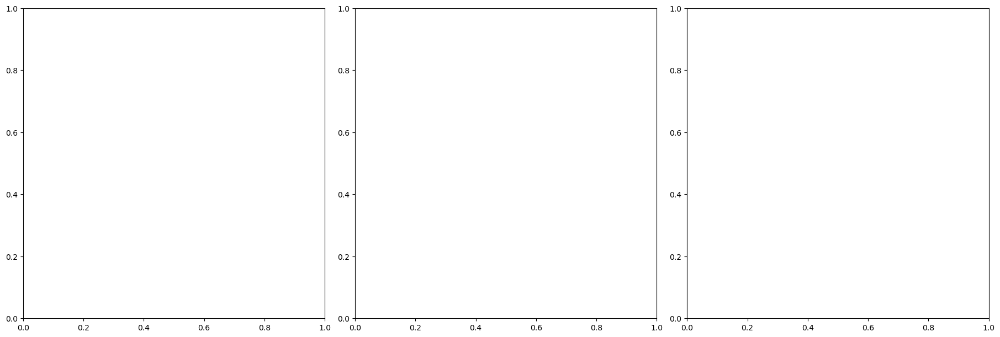

In [15]:
import os
import glob
import numpy as np

# -------------------------
# Parameters
nx = ny = 1001
nz = 1001
dx = dz = 0.005

cartesian_grid_x, cartesian_grid_y = np.meshgrid(
    np.linspace(0, 5, nx), np.linspace(0, 5, ny)
)

BASE_DIR = "/home/emanuele/data/emanuele/loki-das/bedretto/Bedretto_DAS/M0B_snippets_mseed_location"
event_dirs = sorted([d for d in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, d))])

# -------------------------
# Storage
xy_pts = []
xz_pts = []
yz_pts = []

# -------------------------
# Function to load sparse cube
def load_sparse_cube(npz_file):
    dat = np.load(npz_file)
    if {"indices", "values", "shape"}.issubset(dat.keys()):
        shape = tuple(dat["shape"])
        values = dat["values"]
        indices = dat["indices"].astype(int)
        full = np.full(shape, np.nan, dtype=float)
        for idx, val in zip(indices, values):
            z, y, x = np.unravel_index(idx, shape)
            full[z, y, x] = val
        return full
    else:
        raise ValueError(f"Unrecognized sparse format in {npz_file}")

# -------------------------
# Loop over events
for event_id in event_dirs:
    fiber_dir = os.path.join(BASE_DIR, event_id)
    sparse_files = glob.glob(os.path.join(fiber_dir, "corrmatrix_sparse_best_*.npz"))
    if not sparse_files:
        continue

    try:
        cube = load_sparse_cube(sparse_files[0])
    except Exception as e:
        print(f"Skipping {event_id}, failed to load cube: {e}")
        continue

    # Collapse depth for XY, XZ, YZ
    C_xy = np.nanmax(cube, axis=0)
    C_xz = np.nanmax(cube, axis=1)
    C_yz = np.nanmax(cube, axis=0).T

    # Maxima indices
    iy, ix = np.unravel_index(np.nanargmax(C_xy), C_xy.shape)
    iz, ix2 = np.unravel_index(np.nanargmax(C_xz), C_xz.shape)
    iz2, iy2 = np.unravel_index(np.nanargmax(C_yz), C_yz.shape)

    # Physical coordinates
    xy_pts.append((cartesian_grid_x[iy, ix], cartesian_grid_y[iy, ix]))
    xz_pts.append((cartesian_grid_x[0, ix2], iz * dz))
    yz_pts.append((cartesian_grid_y[iy2, 0], iz2 * dz))

# Convert to arrays
xy_pts = np.array(xy_pts)
xz_pts = np.array(xz_pts)
yz_pts = np.array(yz_pts)

print(f"Collected {len(xy_pts)} maxima")


# -------------------------
# --- Helper functions ---
def cartesian_to_geographic(x, y, origin_lat, origin_lon):
    earth_radius = 6371.0  # km
    lat = origin_lat + (y / earth_radius) * (180 / np.pi)
    lon = origin_lon + (x / (earth_radius * np.cos(np.radians(origin_lat)))) * (180 / np.pi)
    return lat, lon

def load_sparse_to_grid(npz_file, nx=None, ny=None, nz=None, fill_value=np.nan):
    """Load a sparse npz coherence cube into a full 3D numpy array"""
    dat = np.load(npz_file)
    keys = set(dat.files)

    # Case 1: already full grid
    for k in ["corr", "coherence", "grid", "matrix"]:
        if k in keys:
            grid = dat[k]
            if grid.ndim != 3:
                raise ValueError(f"{k} is not 3D")
            return grid

    # Case 2: sparse with indices/values/shape
    if {"indices", "values", "shape"}.issubset(keys):
        shape = tuple(dat["shape"])
        values = dat["values"]
        indices = dat["indices"].astype(int)
        full = np.full(shape, fill_value, dtype=float)
        for idx, val in zip(indices, values):
            z, y, x = np.unravel_index(idx, shape)
            full[z, y, x] = val
        return full

    raise ValueError(f"Cannot recognize sparse format in {npz_file}")

# -------------------------
# --- Base folder with events ---
BASE_DIR = "/home/emanuele/data/emanuele/loki-das/bedretto/Bedretto_DAS/M0B_snippets_mseed_location"

event_dirs = sorted(
    d for d in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, d))
)
print(f"Found {len(event_dirs)} events")

# -------------------------
# --- Storage for maxima ---
xy_pts = []
xz_pts = []
yz_pts = []

# -------------------------
# --- Loop over events ---
for event_id in event_dirs:
    fiber_dir = os.path.join(BASE_DIR, event_id)
    sparse_files = glob.glob(os.path.join(fiber_dir, "corrmatrix_sparse_best_*.npz"))
    if not sparse_files:
        continue

    # Load coherence cube
    cube = load_sparse_to_grid(sparse_files[0])

    # XY, XZ, YZ maxima
    C_xy = cube.max(axis=0)
    C_xz = cube.max(axis=1)
    C_yz = cube.max(axis=0).T  # swap axes to match YZ

    # Indices of maxima
    iy, ix = np.unravel_index(np.nanargmax(C_xy), C_xy.shape)
    iz, ix2 = np.unravel_index(np.nanargmax(C_xz), C_xz.shape)
    iz2, iy2 = np.unravel_index(np.nanargmax(C_yz), C_yz.shape)

    # Convert to physical coordinates
    x_xy = cartesian_grid_x[iy, ix]
    y_xy = cartesian_grid_y[iy, ix]

    x_xz = cartesian_grid_x[0, ix2]
    z_xz = iz * dz

    y_yz = cartesian_grid_y[iy2, 0]
    z_yz = iz2 * dz

    xy_pts.append((x_xy, y_xy))
    xz_pts.append((x_xz, z_xz))
    yz_pts.append((y_yz, z_yz))

# -------------------------
# --- Convert to arrays ---
xy_pts = np.array(xy_pts)
xz_pts = np.array(xz_pts)
yz_pts = np.array(yz_pts)

print(f"Collected {len(xy_pts)} maxima")

# -------------------------
# --- Plot maxima with geometry ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)
ax_xy, ax_xz, ax_yz = axes

# XY
ax_xy.scatter(xy_pts[:, 0], xy_pts[:, 1], s=10, color="black", label="Maxima")
for _, (lat, lon, _) in sta.items():
    ax_xy.scatter(lon, lat, marker="^", color="crimson", s=25)
for _, (lat, lon, _) in das.items():
    ax_xy.scatter(lon, lat, marker="^", color="orange", s=15)
ax_xy.set_xlabel("Longitude")
ax_xy.set_ylabel("Latitude")
ax_xy.set_title("XY maxima")
ax_xy.grid(True)

# XZ
ax_xz.scatter(xz_pts[:, 0], xz_pts[:, 1], s=10, color="black", label="Maxima")
for _, (lat, lon, depth) in sta.items():
    ax_xz.scatter(lon, depth, marker="^", color="crimson", s=20)
for _, (lat, lon, depth) in das.items():
    ax_xz.scatter(lon, depth, marker="^", color="orange", s=15)
ax_xz.set_xlabel("Longitude")
ax_xz.set_ylabel("Depth [km]")
ax_xz.invert_yaxis()
ax_xz.set_title("XZ maxima")
ax_xz.grid(True)

# YZ
ax_yz.scatter(yz_pts[:, 0], yz_pts[:, 1], s=10, color="black", label="Maxima")
for _, (lat, lon, depth) in sta.items():
    ax_yz.scatter(lat, depth, marker="^", color="crimson", s=20)
for _, (lat, lon, depth) in das.items():
    ax_yz.scatter(lat, depth, marker="^", color="orange", s=15)
ax_yz.set_xlabel("Latitude")
ax_yz.set_ylabel("Depth [km]")
ax_yz.invert_yaxis()
ax_yz.set_title("YZ maxima")
ax_yz.grid(True)

plt.suptitle("Maxima of Coherence Cubes Across Events", fontsize=16)
plt.show()


In [6]:
def load_sparse_to_grid(npz_file, nx=None, ny=None, fill_value=np.nan):
    dat = np.load(npz_file)
    keys = set(dat.files)

    # ---------------------------------------------------
    # Case 1: already full grid
    # ---------------------------------------------------
    for k in ["corr", "coherence", "grid", "matrix"]:
        if k in keys:
            grid = dat[k]
            if grid.ndim == 3:
                # collapse depth
                grid = np.nanmax(grid, axis=0)
            if grid.ndim != 2:
                raise ValueError(f"{k} in {npz_file} is not 2D after reduction")
            return grid

    # ---------------------------------------------------
    # Case 2: flattened sparse with shape
    # ---------------------------------------------------
    if {"indices", "values", "shape"}.issubset(keys):
        shape = tuple(dat["shape"])
        values = dat["values"]
        indices = dat["indices"].astype(int)

        if len(shape) == 3:
            nz, ny_file, nx_file = shape
            grid3d = np.full((nz, ny_file, nx_file), fill_value, dtype=float)

            for idx, val in zip(indices, values):
                z, y, x = np.unravel_index(idx, shape)
                grid3d[z, y, x] = val

            # 🔥 collapse depth (max coherence)
            grid2d = np.nanmax(grid3d, axis=0)
            return grid2d

        elif len(shape) == 2:
            ny_file, nx_file = shape
            grid = np.full((ny_file, nx_file), fill_value, dtype=float)

            for idx, val in zip(indices, values):
                y, x = np.unravel_index(idx, shape)
                grid[y, x] = val

            return grid

        else:
            raise ValueError(f"Unsupported shape in {npz_file}: {shape}")

    # ---------------------------------------------------
    # Legacy sparse formats
    # ---------------------------------------------------
    if {"ix", "iy", "values"}.issubset(keys):
        ix, iy, v = dat["ix"], dat["iy"], dat["values"]

    elif {"i", "j", "v"}.issubset(keys):
        ix, iy, v = dat["i"], dat["j"], dat["v"]

    elif {"row", "col", "data"}.issubset(keys):
        ix, iy, v = dat["col"], dat["row"], dat["data"]

    elif {"coords", "values"}.issubset(keys):
        coords = dat["coords"]
        ix, iy = coords[:, 0], coords[:, 1]
        v = dat["values"]

    else:
        raise ValueError(
            f"Unrecognized sparse format in {npz_file}\n"
            f"Available keys: {sorted(keys)}"
        )

    ix = ix.astype(int)
    iy = iy.astype(int)

    if nx is None:
        nx = ix.max() + 1
    if ny is None:
        ny = iy.max() + 1

    grid = np.full((ny, nx), fill_value, dtype=float)

    for x, y, val in zip(ix, iy, v):
        if 0 <= x < nx and 0 <= y < ny:
            grid[y, x] = val

    return grid



=== fiber_orion_os ===
Using .loc: /home/emanuele/data/emanuele/loki-das/cefalonia/output_prova_low_srn_OS/kef_0380/fiber_orion_OS/fiber_orion_OS.loc
Best trial index in .loc (info): 0
Selected sparse file: /home/emanuele/data/emanuele/loki-das/cefalonia/output_prova_low_srn_OS/kef_0380/fiber_orion_OS/corrmatrix_sparse_best_16_fiber.npz
Max coherence in sparse file: 0.6728

--- Processing Event 'cluster' for 'fiber_orion_os' ---


/home/emanuele/miniconda3/envs/loki-DAS-ema/lib/python3.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


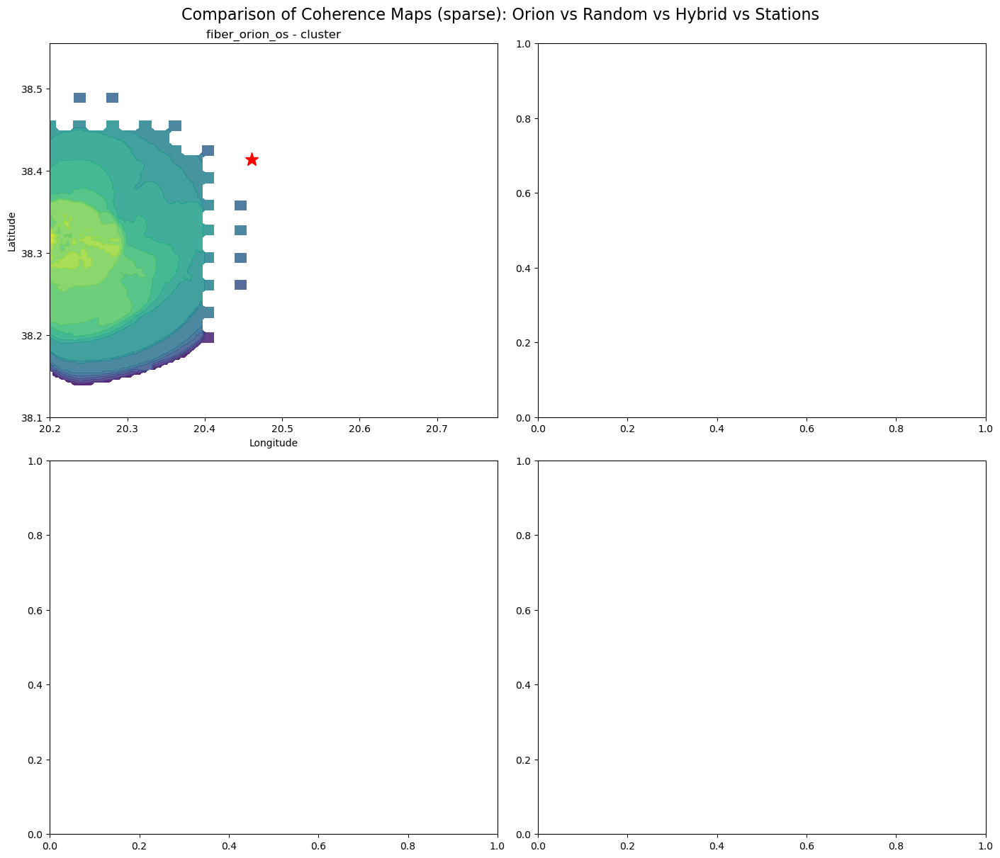

In [8]:
import numpy as np
import os
import glob
import matplotlib.pyplot as plt




def plot_fiber_only_map(
    ref_lat,
    ref_lon,
    das,
    sta,
    earthquake_location,
    sparse_corr_file,
    cartesian_grid_x,
    cartesian_grid_y,
    lat_range,
    lon_range,
    fiber_file,
    title,
    event_name,
    ax,
    boundary_margin=0.0001,
    vicinity_km=50,
):
    nx = 151
    ny = 151

    # ---- Load sparse → full grid
    coherence_grid = load_sparse_to_grid(sparse_corr_file, nx, ny)

    # ---- Remove invalid values
    valid = np.isfinite(coherence_grid)
    if valid.sum() < 4:
        print(f"⚠️  Skipping {event_name}: not enough grid points")
        ax.set_title(title + " (insufficient data)")
        return

    # ---- Build lat/lon grid
    lon = np.linspace(lon_range[0], lon_range[1], nx)
    lat = np.linspace(lat_range[0], lat_range[1], ny)
    grid_lon, grid_lat = np.meshgrid(lon, lat)

    # ---- Plot
    cs = ax.contourf(
        grid_lon,
        grid_lat,
        coherence_grid,
        levels=20,
        cmap="viridis",
        alpha=0.85,
    )

    # ---- Plot DAS geometry
    for name, (lat_s, lon_s) in das.items():
        ax.plot(lon_s, lat_s, "^", color="white", markersize=6)
        ax.text(lon_s, lat_s, name.split()[0], fontsize=7, color="white")

    # ---- Earthquake
    if earthquake_location is not None:
        ax.plot(
            earthquake_location[1],
            earthquake_location[0],
            "*",
            color="red",
            markersize=14,
        )

    ax.set_title(title)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

# --- Reference Coordinates ---
ref_lat = 38.10
ref_lon = 20.20

# --- Event List ---
events = {
    'cluster': (38.4140, 20.461, 14.5),
}


# --- DAS Hybrid Geometry ---
das = {
    "FIB-0262 (SEL HYB)": (38.4622, 20.5605),
    "FIB-1092 (SEL HYB)": (38.4626, 20.5725),
    "FIB-1738 (SEL HYB)": (38.4559, 20.5785),
    "FIB-3248 (SEL HYB)": (38.4418, 20.5767),
    "FIB-4512 (SEL HYB)": (38.4289, 20.5941),
    "FIB-4755 (SEL HYB)": (38.4249, 20.5965),
    "FIB-6970 (SEL HYB)": (38.4387, 20.6403),
    "FIB-7197 (SEL HYB)": (38.4395, 20.6426),
}

sta = {
    "FIB-0262 (SEL HYB)": (38.4622, 20.5605),
    "FIB-1092 (SEL HYB)": (38.4626, 20.5725),
    "FIB-1738 (SEL HYB)": (38.4559, 20.5785),
    "FIB-3248 (SEL HYB)": (38.4418, 20.5767),
    "FIB-4512 (SEL HYB)": (38.4289, 20.5941),
    "FIB-4755 (SEL HYB)": (38.4249, 20.5965),
    "FIB-6970 (SEL HYB)": (38.4387, 20.6403),
    "FIB-7197 (SEL HYB)": (38.4395, 20.6426),
}

# --- Grid Parameters ---
nx = ny = 101
nz = 101
dx = dz = 0.5

cartesian_grid_x, cartesian_grid_y = np.meshgrid(
    np.linspace(0, 75.5, nx), np.linspace(0, 75.5, ny)
)
lat_range = (ref_lat, ref_lat + nx * dx / 111)
lon_range = (ref_lon, ref_lon + ny * dx / (111 * np.cos(np.radians(ref_lat))))


# --- Data Roots ---
base_dirs = {
    "fiber_orion_os": (
        "/home/emanuele/data/emanuele/loki-das/cefalonia/output_prova_low_srn_OS/kef_0380/fiber_orion_OS",
        "fiber_orion_OS.loc",
    ),
    "fiber_orion_os": (
        "/home/emanuele/data/emanuele/loki-das/cefalonia/output_prova_low_srn_OS/kef_0380/fiber_orion_OS",
        "fiber_orion_OS.loc",
    ),
    "fiber_orion_os": (
        "/home/emanuele/data/emanuele/loki-das/cefalonia/output_prova_low_srn_OS/kef_0380/fiber_orion_OS",
        "fiber_orion_OS.loc",
    ),
    "fiber_orion_os": (
        "/home/emanuele/data/emanuele/loki-das/cefalonia/output_prova_low_srn_OS/kef_0380/fiber_orion_OS",
        "fiber_orion_OS.loc",
    )}

def select_highest_coherence_sparse_file(folder, loc_filename):
    """
    1. Check if a 'best' sparse matrix exists in the folder.
    2. If so, use it directly.
    3. Otherwise, scan all trial sparse files and select the one with highest values.max().
    """
    loc_file = os.path.join(folder, loc_filename)
    if not os.path.isfile(loc_file):
        raise FileNotFoundError(f"Missing .loc file: {loc_file}")

    catalog = np.loadtxt(loc_file)
    if catalog.ndim == 1:
        catalog = catalog[np.newaxis, :]

    coherence = catalog[:, 4]
    best_trial_idx_loc = int(np.argmax(coherence))

    # 1️⃣ Look for best sparse matrix
    best_pattern = os.path.join(folder, "corrmatrix_sparse_best_*.npz")
    best_files = glob.glob(best_pattern)

    if best_files:
        # If multiple best files exist, take the one with largest max value
        best_file = None
        best_cmax = -np.inf
        for f in best_files:
            try:
                dat = np.load(f)
                values = dat["values"]
                cmax = float(values.max())
                if cmax > best_cmax:
                    best_cmax = cmax
                    best_file = f
            except Exception as e:
                print(f"Warning: could not read {f}: {e}")
                continue
        if best_file:
            return best_file, best_trial_idx_loc, best_cmax

    # 2️⃣ Fall back to scanning all trial sparse files
    patterns = [
        os.path.join(folder, "corrmatrix_sparse_trial_*.npz"),
        os.path.join(folder, "*corrmatrix_sparse*.npz"),
    ]
    candidates = []
    for pat in patterns:
        candidates.extend(glob.glob(pat))
    candidates = list(dict.fromkeys(candidates))  # remove duplicates

    if not candidates:
        raise FileNotFoundError(
            f"No sparse corrmatrix files found in {folder} with patterns {patterns}"
        )

    # Pick file with largest values.max()
    best_file = None
    best_cmax = -np.inf
    for f in candidates:
        try:
            dat = np.load(f)
            values = dat["values"]
            cmax = float(values.max())
            if cmax > best_cmax:
                best_cmax = cmax
                best_file = f
        except Exception as e:
            print(f"Warning: could not read {f}: {e}")
            continue

    if best_file is None:
        raise RuntimeError(
            f"All sparse candidates in {folder} failed to load; patterns {patterns}"
        )

    return best_file, best_trial_idx_loc, best_cmax



# --- Plotting Comparison ---
fig, axes = plt.subplots(2, 2, figsize=(14, 12), constrained_layout=True)
axes = axes.flatten()

for ax, (label, (base_dir, loc_file)) in zip(axes, base_dirs.items()):
    print(f"\n=== {label} ===")
    try:
        sparse_file, best_trial_loc, best_cmax = select_highest_coherence_sparse_file(
            base_dir, loc_file
        )
        print(f"Using .loc: {os.path.join(base_dir, loc_file)}")
        print(f"Best trial index in .loc (info): {best_trial_loc}")
        print(f"Selected sparse file: {sparse_file}")
        print(f"Max coherence in sparse file: {best_cmax:.4f}")
    except Exception as e:
        print(f"Skipping {label}: {e}")
        continue

    for name, eq_loc in events.items():
        print(f"\n--- Processing Event '{name}' for '{label}' ---")
        plot_fiber_only_map(
            ref_lat,
            ref_lon,
            das,
            sta,
            eq_loc,
            sparse_file,              # path to sparse .npz
            cartesian_grid_x,
            cartesian_grid_y,
            lat_range,
            lon_range,
            sparse_file,              # used for output dir / naming
            title=f"{label} - {name}",
            event_name=f"{label}_{name}",
            ax=ax,
        )

fig.suptitle(
    "Comparison of Coherence Maps (sparse): Orion vs Random vs Hybrid vs Stations",
    fontsize=16,
)
plt.show()
        

Error loading coherence file for fiber_orion: 'NpzFile' object has no attribute 'reshape'
Error loading coherence file for Random: Missing .loc file: /home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2/kef0140/fiber_random/fiber_orion/fiber_orion.loc
Error loading coherence file for Non-Selected: Missing .loc file: /home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2/kef0140/_non_selected/fiber_orion/fiber_orion.loc


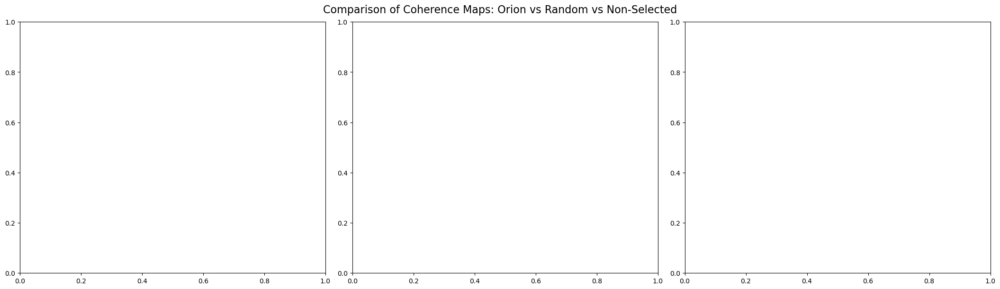

In [6]:
import numpy as np
import os
import matplotlib.pyplot as plt

# --- Reference Coordinates ---
ref_lat = 38.10
ref_lon = 20.20

# --- DAS Hybrid Geometry ---
das_hyb = {
    "FIB-0262 (SEL HYB)": (38.4622, 20.5605),
    "FIB-1092 (SEL HYB)": (38.4626, 20.5725),
    "FIB-1738 (SEL HYB)": (38.4559, 20.5785),
    "FIB-3248 (SEL HYB)": (38.4418, 20.5767),
    "FIB-4512 (SEL HYB)": (38.4289, 20.5941),
    "FIB-4755 (SEL HYB)": (38.4249, 20.5965),
    "FIB-6970 (SEL HYB)": (38.4387, 20.6403),
    "FIB-7197 (SEL HYB)": (38.4395, 20.6426),
}

# --- Grid Parameters ---
nx = ny = nz = 151
dx = dz = 0.5

cartesian_grid_x, cartesian_grid_y = np.meshgrid(np.linspace(0, 75.5, nx), np.linspace(0, 75.5, ny))
lat_range = (ref_lat, ref_lat + nx * dx / 111)
lon_range = (ref_lon, ref_lon + ny * dx / (111 * np.cos(np.radians(ref_lat))))

# --- Event List ---
events = {
    'cluster': (38.3755, 20.4237, 14.5),
}

# --- Event List ---
#events = {
#    'catalog': (38.4075, 20.4237, 14.5),
#}



# --- Event List ---
#events = {
#    'catalog': (38.4124,20.4601, 14.5),
#}

#events = {
#    'catalog': (38.399,20.4735,14.5),
#}


# --- Data Roots ---
base_dirs = {
    "fiber_orion": "/home/emanuele/data/emanuele/loki-das/cefalonia/output_prova_low_srn_OS/kef_0380",
    "Random": "/home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2/kef0140/fiber_random",
    "Non-Selected": "/home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2/kef0140/_non_selected"
}


def select_highest_coherence_file(folder):
    loc_file = os.path.join(folder, "fiber_orion/fiber_orion.loc")
    if not os.path.isfile(loc_file):
        raise FileNotFoundError(f"Missing .loc file: {loc_file}")

    catalog = np.loadtxt(loc_file)
    if catalog.ndim == 1:
        catalog = catalog[np.newaxis, :]

    coherence = catalog[:, 4]
    max_idx = np.argmax(coherence)

    npy_file = os.path.join(folder, f"fiber_orion/corrmatrix_trial_{max_idx}_fiber.npy")
    if not os.path.isfile(npy_file):
        raise FileNotFoundError(f"Missing .npy file: {npy_file}")

    return npy_file


# --- Plotting ---
fig, axes = plt.subplots(1, 3, figsize=(21, 6), constrained_layout=True)

# --- Loop over each data version ---
for i, (label, base_dir) in enumerate(base_dirs.items()):
    ax = axes[i]
    try:
        fiber_file = select_highest_coherence_file(base_dir)
        corrmatrix_das = np.load(fiber_file).reshape((nx, ny, nz))
    except Exception as e:
        print(f"Error loading coherence file for {label}: {e}")
        continue

    for name, eq_loc in events.items():
        print(f"\n--- Processing Event '{name}' for '{label}' ---")
        plot_fiber_only_map(
            ref_lat, ref_lon, das_hyb, eq_loc,
            corrmatrix_das, cartesian_grid_x, cartesian_grid_y,
            lat_range, lon_range, fiber_file,
            title=f"{label} - {name}", event_name=name,
            ax=ax
        )

plt.suptitle("Comparison of Coherence Maps: Orion vs Random vs Non-Selected", fontsize=16)
plt.show()


Error loading coherence file for Orion: Missing .loc file: /home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2/kef0021/fiber_orion/fiber/fiber.loc
Error loading coherence file for Random: Missing .loc file: /home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2/kef0021/fiber_random/fiber/fiber.loc
Error loading coherence file for Non-Selected: Missing .loc file: /home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2/kef0021/_non_selected/fiber/fiber.loc
Error loading non-selected coherence file: Missing .loc file: /home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2/kef0021/fiber_orion/fiber/fiber.loc


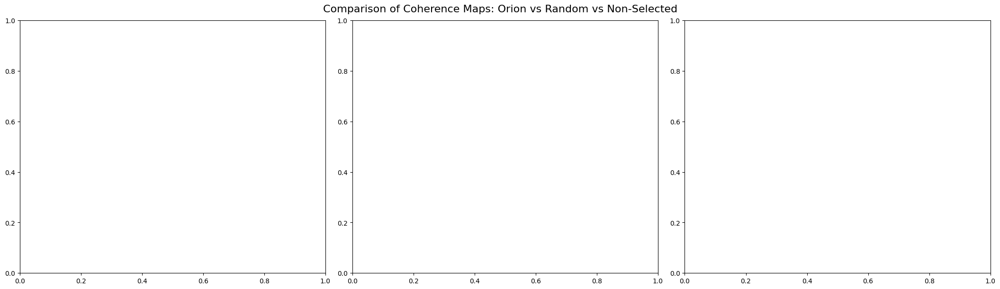

In [4]:
# --- Additional function to select non-maximal coherence file ---
def select_non_max_coherence_file(folder):
    loc_file = os.path.join(folder, "fiber/fiber.loc")
    if not os.path.isfile(loc_file):
        raise FileNotFoundError(f"Missing .loc file: {loc_file}")

    catalog = np.loadtxt(loc_file)
    if catalog.ndim == 1:
        catalog = catalog[np.newaxis, :]

    coherence = catalog[:, 4]
    if len(coherence) < 2:
        raise ValueError("Not enough coherence entries to select a non-maximal value.")

    sorted_indices = np.argsort(coherence)[::-1]  # Descending order
    second_idx = sorted_indices[1]

    npy_file = os.path.join(folder, f"fiber/corrmatrix_trial_{second_idx}_fiber.npy")
    if not os.path.isfile(npy_file):
        raise FileNotFoundError(f"Missing .npy file: {npy_file}")

    return npy_file

# --- Plotting Comparison with Third Panel ---
fig, axes = plt.subplots(1, 3, figsize=(21, 6), constrained_layout=True)

for i, (label, base_dir) in enumerate(base_dirs.items()):
    ax = axes[i]
    try:
        fiber_file = select_highest_coherence_file(base_dir)
        corrmatrix_das = np.load(fiber_file).reshape((nx, ny, nz))
    except Exception as e:
        print(f"Error loading coherence file for {label}: {e}")
        continue

    for name, eq_loc in events.items():
        print(f"\n--- Processing Event '{name}' for '{label}' ---")
        plot_fiber_only_map(
            ref_lat, ref_lon, das_hyb, eq_loc,
            corrmatrix_das, cartesian_grid_x, cartesian_grid_y,
            lat_range, lon_range, fiber_file,
            title=f"{label} - {name}", event_name=name,
            ax=ax
        )

# --- Third subplot for non-selected trial (from Orion, for example) ---
try:
    fiber_file_non_selected = select_non_max_coherence_file(base_dirs["Orion"])
    corrmatrix_das_non_selected = np.load(fiber_file_non_selected).reshape((nx, ny, nz))
    for name, eq_loc in events.items():
        print(f"\n--- Processing Event '{name}' for 'Orion - Non-Selected' ---")
        plot_fiber_only_map(
            ref_lat, ref_lon, das_hyb, eq_loc,
            corrmatrix_das_non_selected, cartesian_grid_x, cartesian_grid_y,
            lat_range, lon_range, fiber_file_non_selected,
            title=f"Orion - Non-Selected - {name}", event_name=name,
            ax=axes[2]
        )
except Exception as e:
    print(f"Error loading non-selected coherence file: {e}")

plt.suptitle("Comparison of Coherence Maps: Orion vs Random vs Non-Selected", fontsize=16)
plt.show()


In [11]:
def plot_fiber_only_map_with_maxima_no_cat(
    ref_lat, ref_lon, das_hyb,
    earthquake_location, cartesian_grid_x,
    cartesian_grid_y, lat_range, lon_range,
    parent_folder,
    title="Fiber Maxima Map",
    magnitude_threshold=0.0
):
    import os, glob, re
    from collections import defaultdict
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from mpl_toolkits.basemap import Basemap
    from scipy.ndimage import zoom
    from scipy.stats import gaussian_kde
    from matplotlib.lines import Line2D
    from matplotlib import cm
    from matplotlib.colors import Normalize
    from math import radians, sin, cos, sqrt, atan2
    from numpy import median

    # --- Parameters ---
    depth_scale = 0.5  # km per depth index (adjust if different)
    cmap = plt.cm.binary

    # --- Helpers ---
    def cartesian_to_geographic(x, y, origin_lat, origin_lon):
        R = 6371.0  # km
        lat = origin_lat + (y / R) * (180.0 / np.pi)
        lon = origin_lon + (x / (R * np.cos(np.radians(origin_lat)))) * (180.0 / np.pi)
        return lat, lon

    def distance_3d(lat1, lon1, depth1, lat2, lon2, depth2):
        """3D Euclidean distance (km) between two geocentric points using lat/lon/depth."""
        R = 6371.0
        lat1_r, lon1_r, lat2_r, lon2_r = map(radians, [lat1, lon1, lat2, lon2])
        x1 = (R - depth1) * cos(lat1_r) * cos(lon1_r)
        y1 = (R - depth1) * cos(lat1_r) * sin(lon1_r)
        z1 = (R - depth1) * sin(lat1_r)
        x2 = (R - depth2) * cos(lat2_r) * cos(lon2_r)
        y2 = (R - depth2) * cos(lat2_r) * sin(lon2_r)
        z2 = (R - depth2) * sin(lat2_r)
        return sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2 + (z1 - z2) ** 2)

    def collect_refined_max_locations_for_variant(parent_folder, event_id, variant_folder_name):
        """
        Returns list of tuples:
          (lat_max, lon_max, depth_cxz_km, depth_cyz_km)
        where depth_* are computed from CXZ and CYZ maxima (converted with depth_scale).
        """
        event_path = os.path.join(parent_folder, event_id, variant_folder_name)
        results = []
        nx, ny = cartesian_grid_x.shape

        if not os.path.isdir(event_path):
            return results

        npy_files = glob.glob(os.path.join(event_path, "corrmatrix_trial_*_fiber.npy"))
        for file in npy_files:
            try:
                corrmatrix_das = np.load(file)
                total_size = corrmatrix_das.size
                if total_size % (nx * ny) != 0:
                    continue

                nz = total_size // (nx * ny)
                corrmatrix = corrmatrix_das.reshape((nx, ny, nz))
                # normalize safely
                max_val = np.nanmax(corrmatrix)
                if max_val == 0 or np.isnan(max_val):
                    continue
                corrmatrix = corrmatrix / max_val

                # --- XY coarse + refine ---
                CXY = np.max(corrmatrix, axis=2).T  # shape (ny, nx)
                coarse_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)

                ws = 10
                i_min = max(coarse_idx[0] - ws, 0)
                i_max = min(coarse_idx[0] + ws + 1, CXY.shape[0])
                j_min = max(coarse_idx[1] - ws, 0)
                j_max = min(coarse_idx[1] + ws + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zf = 10
                CXY_fine = zoom(CXY_local, zf, order=3)
                x_fine = zoom(x_local, zf, order=1)
                y_fine = zoom(y_local, zf, order=1)

                fine_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)
                x_max = x_fine[fine_idx]
                y_max = y_fine[fine_idx]
                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)

                # --- Depth from CXZ and CYZ maxima ---
                # CXZ: max along Y => shape (nx, nz)
                CXZ = np.max(corrmatrix, axis=1)
                # CYZ: max along X => shape (ny, nz)
                CYZ = np.max(corrmatrix, axis=0)

                # locate depth index of maxima
                idx_cxz = np.nanargmax(CXZ)
                # np.unravel_index to get (ix, iz)
                ix_cxz, iz_cxz = np.unravel_index(idx_cxz, CXZ.shape)
                iy_cyz, iz_cyz = np.unravel_index(np.nanargmax(CYZ), CYZ.shape)

                depth_cxz_km = iz_cxz * depth_scale
                depth_cyz_km = iz_cyz * depth_scale

                results.append((lat_max, lon_max, depth_cxz_km, depth_cyz_km))

            except Exception as e:
                # skip problematic files but keep processing
                print(f"Skipping file {file}: {e}")
                continue

        return results

    def plot_50pct_contour(ax, coords, color, label):
        """Plot 50% KDE contour and return a legend proxy Line2D or None."""
        if len(coords) < 5:
            return None
        arr = np.array(coords).T  # shape (2, N) with [lon, lat]
        try:
            kde = gaussian_kde(arr)
        except Exception:
            return None
        x_min, x_max = arr[0].min(), arr[0].max()
        y_min, y_max = arr[1].min(), arr[1].max()

        # small padding
        dx = (x_max - x_min) * 0.1 if x_max > x_min else 0.01
        dy = (y_max - y_min) * 0.1 if y_max > y_min else 0.01
        xgrid, ygrid = np.mgrid[x_min - dx:x_max + dx:300j, y_min - dy:y_max + dy:300j]
        grid_coords = np.vstack([xgrid.ravel(), ygrid.ravel()])
        kde_vals = kde(grid_coords).reshape(xgrid.shape)

        # find contour level for 50% probability mass
        vals_sorted = np.sort(kde_vals.ravel())[::-1]
        cumsum = np.cumsum(vals_sorted)
        cumsum /= cumsum[-1]
        idx = np.searchsorted(cumsum, 0.5)
        if idx >= len(vals_sorted):
            level = vals_sorted[-1]
        else:
            level = vals_sorted[idx]

        cs = ax.contour(xgrid, ygrid, kde_vals, levels=[level], colors=[color],
                        linestyles='dashed', linewidths=4, alpha=0.8)
        return Line2D([0], [0], color=color, lw=2, label=label)

    # --- Read catalog ---
    catalog_path = os.path.join(parent_folder, 'catalog_17072025.csv')
    catalog_df = pd.read_csv(catalog_path)
    catalog_df['evid'] = catalog_df['evid'].astype(str)
    magnitude_dict = dict(zip(catalog_df['evid'], catalog_df['ML']))
    lat_dict = dict(zip(catalog_df['evid'], catalog_df['latitude']))
    lon_dict = dict(zip(catalog_df['evid'], catalog_df['longitude']))
    depth_dict = dict(zip(catalog_df['evid'], catalog_df['depth']))

    # --- event folders ---
    event_ids = [f for f in os.listdir(parent_folder)
                 if os.path.isdir(os.path.join(parent_folder, f)) and re.match(r'^kef\d+', f)]

    def marker_size_from_magnitude(mag, base_size=5, scale_factor=25):
        return base_size + scale_factor * mag

    # --- Collect detections and distances ---
    orion_points = []    # list of dicts: {lon, lat, depth, size, event_id}
    uniform_points = []
    per_event_orion_depths = defaultdict(list)
    per_event_uniform_depths = defaultdict(list)
    orion_distances = []
    uniform_distances = []
    orion_coords = []
    uniform_coords = []
    catalog_coords = []
    shown_event_ids = set()

    for event_id in event_ids:
        mag = magnitude_dict.get(event_id, None)
        if mag is None or mag < magnitude_threshold:
            continue
        shown_event_ids.add(event_id)

        cat_lat = lat_dict.get(event_id, None)
        cat_lon = lon_dict.get(event_id, None)
        cat_depth = depth_dict.get(event_id, None)
        # skip if catalog lacks geometry (we still might want to contour later, but distances require coords)
        if cat_lat is None or cat_lon is None or cat_depth is None:
            # still try to collect detections for contours
            cat_valid = False
        else:
            cat_valid = True
            catalog_coords.append((cat_lon, cat_lat))

        ms = marker_size_from_magnitude(mag)

        # UNIFORM detections
        uniform_locs = collect_refined_max_locations_for_variant(parent_folder, event_id, 'fiber_uniform')
        for lat, lon, depth_cxz_km, depth_cyz_km in uniform_locs:
            depth_est = 0.5 * (depth_cxz_km + depth_cyz_km)
            uniform_points.append({'lon': lon, 'lat': lat, 'depth': depth_est, 'size': ms, 'event_id': event_id})
            uniform_coords.append((lon, lat))
            per_event_uniform_depths[event_id].append(depth_est)
            if cat_valid:
                uniform_distances.append(distance_3d(cat_lat, cat_lon, cat_depth, lat, lon, depth_est))

        # ORION detections
        orion_locs = collect_refined_max_locations_for_variant(parent_folder, event_id, 'fiber_orion')
        for lat, lon, depth_cxz_km, depth_cyz_km in orion_locs:
            depth_est = 0.5 * (depth_cxz_km + depth_cyz_km)
            orion_points.append({'lon': lon, 'lat': lat, 'depth': depth_est, 'size': ms, 'event_id': event_id})
            orion_coords.append((lon, lat))
            per_event_orion_depths[event_id].append(depth_est)
            if cat_valid:
                orion_distances.append(distance_3d(cat_lat, cat_lon, cat_depth, lat, lon, depth_est))



    # --- Prepare figure with map, histogram, scatter (depth comparison) ---
    fig, (ax_map, ax_hist, ax_scatter) = plt.subplots(3, 1, figsize=(8, 14),
                                                     gridspec_kw={'height_ratios': [2.5, 1, 1]},
                                                     dpi=300)
    # --- Map base ---
    m = Basemap(projection='cyl', llcrnrlat=lat_range[0], urcrnrlat=lat_range[1],
                llcrnrlon=lon_range[0], urcrnrlon=lon_range[1], resolution='f', ax=ax_map)
    m.drawcoastlines()
    m.drawcountries()
    m.fillcontinents(color='lightgray', lake_color='whitesmoke')
    m.drawmapboundary(fill_color='whitesmoke')
    # optional grid
    try:
        m.drawparallels(np.arange(lat_range[0], lat_range[1] + 0.01, 0.1), labels=[1, 0, 0, 0], fontsize=8)
        m.drawmeridians(np.arange(lon_range[0], lon_range[1] + 0.01, 0.1), labels=[0, 0, 0, 1], fontsize=8)
    except Exception:
        pass

    # --- Single depth color scale (based on all detected depths) ---
    all_depths = [p['depth'] for p in orion_points] + [p['depth'] for p in uniform_points]

    norm = Normalize(vmin=0, vmax=10)


    if uniform_points:
        xs = [p['lon'] for p in uniform_points]
        ys = [p['lat'] for p in uniform_points]
        depths = [p['depth'] for p in uniform_points]
        sizes = [p['size'] for p in uniform_points]
        sc_uniform = ax_map.scatter(xs, ys, c=depths, cmap=cmap, norm=norm,
                                    s=sizes, marker='o', edgecolors='k', linewidths=0.4,
                                    alpha=0.5, label='Uniform')
    else:
        sc_uniform = None


    # --- Plot ORION and UNIFORM as two different markers but same colormap (depth-coded) ---
    if orion_points:
        xs = [p['lon'] for p in orion_points]
        ys = [p['lat'] for p in orion_points]
        depths = [p['depth'] for p in orion_points]
        sizes = [p['size'] for p in orion_points]
        sc_orion = ax_map.scatter(xs, ys, c=depths, cmap=cmap, norm=norm,
                                  s=sizes, marker='*', edgecolors='k', linewidths=0.4,
                                  alpha=0.5, label='ORION')
    else:
        sc_orion = None

    # --- DAS fiber overlay (if available) ---
    das_csv_path = "/home/emanuele/data/emanuele/loki-das/cefalonia/geometry"
    try:
        if os.path.isdir(das_csv_path):
            for file in os.listdir(das_csv_path):
                if file.endswith(".csv"):
                    df_das = pd.read_csv(os.path.join(das_csv_path, file))
                    if "latitude" in df_das.columns and "longitude" in df_das.columns:
                        sampled_df = df_das.iloc[::100]
                        ax_map.scatter(sampled_df["longitude"], sampled_df["latitude"], marker='^',
                                       color='darkorange', linewidths=0.6, edgecolor='k', s=25, alpha=0.9,
                                       label="DAS fiber")
                    break
    except Exception as e:
        print(f"Error loading DAS CSV: {e}")

    # --- Single colorbar for depth ---
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])  # for colorbar
    cbar = fig.colorbar(sm, ax=ax_map, orientation="vertical", fraction=0.035, pad=0.02)
    cbar.set_label("Estimated depth (km)")

    ax_map.set_title(title, fontsize=14)

    # --- 50% KDE contours (ORION, UNIFORM, catalog) ---
    legend_proxies = []
    proxy = plot_50pct_contour(ax_map, orion_coords, 'darkred', 'ORION 50% contour')
    if proxy:
        legend_proxies.append(proxy)
    proxy = plot_50pct_contour(ax_map, uniform_coords, 'teal', 'UNIFORM 50% contour')
    if proxy:
        legend_proxies.append(proxy)
    proxy = plot_50pct_contour(ax_map, catalog_coords, 'black', 'Catalog 50% contour')


    # --- Legend assembly: avoid duplicates ---
    handles, labels = ax_map.get_legend_handles_labels()
    handles.extend(legend_proxies)
    labels.extend([p.get_label() for p in legend_proxies])

    # add sample magnitude-size legend entries
    sample_mags = [0.5, 1.0, 2.0]
    size_handles = [plt.scatter([], [], s=marker_size_from_magnitude(m), color='gray', alpha=0.6)
                    for m in sample_mags]
    size_labels = [f"ML {m}" for m in sample_mags]

    handles.extend(size_handles)
    labels.extend(size_labels)

    # deduplicate legend entries
    unique = dict(zip(labels, handles))
    ax_map.legend(unique.values(), unique.keys(), loc='lower right', fontsize='small', frameon=True)

    # --- HISTOGRAM of 3D distances from catalog ---
    ax_hist.grid(True, alpha=0.2)
    if len(orion_distances) + len(uniform_distances) > 0:
        maxd = max(orion_distances + uniform_distances + [1.0])
        bins = np.linspace(0, maxd * 1.05, 100)
        if orion_distances:
            ax_hist.hist(orion_distances, bins=bins, alpha=0.6, color='darkred',
                         label=f'ORION (median {median(orion_distances):.2f} km)')
            ax_hist.axvline(median(orion_distances), color='darkred', linestyle='--')
        if uniform_distances:
            ax_hist.hist(uniform_distances, bins=bins, alpha=0.6, color='teal',
                         label=f'UNIFORM (median {median(uniform_distances):.2f} km)')
            ax_hist.axvline(median(uniform_distances), color='teal', linestyle='--')
        ax_hist.set_xlabel("3D distance from catalog location (km)")
        ax_hist.set_ylabel("Count")
        ax_hist.legend(fontsize='small')
    else:
        ax_hist.text(0.5, 0.5, "No distance data to plot", ha='center', va='center')
        ax_hist.set_axis_off()

    # --- Scatter: median depth per event (UNIFORM on x, ORION on y) ---
    paired_orion_medians, paired_uniform_medians, paired_event_ids = [], [], []
    for eid in sorted(shown_event_ids):
        if per_event_orion_depths.get(eid) and per_event_uniform_depths.get(eid):
            paired_orion_medians.append(median(per_event_orion_depths[eid]))
            paired_uniform_medians.append(median(per_event_uniform_depths[eid]))
            paired_event_ids.append(eid)

    if paired_orion_medians and paired_uniform_medians:
        x = np.array(paired_uniform_medians)
        y = np.array(paired_orion_medians)
        ax_scatter.scatter(x, y, marker='o', edgecolor='k', alpha=0.8)
        mx = max(np.nanmax(x), np.nanmax(y))
        ax_scatter.plot([0, mx * 1.05], [0, mx * 1.05], 'k--', lw=1)
        ax_scatter.set_xlabel("UNIFORM median depth (km)")
        ax_scatter.set_ylabel("ORION median depth (km)")
        ax_scatter.set_title("Event-level median depth comparison (ORION vs UNIFORM)")
        ax_scatter.grid(True, alpha=0.2)
    else:
        ax_scatter.text(0.5, 0.5, "Not enough paired events for depth comparison", ha='center', va='center')
        ax_scatter.set_axis_off()

    plt.tight_layout()
    outname = "orion_uniform_map_hist_scatter.pdf"
    fig.savefig(outname, bbox_inches="tight")
    plt.show()
    print(f"Saved {outname}")


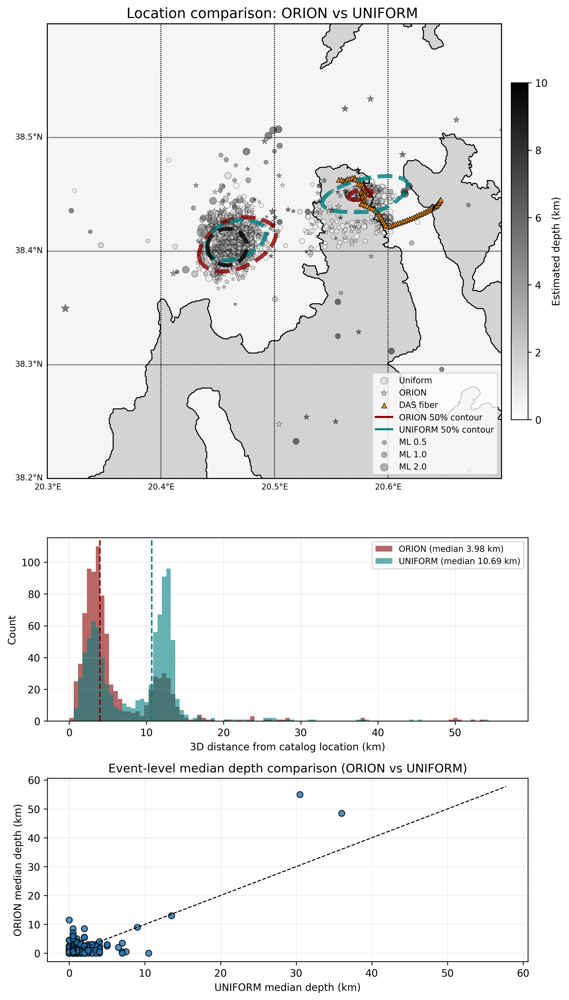

Saved orion_uniform_map_hist_scatter.pdf


In [12]:
plot_fiber_only_map_with_maxima_no_cat(
    ref_lat=38.10,
    ref_lon=20.20,
    das_hyb={
        "FIB-0262 (SEL HYB)": (38.4622, 20.5605),
        "FIB-1092 (SEL HYB)": (38.4626, 20.5725),
        "FIB-1738 (SEL HYB)": (38.4559, 20.5785),
        "FIB-3248 (SEL HYB)": (38.4418, 20.5767),
        "FIB-4512 (SEL HYB)": (38.4289, 20.5941),
        "FIB-4755 (SEL HYB)": (38.4249, 20.5965),
        "FIB-6970 (SEL HYB)": (38.4387, 20.6403),
        "FIB-7197 (SEL HYB)": (38.4395, 20.6426),
    },
    earthquake_location=(38.40435, 20.45875),
    cartesian_grid_x=cartesian_grid_x,
    cartesian_grid_y=cartesian_grid_y,
    lat_range=(38.2, 38.6),
    lon_range=(20.3, 20.7),
    magnitude_threshold=0,
    parent_folder='/home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2/',
    title="Location comparison: ORION vs UNIFORM "
)


In [5]:
def plot_fiber_only_map_with_maxima_no_cat(ref_lat, ref_lon, das_hyb,
                                           earthquake_location, cartesian_grid_x,
                                           cartesian_grid_y, lat_range, lon_range,
                                           parent_folder,
                                           hybrid2_parent_folder,
                                           title="Fiber Maxima Map",
                                           magnitude_threshold=0.0):
    import matplotlib.pyplot as plt
    from mpl_toolkits.basemap import Basemap
    from scipy.ndimage import zoom
    import numpy as np
    import os
    import glob
    import pandas as pd
    import re
    from math import radians, sin, cos, sqrt, atan2
    from scipy.stats import gaussian_kde
    from matplotlib.lines import Line2D

    def cartesian_to_geographic(x, y, origin_lat, origin_lon):
        earth_radius = 6371
        lat = origin_lat + (y / earth_radius) * (180 / np.pi)
        lon = origin_lon + (x / (earth_radius * np.cos(np.radians(origin_lat)))) * (180 / np.pi)
        return lat, lon

    def haversine(lat1, lon1, lat2, lon2):
        R = 6371.0
        dlat = radians(lat2 - lat1)
        dlon = radians(lon2 - lon1)
        a = sin(dlat / 2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon / 2)**2
        c = 2 * atan2(sqrt(a), sqrt(1 - a))
        return R * c

    def collect_refined_max_locations_for_variant(parent_folder, event_id, variant_folder_name, variant_suffix):
        event_path = os.path.join(parent_folder, event_id, variant_folder_name)
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        if not os.path.isdir(event_path):
            return max_locations

        pattern = f"corrmatrix_trial_*_{variant_suffix}.npy"
        npy_files = glob.glob(os.path.join(event_path, pattern))

        for file in npy_files:
            try:
                corrmatrix_das = np.load(file)
                total_size = corrmatrix_das.size
                if total_size % (nx * ny) != 0:
                    continue

                nz = total_size // (nx * ny)
                corrmatrix = corrmatrix_das.reshape((nx, ny, nz))
                corrmatrix = corrmatrix / np.nanmax(corrmatrix)
                CXY = np.max(corrmatrix, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)
                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]
                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)

                max_locations.append((lat_max, lon_max))

            except Exception:
                continue

        return max_locations

    def collect_refined_max_locations_for_hybrid_sum(parent_folder, event_id):
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        event_orion_path = os.path.join(parent_folder, event_id, 'fiber_orion')
        event_stations_path = os.path.join(parent_folder, event_id, 'stations')

        if not os.path.isdir(event_orion_path) or not os.path.isdir(event_stations_path):
            return max_locations

        orion_files = sorted(glob.glob(os.path.join(event_orion_path, 'corrmatrix_trial_*_fiber.npy')))
        stations_files = sorted(glob.glob(os.path.join(event_stations_path, 'corrmatrix_trial_*_stations.npy')))

        def get_trial_num(filename):
            m = re.search(r'corrmatrix_trial_(\d+)_', filename)
            return int(m.group(1)) if m else -1

        orion_files = sorted(orion_files, key=get_trial_num)
        stations_files = sorted(stations_files, key=get_trial_num)

        for ofile, sfile in zip(orion_files, stations_files):
            if get_trial_num(ofile) != get_trial_num(sfile):
                continue

            try:
                corr_orion = np.load(ofile)
                corr_stations = np.load(sfile)

                if corr_orion.size != corr_stations.size or corr_orion.size % (nx * ny) != 0:
                    continue

                nz = corr_orion.size // (nx * ny)
                corr_orion = corr_orion.reshape((nx, ny, nz))
                corr_stations = corr_stations.reshape((nx, ny, nz))

                corr_sum = corr_orion + corr_stations
                corr_sum = corr_sum / np.nanmax(corr_sum)
                CXY = np.max(corr_sum, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)
                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]

                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)
                max_locations.append((lat_max, lon_max))

            except Exception:
                continue

        return max_locations

    def collect_refined_max_locations_for_hybrid_gilbert(parent_folder, event_id):
        event_path = os.path.join(parent_folder, event_id, 'hybrid_gilbert')
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        if not os.path.isdir(event_path):
            return max_locations

        pattern = "corrmatrix_trial_*_hybrid.npy"
        npy_files = glob.glob(os.path.join(event_path, pattern))

        for file in npy_files:
            try:
                corrmatrix_das = np.load(file)
                total_size = corrmatrix_das.size
                if total_size % (nx * ny) != 0:
                    continue

                nz = total_size // (nx * ny)
                corrmatrix = corrmatrix_das.reshape((nx, ny, nz))
                corrmatrix = corrmatrix / np.nanmax(corrmatrix)
                CXY = np.max(corrmatrix, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)
                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]
                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)
                max_locations.append((lat_max, lon_max))
            except Exception:
                continue

        return max_locations


    # ✅ ADAPTED FUNCTION FOR HYBRID_GILBERT FILES
    def collect_refined_max_locations_for_hybrid2(hybrid2_parent_folder, event_id):
        event_path = os.path.join(hybrid2_parent_folder, event_id, 'hybrid_gilbert')
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        if not os.path.isdir(event_path):
            return max_locations

        # Adapted pattern for "corrmatrix_trial-0-hybrid.npy"
        pattern = "corrmatrix_trial_*_hybrid.npy"
        npy_files = glob.glob(os.path.join(event_path, pattern))

        for file in npy_files:
            try:
                corrmatrix_das = np.load(file)
                total_size = corrmatrix_das.size
                if total_size % (nx * ny) != 0:
                    continue

                nz = total_size // (nx * ny)
                corrmatrix = corrmatrix_das.reshape((nx, ny, nz))
                corrmatrix = corrmatrix / np.nanmax(corrmatrix)
                CXY = np.max(corrmatrix, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)
                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]
                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)
                max_locations.append((lat_max, lon_max))

            except Exception:
                continue

        return max_locations

    def plot_50pct_contour(ax, coords, color, label, **kwargs):
        if len(coords) < 10:
            return None
        xy = np.array(coords).T
        kde = gaussian_kde(xy)

        x_min, y_min = xy.min(axis=1)
        x_max, y_max = xy.max(axis=1)
        x_grid = np.linspace(x_min, x_max, 200)
        y_grid = np.linspace(y_min, y_max, 200)
        xgrid, ygrid = np.meshgrid(x_grid, y_grid)
        grid_coords = np.vstack([xgrid.ravel(), ygrid.ravel()])
        kde_vals = kde(grid_coords).reshape(xgrid.shape)

        sorted_kde = np.sort(kde_vals.ravel())[::-1]
        cumsum = np.cumsum(sorted_kde) / np.sum(sorted_kde)
        level = sorted_kde[np.searchsorted(cumsum, 0.5)]

        ax.contour(xgrid, ygrid, kde_vals, levels=[level],
                colors='black', linestyles='dashed', linewidths=8, alpha=0.5)
        contour = ax.contour(xgrid, ygrid, kde_vals, levels=[level],
                            colors=[color], linestyles='dashed', linewidths=6, alpha=0.9, **kwargs)
        if contour.collections:
            return contour.collections[0]
        return None

    catalog_path = os.path.join(parent_folder, 'catalog_17072025.csv')
    catalog_df = pd.read_csv(catalog_path)
    catalog_df['evid'] = catalog_df['evid'].astype(str)
    magnitude_dict = dict(zip(catalog_df['evid'], catalog_df['ML']))

    event_ids = [f for f in os.listdir(parent_folder)
                 if os.path.isdir(os.path.join(parent_folder, f)) and re.match(r'^kef\d+', f)]

    def marker_size_from_magnitude(mag, base_size=2, scale_factor=50):
        return base_size + scale_factor * mag

    fig, axes = plt.subplots(2, 3, figsize=(15, 10), dpi=400)
    axes = axes.flatten()

    map_titles = [
        'Stations',
        'Fiber + ORION',
        'Hybrid (sum)',
        'Fiber + uniform',
        'Hybrid gilbert',
        'Catalog (Bocchini et al., 2025)'
    ]
    variant_groups = [
        [('stations', 'stations', 'stations', 'royalblue', 'Stations')],
        [('orion', 'fiber_orion', 'fiber', 'darkred', 'ORION')],
        [('hybrid_sum', None, None, 'darkorange', 'Hybrid (sum)')],
        [('uniform', 'fiber_uniform', 'fiber', 'teal', 'Uniform')],
        [('hybrid_gilbert', 'hybrid_gilbert', 'hybrid_gilbert', 'mediumorchid', 'Hybrid_gilbert')],
        [('hybrid2', None, None, 'green', 'Hybrid2')]
    ]

    das_csv_path = "/home/emanuele/data/emanuele/loki-das/cefalonia/geometry"
    stations_csv_path = os.path.join(das_csv_path, "stations.csv")

    for idx, (ax, variants, map_title) in enumerate(zip(axes, variant_groups, map_titles)):
        m = Basemap(projection='cyl', llcrnrlat=lat_range[0], urcrnrlat=lat_range[1],
                    llcrnrlon=lon_range[0], urcrnrlon=lon_range[1], resolution='f', ax=ax)
        m.drawcoastlines()
        m.drawcountries()
        m.fillcontinents(color='whitesmoke', lake_color='lightblue')
        m.drawmapboundary(fill_color='lightblue')
        m.drawparallels(np.arange(lat_range[0], lat_range[1] + 0.01, 0.1), labels=[1, 0, 0, 0], fontsize=9)
        m.drawmeridians(np.arange(lon_range[0], lon_range[1] + 0.01, 0.1), labels=[0, 0, 0, 1], fontsize=9)
        ax.set_title(map_title, fontsize=11)

        distances = {}
        coords = {}
        legend_elements = []

        try:
            for file in os.listdir(das_csv_path):
                if file.endswith(".csv") and file != "stations.csv":
                    df_das = pd.read_csv(os.path.join(das_csv_path, file))
                    if "latitude" in df_das.columns and "longitude" in df_das.columns:
                        sampled_df = df_das.iloc[::100]
                        if idx in [1,2,3,4,5]:
                            ax.scatter(sampled_df["longitude"], sampled_df["latitude"], marker='^',
                                    color='darkorange', linewidths=0.7, edgecolor='k', s=50, alpha=0.9,
                                    label="DAS fiber")
                    break
        except Exception as e:
            print(f"Error loading DAS CSV: {e}")

        if idx in [0, 2, 4, 5]:
            try:
                df_stations = pd.read_csv(stations_csv_path)
                ax.scatter(df_stations["longitude"], df_stations["latitude"], marker='^',
                           color='darkred', edgecolor='k', s=100, alpha=0.8, label="Conventional seismic stations")
            except Exception as e:
                print(f"Error loading stations.csv: {e}")

        catalog_lats = catalog_df['latitude'].values
        catalog_lons = catalog_df['longitude'].values
        ax.scatter(catalog_lons, catalog_lats, marker='o', color='black', s=30,
                label='Catalog', alpha=0.7, edgecolor='k', linewidth=0.5)

        for event_id in event_ids:
            magnitude = magnitude_dict.get(event_id, None)
            if magnitude is None or magnitude < magnitude_threshold:
                continue
            marker_size = marker_size_from_magnitude(magnitude)

            for key, folder, suffix, color, label in variants:
                if key == 'hybrid_sum':
                    points = collect_refined_max_locations_for_hybrid_sum(parent_folder, event_id)
                elif key == 'hybrid2':
                    points = collect_refined_max_locations_for_hybrid2(hybrid2_parent_folder, event_id)
                elif key == 'hybrid_gilbert':
                    points = collect_refined_max_locations_for_hybrid_gilbert(parent_folder, event_id)


                else:
                    points = collect_refined_max_locations_for_variant(parent_folder, event_id, folder, suffix)

                for lat, lon in points:
                    ax.scatter(lon, lat, marker='o', color=color, edgecolor='k', linewidths=0.5,
                               s=marker_size, alpha=0.5)
                    distances.setdefault(key, []).append(haversine(earthquake_location[0], earthquake_location[1], lat, lon))
                    coords.setdefault(key, []).append((lon, lat))

        for key, _, _, color, label in variants:
            if key in coords:
                contour = plot_50pct_contour(ax, coords[key], color, f"{label} 50% KDE")
                if distances[key]:
                    med = np.median(distances[key])
                    label_with_med = f"{label} (med: {med:.1f} km)"
                else:
                    label_with_med = label
                legend_elements.append(Line2D([0], [0], marker='o', color='w', label=label_with_med,
                                              markerfacecolor=color, markeredgecolor='k', markersize=10))

        if idx in [1, 2, 3, 4, 5]:
            legend_elements.append(Line2D([0], [0], marker='^', color='w', label='DAS fiber',
                                        markerfacecolor='darkorange', markeredgecolor='k', markersize=10))
        if idx in [0, 2, 4, 5]:
            legend_elements.append(Line2D([0], [0], marker='^', color='w', label='Conventional seismic network',
                                          markerfacecolor='darkred', markeredgecolor='k', markersize=10))
        legend_elements.append(Line2D([0], [0], marker='o', color='w',
                                    label='Catalog earthquake locations \n (Bocchini et al., 2025 in prep.)',
                                    markerfacecolor='black', markeredgecolor='k', markersize=2))
        ax.legend(handles=legend_elements, fontsize=10, loc='upper right')

    if len(variant_groups) < len(axes):
        for i in range(len(variant_groups), len(axes)):
            fig.delaxes(axes[i])

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    fig.suptitle(title, fontsize=16, fontweight='bold')

    plt.show()



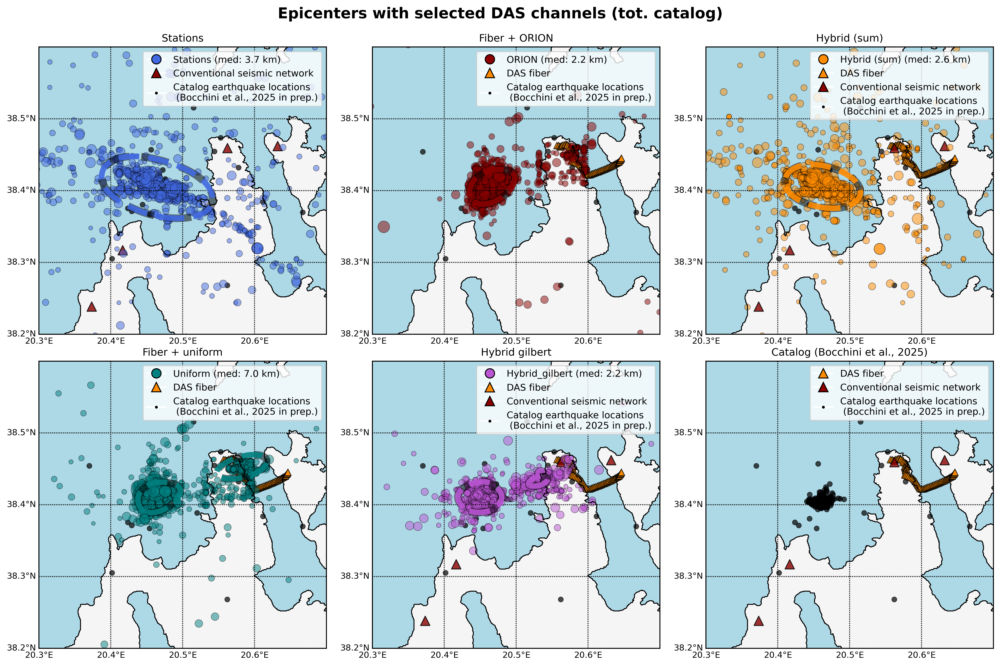

In [6]:
plot_fiber_only_map_with_maxima_no_cat(
    ref_lat=38.10,
    ref_lon=20.20,
    das_hyb={
        "FIB-0262 (SEL HYB)": (38.4622, 20.5605),
        "FIB-1092 (SEL HYB)": (38.4626, 20.5725),
        "FIB-1738 (SEL HYB)": (38.4559, 20.5785),
        "FIB-3248 (SEL HYB)": (38.4418, 20.5767),
        "FIB-4512 (SEL HYB)": (38.4289, 20.5941),
        "FIB-4755 (SEL HYB)": (38.4249, 20.5965),
        "FIB-6970 (SEL HYB)": (38.4387, 20.6403),
        "FIB-7197 (SEL HYB)": (38.4395, 20.6426),
    },
    earthquake_location=(38.40435, 20.45875),
    cartesian_grid_x=cartesian_grid_x,
    cartesian_grid_y=cartesian_grid_y,
    lat_range=(38.2, 38.6),
    lon_range=(20.3, 20.7),
    magnitude_threshold=0,
    parent_folder='/home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2_gilbert/',
    hybrid2_parent_folder='/home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2/',  # <-- new argument
    title="Epicenters with selected DAS channels (tot. catalog)"
)


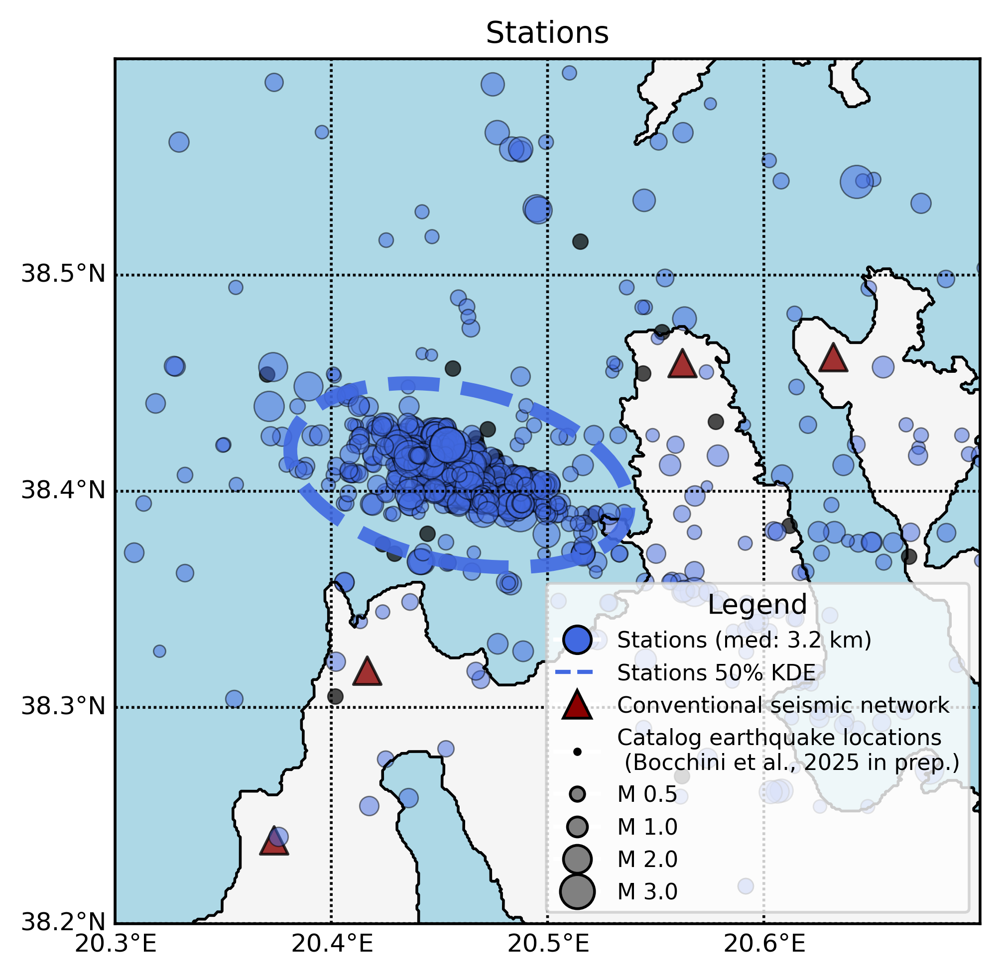

KeyboardInterrupt: 

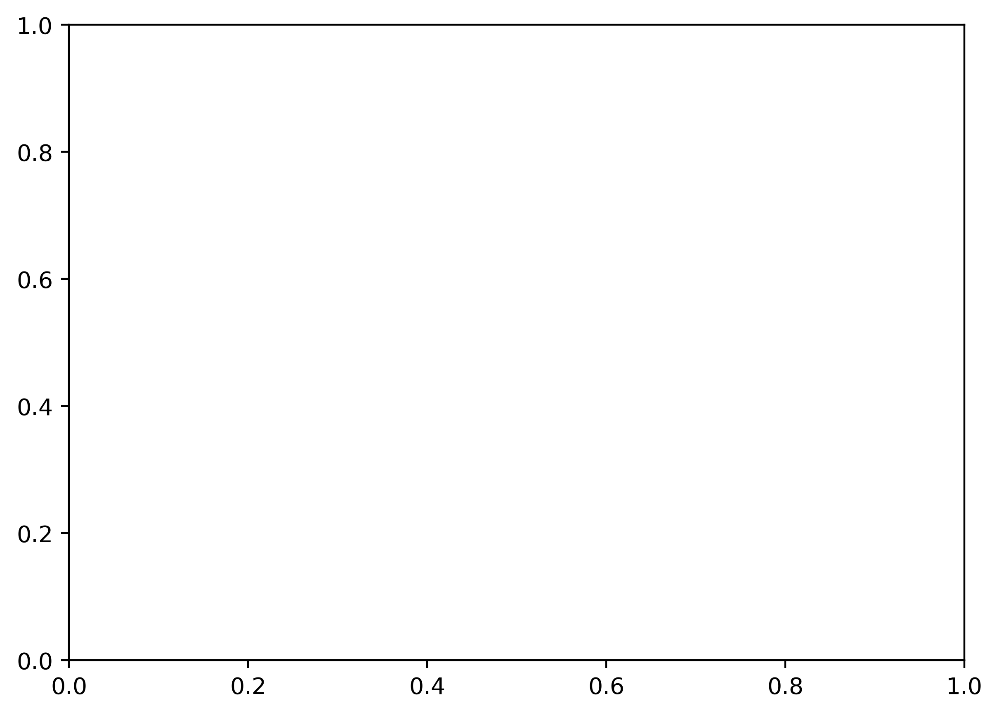

In [3]:
def plot_fiber_only_map_with_maxima_no_cat(
    ref_lat, ref_lon, das_hyb,
    earthquake_location, cartesian_grid_x,
    cartesian_grid_y, lat_range, lon_range,
    parent_folder,
    hybrid2_parent_folder,
    title="Fiber Maxima Map",
    magnitude_threshold=0.0
):
    import matplotlib.pyplot as plt
    from mpl_toolkits.basemap import Basemap
    from scipy.ndimage import zoom
    import numpy as np
    import os
    import glob
    import pandas as pd
    import re
    from math import radians, sin, cos, sqrt, atan2
    from scipy.stats import gaussian_kde
    from matplotlib.lines import Line2D

    # ---------------------- HELPER FUNCTIONS ----------------------
    def cartesian_to_geographic(x, y, origin_lat, origin_lon):
        earth_radius = 6371
        lat = origin_lat + (y / earth_radius) * (180 / np.pi)
        lon = origin_lon + (x / (earth_radius * np.cos(np.radians(origin_lat)))) * (180 / np.pi)
        return lat, lon

    def haversine(lat1, lon1, lat2, lon2):
        R = 6371.0
        dlat = radians(lat2 - lat1)
        dlon = radians(lon2 - lon1)
        a = sin(dlat / 2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon / 2)**2
        c = 2 * atan2(sqrt(a), sqrt(1 - a))
        return R * c

    def collect_refined_max_locations_for_variant(parent_folder, event_id, variant_folder_name, variant_suffix):
        event_path = os.path.join(parent_folder, event_id, variant_folder_name)
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        if not os.path.isdir(event_path):
            return max_locations

        pattern = f"corrmatrix_trial_*_{variant_suffix}.npy"
        npy_files = glob.glob(os.path.join(event_path, pattern))

        for file in npy_files:
            try:
                corrmatrix_das = np.load(file)
                total_size = corrmatrix_das.size
                if total_size % (nx * ny) != 0:
                    continue

                nz = total_size // (nx * ny)
                corrmatrix = corrmatrix_das.reshape((nx, ny, nz))
                corrmatrix = corrmatrix / np.nanmax(corrmatrix)
                CXY = np.max(corrmatrix, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)
                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]
                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)

                max_locations.append((lat_max, lon_max))
            except Exception:
                continue

        return max_locations

    def collect_refined_max_locations_for_hybrid_sum(parent_folder, event_id):
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        event_orion_path = os.path.join(parent_folder, event_id, 'fiber_orion')
        event_stations_path = os.path.join(parent_folder, event_id, 'stations')

        if not os.path.isdir(event_orion_path) or not os.path.isdir(event_stations_path):
            return max_locations

        orion_files = sorted(glob.glob(os.path.join(event_orion_path, 'corrmatrix_trial_*_fiber.npy')))
        stations_files = sorted(glob.glob(os.path.join(event_stations_path, 'corrmatrix_trial_*_stations.npy')))

        def get_trial_num(filename):
            m = re.search(r'corrmatrix_trial_(\d+)_', filename)
            return int(m.group(1)) if m else -1

        orion_files = sorted(orion_files, key=get_trial_num)
        stations_files = sorted(stations_files, key=get_trial_num)

        for ofile, sfile in zip(orion_files, stations_files):
            if get_trial_num(ofile) != get_trial_num(sfile):
                continue

            try:
                corr_orion = np.load(ofile)
                corr_stations = np.load(sfile)

                if corr_orion.size != corr_stations.size or corr_orion.size % (nx * ny) != 0:
                    continue

                nz = corr_orion.size // (nx * ny)
                corr_orion = corr_orion.reshape((nx, ny, nz))
                corr_stations = corr_stations.reshape((nx, ny, nz))

                corr_sum = corr_orion + corr_stations
                corr_sum = corr_sum / np.nanmax(corr_sum)
                CXY = np.max(corr_sum, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)
                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]
                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)
                max_locations.append((lat_max, lon_max))
            except Exception:
                continue

        return max_locations

    def collect_refined_max_locations_for_hybrid2(hybrid2_parent_folder, event_id):
        event_path = os.path.join(hybrid2_parent_folder, event_id, 'hybrid2')
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        if not os.path.isdir(event_path):
            return max_locations

        pattern = "corrmatrix_trial_*_hybrid.npy"
        npy_files = glob.glob(os.path.join(event_path, pattern))

        for file in npy_files:
            try:
                corrmatrix_das = np.load(file)
                total_size = corrmatrix_das.size
                if total_size % (nx * ny) != 0:
                    continue

                nz = total_size // (nx * ny)
                corrmatrix = corrmatrix_das.reshape((nx, ny, nz))
                corrmatrix = corrmatrix / np.nanmax(corrmatrix)
                CXY = np.max(corrmatrix, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)
                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]
                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)
                max_locations.append((lat_max, lon_max))
            except Exception:
                continue

        return max_locations

    def plot_50pct_contour(ax, coords, color, label, **kwargs):
        if len(coords) < 10:
            return None
        xy = np.array(coords).T
        kde = gaussian_kde(xy)

        x_min, y_min = xy.min(axis=1)
        x_max, y_max = xy.max(axis=1)
        x_grid = np.linspace(x_min, x_max, 200)
        y_grid = np.linspace(y_min, y_max, 200)
        xgrid, ygrid = np.meshgrid(x_grid, y_grid)
        grid_coords = np.vstack([xgrid.ravel(), ygrid.ravel()])
        kde_vals = kde(grid_coords).reshape(xgrid.shape)

        sorted_kde = np.sort(kde_vals.ravel())[::-1]
        cumsum = np.cumsum(sorted_kde) / np.sum(sorted_kde)
        level = sorted_kde[np.searchsorted(cumsum, 0.5)]

        contour = ax.contour(xgrid, ygrid, kde_vals, levels=[level],
                             colors=[color], linestyles='dashed', linewidths=5, alpha=0.9, **kwargs)
        if contour.collections:
            return contour.collections[0]
        return None

    # ---------------------- DATA LOADING ----------------------
    catalog_path = os.path.join(parent_folder, 'catalog_17072025.csv')
    catalog_df = pd.read_csv(catalog_path)
    catalog_df['evid'] = catalog_df['evid'].astype(str)
    magnitude_dict = dict(zip(catalog_df['evid'], catalog_df['ML']))

    event_ids = [f for f in os.listdir(parent_folder)
                 if os.path.isdir(os.path.join(parent_folder, f)) and re.match(r'^kef\d+', f)]

    def marker_size_from_magnitude(mag, base_size=2, scale_factor=50):
        return base_size + scale_factor * mag

    map_titles = [
        'Stations',
        'Fiber + ORION',
        'Hybrid (sum)',
        'Fiber + uniform',
        'Hybrid (same num. sensors)',
        'Hybrid2 (ORION + stations)'
    ]
    variant_groups = [
        [('stations', 'stations', 'stations', 'royalblue', 'Stations')],
        [('orion', 'fiber_orion', 'fiber', 'darkred', 'ORION')],
        [('hybrid_sum', None, None, 'darkorange', 'Hybrid (sum)')],
        [('uniform', 'fiber_uniform', 'fiber', 'teal', 'Uniform')],
        [('hybrid', 'hybrid', 'hybrid', 'mediumorchid', 'Hybrid')],
        [('hybrid2', None, None, 'green', 'Hybrid2')]
    ]

    das_csv_path = "/home/emanuele/data/emanuele/loki-das/cefalonia/geometry"
    stations_csv_path = os.path.join(das_csv_path, "stations.csv")

    # ---------------------- PLOTTING ----------------------
    for idx, (variants, map_title) in enumerate(zip(variant_groups, map_titles)):
        fig, ax = plt.subplots(figsize=(7, 5), dpi=400)

        m = Basemap(projection='cyl', llcrnrlat=lat_range[0], urcrnrlat=lat_range[1],
                    llcrnrlon=lon_range[0], urcrnrlon=lon_range[1], resolution='f', ax=ax)
        m.drawcoastlines()
        m.drawcountries()
        m.fillcontinents(color='whitesmoke', lake_color='lightblue')
        m.drawmapboundary(fill_color='lightblue')
        m.drawparallels(np.arange(lat_range[0], lat_range[1] + 0.01, 0.1),
                        labels=[1, 0, 0, 0], fontsize=9)
        m.drawmeridians(np.arange(lon_range[0], lon_range[1] + 0.01, 0.1),
                        labels=[0, 0, 0, 1], fontsize=9)
        ax.set_title(map_title, fontsize=11)

        distances = {}
        coords = {}
        legend_elements = []

        try:
            for file in os.listdir(das_csv_path):
                if file.endswith(".csv") and file != "stations.csv":
                    df_das = pd.read_csv(os.path.join(das_csv_path, file))
                    if "latitude" in df_das.columns and "longitude" in df_das.columns:
                        sampled_df = df_das.iloc[::100]
                        if idx in [1, 2, 3, 4, 5]:
                            ax.scatter(sampled_df["longitude"], sampled_df["latitude"], marker='^',
                                       color='darkorange', linewidths=0.7, edgecolor='k', s=50, alpha=0.9,
                                       label="DAS fiber")
                    break
        except Exception as e:
            print(f"Error loading DAS CSV: {e}")

        if idx in [0, 2, 4, 5]:
            try:
                df_stations = pd.read_csv(stations_csv_path)
                ax.scatter(df_stations["longitude"], df_stations["latitude"], marker='^',
                           color='darkred', edgecolor='k', s=100, alpha=0.8, label="Conventional seismic stations")
            except Exception as e:
                print(f"Error loading stations.csv: {e}")

        catalog_lats = catalog_df['latitude'].values
        catalog_lons = catalog_df['longitude'].values
        ax.scatter(catalog_lons, catalog_lats, marker='o', color='black', s=30,
                   label='Catalog', alpha=0.7, edgecolor='k', linewidth=0.5)

        for event_id in event_ids:
            magnitude = magnitude_dict.get(event_id, None)
            if magnitude is None or magnitude < magnitude_threshold:
                continue
            marker_size = marker_size_from_magnitude(magnitude)

            for key, folder, suffix, color, label in variants:
                if key == 'hybrid_sum':
                    points = collect_refined_max_locations_for_hybrid_sum(parent_folder, event_id)
                elif key == 'hybrid2':
                    points = collect_refined_max_locations_for_hybrid2(hybrid2_parent_folder, event_id)
                else:
                    points = collect_refined_max_locations_for_variant(parent_folder, event_id, folder, suffix)

                for lat, lon in points:
                    ax.scatter(lon, lat, marker='o', color=color, edgecolor='k', linewidths=0.5,
                               s=marker_size, alpha=0.5)
                    distances.setdefault(key, []).append(
                        haversine(earthquake_location[0], earthquake_location[1], lat, lon))
                    coords.setdefault(key, []).append((lon, lat))

        for key, _, _, color, label in variants:
            if key in coords:
                contour = plot_50pct_contour(ax, coords[key], color, f"{label} 50% KDE")
                if distances[key]:
                    med = np.median(distances[key])
                    label_with_med = f"{label} (med: {med:.1f} km)"
                else:
                    label_with_med = label

                # Marker legend (points)
                legend_elements.append(Line2D([0], [0], marker='o', color='w', label=label_with_med,
                                            markerfacecolor=color, markeredgecolor='k', markersize=10))

                # Contour legend (50% KDE line)
                legend_elements.append(Line2D([0], [0], color=color, linestyle='--', linewidth=1.5,
                                            label=f"{label} 50% KDE"))


        if idx in [1, 2, 3, 4, 5]:
            legend_elements.append(Line2D([0], [0], marker='^', color='w', label='DAS fiber',
                                          markerfacecolor='darkorange', markeredgecolor='k', markersize=10))
        if idx in [0, 2, 4, 5]:
            legend_elements.append(Line2D([0], [0], marker='^', color='w', label='Conventional seismic network',
                                          markerfacecolor='darkred', markeredgecolor='k', markersize=10))
        legend_elements.append(Line2D([0], [0], marker='o', color='w',
                                      label='Catalog earthquake locations \n (Bocchini et al., 2025 in prep.)',
                                      markerfacecolor='black', markeredgecolor='k', markersize=2))
        
        # Example: magnitude legend
        example_mags = [0.5, 1.0, 2.0, 3.0]  # you can adjust these

        mag_handles = [
            Line2D([0], [0], marker='o', color='w', label=f"M {mag}",
                markerfacecolor='gray', markeredgecolor='k',
                markersize=np.sqrt(marker_size_from_magnitude(mag)))
            for mag in example_mags
        ]


        # Combine the magnitude legend with the dataset legend
        # Combine the magnitude legend with the dataset legend
        all_legend_elements = legend_elements + mag_handles

        # Single legend call (so magnitude + dataset both appear)
        ax.legend(handles=all_legend_elements, fontsize=8, loc='lower right', title="Legend")



        plt.tight_layout()
        plt.show()  # Show each plot separately


plot_fiber_only_map_with_maxima_no_cat(
    ref_lat=38.10,
    ref_lon=20.20,
    das_hyb={
        "FIB-0262 (SEL HYB)": (38.4622, 20.5605),
        "FIB-1092 (SEL HYB)": (38.4626, 20.5725),
        "FIB-1738 (SEL HYB)": (38.4559, 20.5785),
        "FIB-3248 (SEL HYB)": (38.4418, 20.5767),
        "FIB-4512 (SEL HYB)": (38.4289, 20.5941),
        "FIB-4755 (SEL HYB)": (38.4249, 20.5965),
        "FIB-6970 (SEL HYB)": (38.4387, 20.6403),
        "FIB-7197 (SEL HYB)": (38.4395, 20.6426),
    },
    earthquake_location=(38.40435, 20.45875),
    cartesian_grid_x=cartesian_grid_x,
    cartesian_grid_y=cartesian_grid_y,
    lat_range=(38.2, 38.6),
    lon_range=(20.3, 20.7),
    magnitude_threshold=0,
    parent_folder='/home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2/',
    hybrid2_parent_folder='/home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected_2_prova/',  # <-- new argument
    title="Epicenters with selected DAS channels (tot. catalog)"
)



In [ ]:
def plot_fiber_only_map_with_maxima_no_cat(
    ref_lat, ref_lon, das_hyb,
    earthquake_location, cartesian_grid_x,
    cartesian_grid_y, lat_range, lon_range,
    parent_folder,
    hybrid2_parent_folder,
    title="Fiber Maxima Map",
    magnitude_threshold=0.0
):
    import matplotlib.pyplot as plt
    from mpl_toolkits.basemap import Basemap
    from scipy.ndimage import zoom
    import numpy as np
    import os
    import glob
    import pandas as pd
    import re
    from math import radians, sin, cos, sqrt, atan2
    from scipy.stats import gaussian_kde
    from matplotlib.lines import Line2D

    # ---------------------- HELPER FUNCTIONS ----------------------
    def cartesian_to_geographic(x, y, origin_lat, origin_lon):
        earth_radius = 6371
        lat = origin_lat + (y / earth_radius) * (180 / np.pi)
        lon = origin_lon + (x / (earth_radius * np.cos(np.radians(origin_lat)))) * (180 / np.pi)
        return lat, lon

    def haversine(lat1, lon1, lat2, lon2):
        R = 6371.0
        dlat = radians(lat2 - lat1)
        dlon = radians(lon2 - lon1)
        a = sin(dlat / 2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon / 2)**2
        c = 2 * atan2(sqrt(a), sqrt(1 - a))
        return R * c

    def collect_refined_max_locations_for_variant(parent_folder, event_id, variant_folder_name, variant_suffix):
        event_path = os.path.join(parent_folder, event_id, variant_folder_name)
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        if not os.path.isdir(event_path):
            return max_locations

        pattern = f"corrmatrix_trial_*_{variant_suffix}.npy"
        npy_files = glob.glob(os.path.join(event_path, pattern))

        for file in npy_files:
            try:
                corrmatrix_das = np.load(file)
                total_size = corrmatrix_das.size
                if total_size % (nx * ny) != 0:
                    continue

                nz = total_size // (nx * ny)
                corrmatrix = corrmatrix_das.reshape((nx, ny, nz))
                corrmatrix = corrmatrix / np.nanmax(corrmatrix)
                CXY = np.max(corrmatrix, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)
                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]
                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)

                max_locations.append((lat_max, lon_max))
            except Exception:
                continue

        return max_locations

    def collect_refined_max_locations_for_hybrid_sum(parent_folder, event_id):
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        event_orion_path = os.path.join(parent_folder, event_id, 'fiber_orion')
        event_stations_path = os.path.join(parent_folder, event_id, 'stations')

        if not os.path.isdir(event_orion_path) or not os.path.isdir(event_stations_path):
            return max_locations

        orion_files = sorted(glob.glob(os.path.join(event_orion_path, 'corrmatrix_trial_*_fiber.npy')))
        stations_files = sorted(glob.glob(os.path.join(event_stations_path, 'corrmatrix_trial_*_stations.npy')))

        def get_trial_num(filename):
            m = re.search(r'corrmatrix_trial_(\d+)_', filename)
            return int(m.group(1)) if m else -1

        orion_files = sorted(orion_files, key=get_trial_num)
        stations_files = sorted(stations_files, key=get_trial_num)

        for ofile, sfile in zip(orion_files, stations_files):
            if get_trial_num(ofile) != get_trial_num(sfile):
                continue

            try:
                corr_orion = np.load(ofile)
                corr_stations = np.load(sfile)

                if corr_orion.size != corr_stations.size or corr_orion.size % (nx * ny) != 0:
                    continue

                nz = corr_orion.size // (nx * ny)
                corr_orion = corr_orion.reshape((nx, ny, nz))
                corr_stations = corr_stations.reshape((nx, ny, nz))

                corr_sum = corr_orion + corr_stations
                corr_sum = corr_sum / np.nanmax(corr_sum)
                CXY = np.max(corr_sum, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)
                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]
                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)
                max_locations.append((lat_max, lon_max))
            except Exception:
                continue

        return max_locations

    def collect_refined_max_locations_for_hybrid2(hybrid2_parent_folder, event_id):
        event_path = os.path.join(hybrid2_parent_folder, event_id, 'hybrid2')
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        if not os.path.isdir(event_path):
            return max_locations

        pattern = "corrmatrix_trial_*_hybrid.npy"
        npy_files = glob.glob(os.path.join(event_path, pattern))

        for file in npy_files:
            try:
                corrmatrix_das = np.load(file)
                total_size = corrmatrix_das.size
                if total_size % (nx * ny) != 0:
                    continue

                nz = total_size // (nx * ny)
                corrmatrix = corrmatrix_das.reshape((nx, ny, nz))
                corrmatrix = corrmatrix / np.nanmax(corrmatrix)
                CXY = np.max(corrmatrix, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)
                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]
                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)
                max_locations.append((lat_max, lon_max))
            except Exception:
                continue

        return max_locations

    def plot_50pct_contour(ax, coords, color, label, **kwargs):
        if len(coords) < 10:
            return None
        xy = np.array(coords).T
        kde = gaussian_kde(xy)

        x_min, y_min = xy.min(axis=1)
        x_max, y_max = xy.max(axis=1)
        x_grid = np.linspace(x_min, x_max, 200)
        y_grid = np.linspace(y_min, y_max, 200)
        xgrid, ygrid = np.meshgrid(x_grid, y_grid)
        grid_coords = np.vstack([xgrid.ravel(), ygrid.ravel()])
        kde_vals = kde(grid_coords).reshape(xgrid.shape)

        sorted_kde = np.sort(kde_vals.ravel())[::-1]
        cumsum = np.cumsum(sorted_kde) / np.sum(sorted_kde)
        level = sorted_kde[np.searchsorted(cumsum, 0.5)]

        contour = ax.contour(xgrid, ygrid, kde_vals, levels=[level],
                             colors=[color], linestyles='dashed', linewidths=5, alpha=0.9, **kwargs)
        if contour.collections:
            return contour.collections[0]
        return None

    # ---------------------- DATA LOADING ----------------------
    catalog_path = os.path.join(parent_folder, 'catalog_17072025.csv')
    catalog_df = pd.read_csv(catalog_path)
    catalog_df['evid'] = catalog_df['evid'].astype(str)
    magnitude_dict = dict(zip(catalog_df['evid'], catalog_df['ML']))

    event_ids = [f for f in os.listdir(parent_folder)
                 if os.path.isdir(os.path.join(parent_folder, f)) and re.match(r'^kef\d+', f)]

    def marker_size_from_magnitude(mag, base_size=2, scale_factor=50):
        return base_size + scale_factor * mag

    map_titles = [
        'Stations',
        'Fiber + ORION',
        'Hybrid (sum)',
        'Fiber + uniform',
        'Hybrid (same num. sensors)',
        'Hybrid2 (ORION + stations)'
    ]
    variant_groups = [
        [('stations', 'stations', 'stations', 'royalblue', 'Stations')],
        [('orion', 'fiber_orion', 'fiber', 'darkred', 'ORION')],
        [('hybrid_sum', None, None, 'darkorange', 'Hybrid (sum)')],
        [('uniform', 'fiber_uniform', 'fiber', 'teal', 'Uniform')],
        [('hybrid', 'hybrid', 'hybrid', 'mediumorchid', 'Hybrid')],
        [('hybrid2', None, None, 'green', 'Hybrid2')]
    ]

    das_csv_path = "/home/emanuele/data/emanuele/loki-das/cefalonia/geometry"
    stations_csv_path = os.path.join(das_csv_path, "stations.csv")

    # ---------------------- PLOTTING ----------------------
    for idx, (variants, map_title) in enumerate(zip(variant_groups, map_titles)):
        fig, ax = plt.subplots(figsize=(7, 5), dpi=400)

        m = Basemap(projection='cyl', llcrnrlat=lat_range[0], urcrnrlat=lat_range[1],
                    llcrnrlon=lon_range[0], urcrnrlon=lon_range[1], resolution='f', ax=ax)
        m.drawcoastlines()
        m.drawcountries()
        m.fillcontinents(color='whitesmoke', lake_color='lightblue')
        m.drawmapboundary(fill_color='lightblue')
        m.drawparallels(np.arange(lat_range[0], lat_range[1] + 0.01, 0.1),
                        labels=[1, 0, 0, 0], fontsize=9)
        m.drawmeridians(np.arange(lon_range[0], lon_range[1] + 0.01, 0.1),
                        labels=[0, 0, 0, 1], fontsize=9)
        ax.set_title(map_title, fontsize=11)

        distances = {}
        coords = {}
        legend_elements = []

        try:
            for file in os.listdir(das_csv_path):
                if file.endswith(".csv") and file != "stations.csv":
                    df_das = pd.read_csv(os.path.join(das_csv_path, file))
                    if "latitude" in df_das.columns and "longitude" in df_das.columns:
                        sampled_df = df_das.iloc[::100]
                        if idx in [1, 2, 3, 4, 5]:
                            ax.scatter(sampled_df["longitude"], sampled_df["latitude"], marker='^',
                                       color='darkorange', linewidths=0.7, edgecolor='k', s=50, alpha=0.9,
                                       label="DAS fiber")
                    break
        except Exception as e:
            print(f"Error loading DAS CSV: {e}")

        if idx in [0, 2, 4, 5]:
            try:
                df_stations = pd.read_csv(stations_csv_path)
                ax.scatter(df_stations["longitude"], df_stations["latitude"], marker='^',
                           color='darkred', edgecolor='k', s=100, alpha=0.8, label="Conventional seismic stations")
            except Exception as e:
                print(f"Error loading stations.csv: {e}")

        catalog_lats = catalog_df['latitude'].values
        catalog_lons = catalog_df['longitude'].values
        ax.scatter(catalog_lons, catalog_lats, marker='o', color='black', s=30,
                   label='Catalog', alpha=0.7, edgecolor='k', linewidth=0.5)

        for event_id in event_ids:
            magnitude = magnitude_dict.get(event_id, None)
            if magnitude is None or magnitude < magnitude_threshold:
                continue
            marker_size = marker_size_from_magnitude(magnitude)

            for key, folder, suffix, color, label in variants:
                if key == 'hybrid_sum':
                    points = collect_refined_max_locations_for_hybrid_sum(parent_folder, event_id)
                elif key == 'hybrid2':
                    points = collect_refined_max_locations_for_hybrid2(hybrid2_parent_folder, event_id)
                else:
                    points = collect_refined_max_locations_for_variant(parent_folder, event_id, folder, suffix)

                for lat, lon in points:
                    ax.scatter(lon, lat, marker='o', color=color, edgecolor='k', linewidths=0.5,
                               s=marker_size, alpha=0.5)
                    distances.setdefault(key, []).append(
                        haversine(earthquake_location[0], earthquake_location[1], lat, lon))
                    coords.setdefault(key, []).append((lon, lat))

        for key, _, _, color, label in variants:
            if key in coords:
                contour = plot_50pct_contour(ax, coords[key], color, f"{label} 50% KDE")
                if distances[key]:
                    med = np.median(distances[key])
                    label_with_med = f"{label} (med: {med:.1f} km)"
                else:
                    label_with_med = label

                # Marker legend (points)
                legend_elements.append(Line2D([0], [0], marker='o', color='w', label=label_with_med,
                                            markerfacecolor=color, markeredgecolor='k', markersize=10))

                # Contour legend (50% KDE line)
                legend_elements.append(Line2D([0], [0], color=color, linestyle='--', linewidth=1.5,
                                            label=f"{label} 50% KDE"))


        if idx in [1, 2, 3, 4, 5]:
            legend_elements.append(Line2D([0], [0], marker='^', color='w', label='DAS fiber',
                                          markerfacecolor='darkorange', markeredgecolor='k', markersize=10))
        if idx in [0, 2, 4, 5]:
            legend_elements.append(Line2D([0], [0], marker='^', color='w', label='Conventional seismic network',
                                          markerfacecolor='darkred', markeredgecolor='k', markersize=10))
        legend_elements.append(Line2D([0], [0], marker='o', color='w',
                                      label='Catalog earthquake locations \n (Bocchini et al., 2025 in prep.)',
                                      markerfacecolor='black', markeredgecolor='k', markersize=2))
        
        # Example: magnitude legend
        example_mags = [0.5, 1.0, 2.0, 3.0]  # you can adjust these
        size_scale = 20  # this must match your actual size scaling
        mag_handles = [
            Line2D([0], [0], marker='o', color='w', label=f"M {mag}",
                markerfacecolor='gray', markeredgecolor='k',
                markersize=np.sqrt(mag * size_scale))
            for mag in example_mags
        ]

        # Combine the magnitude legend with the dataset legend
        all_legend_elements = legend_elements + mag_handles
        ax.legend(handles=all_legend_elements, loc='upper right', fontsize=8, title="Legend")



        ax.legend(handles=legend_elements, fontsize=10, loc='upper right')

        plt.tight_layout()
        plt.show()  # Show each plot separately



In [4]:
def plot_fiber_only_map_with_maxima_no_cat(
        ref_lat, ref_lon, das_hyb,
        earthquake_location, cartesian_grid_x,
        cartesian_grid_y, lat_range, lon_range,
        parent_folder,
        hybrid_base_folder=None,  # NEW PARAM
        title="Fiber Maxima Map",
        magnitude_threshold=0.0):

    import matplotlib.pyplot as plt
    from mpl_toolkits.basemap import Basemap
    from scipy.ndimage import zoom
    import numpy as np
    import os
    import glob
    import pandas as pd
    import re
    from math import radians, sin, cos, sqrt, atan2
    from scipy.stats import gaussian_kde
    from matplotlib.lines import Line2D

    def cartesian_to_geographic(x, y, origin_lat, origin_lon):
        earth_radius = 6371
        lat = origin_lat + (y / earth_radius) * (180 / np.pi)
        lon = origin_lon + (x / (earth_radius * np.cos(np.radians(origin_lat)))) * (180 / np.pi)
        return lat, lon

    def haversine(lat1, lon1, lat2, lon2):
        R = 6371.0
        dlat = radians(lat2 - lat1)
        dlon = radians(lon2 - lon1)
        a = sin(dlat / 2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon / 2)**2
        c = 2 * atan2(sqrt(a), sqrt(1 - a))
        return R * c

    def collect_refined_max_locations_for_variant(base_folder, event_id, variant_folder_name, variant_suffix):
        event_path = os.path.join(base_folder, event_id, variant_folder_name)
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        if not os.path.isdir(event_path):
            return max_locations

        pattern = f"corrmatrix_trial_*_{variant_suffix}.npy"
        npy_files = glob.glob(os.path.join(event_path, pattern))

        for file in npy_files:
            try:
                corrmatrix_das = np.load(file)
                total_size = corrmatrix_das.size
                if total_size % (nx * ny) != 0:
                    continue

                nz = total_size // (nx * ny)
                corrmatrix = corrmatrix_das.reshape((nx, ny, nz))
                corrmatrix = corrmatrix / np.nanmax(corrmatrix)
                CXY = np.max(corrmatrix, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)

                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]

                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)
                max_locations.append((lat_max, lon_max))

            except Exception:
                continue

        return max_locations

    def collect_refined_max_locations_for_hybrid_sum(base_folder, event_id):
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        event_orion_path = os.path.join(base_folder, event_id, 'fiber_orion')
        event_stations_path = os.path.join(base_folder, event_id, 'stations')

        if not os.path.isdir(event_orion_path) or not os.path.isdir(event_stations_path):
            return max_locations

        orion_files = sorted(glob.glob(os.path.join(event_orion_path, 'corrmatrix_trial_*_fiber.npy')))
        stations_files = sorted(glob.glob(os.path.join(event_stations_path, 'corrmatrix_trial_*_stations.npy')))

        def get_trial_num(filename):
            m = re.search(r'corrmatrix_trial_(\d+)_', filename)
            return int(m.group(1)) if m else -1

        orion_files = sorted(orion_files, key=get_trial_num)
        stations_files = sorted(stations_files, key=get_trial_num)

        for ofile, sfile in zip(orion_files, stations_files):
            if get_trial_num(ofile) != get_trial_num(sfile):
                continue

            try:
                corr_orion = np.load(ofile)
                corr_stations = np.load(sfile)

                if corr_orion.size != corr_stations.size or corr_orion.size % (nx * ny) != 0:
                    continue

                nz = corr_orion.size // (nx * ny)
                corr_orion = corr_orion.reshape((nx, ny, nz))
                corr_stations = corr_stations.reshape((nx, ny, nz))

                corr_sum = corr_orion + corr_stations
                corr_sum = corr_sum / np.nanmax(corr_sum)
                CXY = np.max(corr_sum, axis=2).T

                window_size = 15
                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 25
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)

                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]

                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)
                max_locations.append((lat_max, lon_max))

            except Exception:
                continue

        return max_locations

    def plot_50pct_contour(ax, coords, color, label, **kwargs):
        if len(coords) < 10:
            return None
        xy = np.array(coords).T
        kde = gaussian_kde(xy)

        x_min, y_min = xy.min(axis=1)
        x_max, y_max = xy.max(axis=1)
        x_grid = np.linspace(x_min, x_max, 200)
        y_grid = np.linspace(y_min, y_max, 200)
        xgrid, ygrid = np.meshgrid(x_grid, y_grid)
        grid_coords = np.vstack([xgrid.ravel(), ygrid.ravel()])
        kde_vals = kde(grid_coords).reshape(xgrid.shape)

        sorted_kde = np.sort(kde_vals.ravel())[::-1]
        cumsum = np.cumsum(sorted_kde) / np.sum(sorted_kde)
        level = sorted_kde[np.searchsorted(cumsum, 0.5)]
        contour = ax.contour(xgrid, ygrid, kde_vals, levels=[level], colors=[color],
                             linestyles='dashed', alpha=0.7, **kwargs)
        return contour

    catalog_path = os.path.join(parent_folder, 'catalog_17072025.csv')
    catalog_df = pd.read_csv(catalog_path)
    catalog_df['evid'] = catalog_df['evid'].astype(str)
    magnitude_dict = dict(zip(catalog_df['evid'], catalog_df['ML']))

    event_ids = [f for f in os.listdir(parent_folder)
                 if os.path.isdir(os.path.join(parent_folder, f)) and re.match(r'^kef\d+', f)]

    def marker_size_from_magnitude(mag, base_size=5, scale_factor=25):
        return base_size + scale_factor * mag

    fig, axes = plt.subplots(2, 3, figsize=(25, 12), dpi=300)
    axes = axes.flatten()

    map_titles = ['Stations', 'Fiber + ORION seletion', 'Hybrid (sum)', 
                  'Fiber + uniform selection', 'Hybrid (mix horiz. comp)']
    variant_groups = [
        [('stations', 'stations', 'stations', 'royalblue', 'Stations')],
        [('orion', 'fiber_orion', 'fiber', 'darkred', 'ORION')],
        [('hybrid_sum', None, None, 'darkorange', 'Hybrid (sum)')],
        [('uniform', 'fiber_uniform', 'fiber', 'teal', 'Uniform')],
        [('hybrid', 'hybrid', 'hybrid', 'mediumorchid', 'Hybrid')],
    ]

    das_csv_path = "/home/emanuele/data/emanuele/loki-das/cefalonia/geometry"
    stations_csv_path = os.path.join(das_csv_path, "stations.csv")

    for idx, (ax, variants, map_title) in enumerate(zip(axes, variant_groups, map_titles)):
        m = Basemap(projection='cyl', llcrnrlat=lat_range[0], urcrnrlat=lat_range[1],
                    llcrnrlon=lon_range[0], urcrnrlon=lon_range[1], resolution='f', ax=ax)
        m.drawcoastlines()
        m.drawcountries()
        m.fillcontinents(color='whitesmoke', lake_color='lightblue')
        m.drawmapboundary(fill_color='lightblue')
        m.drawparallels(np.arange(lat_range[0], lat_range[1] + 0.01, 0.1), labels=[1, 0, 0, 0], fontsize=9)
        m.drawmeridians(np.arange(lon_range[0], lon_range[1] + 0.01, 0.1), labels=[0, 0, 0, 1], fontsize=9)
        ax.set_title(map_title, fontsize=11)

        distances = {}
        coords = {}
        legend_elements = []

        # Plot DAS fiber
        try:
            for file in os.listdir(das_csv_path):
                if file.endswith(".csv") and file != "stations.csv":
                    df_das = pd.read_csv(os.path.join(das_csv_path, file))
                    if "latitude" in df_das.columns and "longitude" in df_das.columns:
                        sampled_df = df_das.iloc[::100]
                        ax.scatter(sampled_df["longitude"], sampled_df["latitude"], marker='^',
                                   color='darkorange', linewidths=0.7, edgecolor='k', s=50, alpha=0.9,
                                   label="DAS fiber")
                    break
        except Exception as e:
            print(f"Error loading DAS CSV: {e}")

        # Plot stations (only in 1st, 3rd, 5th plot)
        if idx in [0, 2, 4]:
            try:
                df_stations = pd.read_csv(stations_csv_path)
                ax.scatter(df_stations["lon"], df_stations["lat"], marker='s',
                           color='darkred', edgecolor='k', s=100, alpha=0.8, label="Conventional seismic stations")
            except Exception as e:
                print(f"Error loading stations.csv: {e}")

        for event_id in event_ids:
            magnitude = magnitude_dict.get(event_id, None)
            if magnitude is None or magnitude < magnitude_threshold:
                continue

            marker_size = marker_size_from_magnitude(magnitude)

            for key, folder, suffix, color, label in variants:
                if key == 'hybrid_sum':
                    points = collect_refined_max_locations_for_hybrid_sum(parent_folder, event_id)
                else:
                    if folder == 'hybrid' and hybrid_base_folder is not None:
                        points = collect_refined_max_locations_for_variant(hybrid_base_folder, event_id, folder, suffix)
                    else:
                        points = collect_refined_max_locations_for_variant(parent_folder, event_id, folder, suffix)

                for lat, lon in points:
                    ax.scatter(lon, lat, marker='o', color=color, edgecolor='k', linewidths=0.5,
                               s=marker_size, alpha=0.5)
                    distances.setdefault(key, []).append(haversine(earthquake_location[0], earthquake_location[1], lat, lon))
                    coords.setdefault(key, []).append((lon, lat))

        for key, _, _, color, label in variants:
            if key in coords:
                plot_50pct_contour(ax, coords[key], color, f"{label} 50% KDE", linewidth=10)
                if distances[key]:
                    med = np.median(distances[key])
                    label_with_med = f"{label} (med: {med:.1f} km)"
                else:
                    label_with_med = label
                legend_elements.append(Line2D([0], [0], marker='o', color='w', label=label_with_med,
                                              markerfacecolor=color, markeredgecolor='k', markersize=10))

        if idx in [1, 2, 3, 4]:
            legend_elements.append(Line2D([0], [0], marker='^', color='w', label='DAS fiber',
                                          markerfacecolor='darkorange', markeredgecolor='k', markersize=10))
        if idx in [0, 2, 4]:
            legend_elements.append(Line2D([0], [0], marker='^', color='w', label='Conventional seismic network',
                                          markerfacecolor='darkred', markeredgecolor='k', markersize=10))

        ax.legend(handles=legend_elements, fontsize=10, loc='upper right')

    if len(variant_groups) < len(axes):
        for i in range(len(variant_groups), len(axes)):
            fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()


In [2]:
plot_fiber_only_map_with_maxima_no_cat_single_color(
    ref_lat=38.10,
    ref_lon=20.20,
    das_hyb={
        "FIB-0262 (SEL HYB)": (38.4622, 20.5605),
        "FIB-1092 (SEL HYB)": (38.4626, 20.5725),
        "FIB-1738 (SEL HYB)": (38.4559, 20.5785),
        "FIB-3248 (SEL HYB)": (38.4418, 20.5767),
        "FIB-4512 (SEL HYB)": (38.4289, 20.5941),
        "FIB-4755 (SEL HYB)": (38.4249, 20.5965),
        "FIB-6970 (SEL HYB)": (38.4387, 20.6403),
        "FIB-7197 (SEL HYB)": (38.4395, 20.6426),
    },
    earthquake_location=(38.40435, 20.45875),
    cartesian_grid_x=cartesian_grid_x,
    cartesian_grid_y=cartesian_grid_y,
    lat_range=(38.2, 38.6),
    lon_range=(20.3, 20.7),
    parent_folder='/home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection/',
    title="LION with auto-selected DAS channels"
)


NameError: name 'cartesian_grid_x' is not defined

In [ ]:
def plot_fiber_only_map_with_maxima(ref_lat, ref_lon, das_hyb,
                                    earthquake_location, cartesian_grid_x,
                                    cartesian_grid_y, lat_range, lon_range,
                                    parent_folder,
                                    title="Fiber Maxima Map (with non-selected)"):
    import matplotlib.pyplot as plt
    from mpl_toolkits.basemap import Basemap
    from matplotlib.lines import Line2D
    from scipy.ndimage import zoom
    import numpy as np
    import os
    import glob
    import pandas as pd
    import re
    from matplotlib import cm

    def cartesian_to_geographic(x, y, origin_lat, origin_lon):
        earth_radius = 6371  # km
        lat = origin_lat + (y / earth_radius) * (180 / np.pi)
        lon = origin_lon + (x / (earth_radius * np.cos(np.radians(origin_lat)))) * (180 / np.pi)
        return lat, lon

    def haversine(lat1, lon1, lat2, lon2):
        R = 6371
        phi1 = np.radians(lat1)
        phi2 = np.radians(lat2)
        dphi = np.radians(lat2 - lat1)
        dlambda = np.radians(lon2 - lon1)

        a = np.sin(dphi / 2.0)**2 + np.cos(phi1) * np.cos(phi2) * np.sin(dlambda / 2.0)**2
        c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
        return R * c

    def collect_refined_max_locations_for_variant(parent_folder, event_id, variant_suffix):
        folder_name = f"{event_id}{variant_suffix}"
        event_path = os.path.join(parent_folder, folder_name, 'fiber')
        max_locations = []
        nx, ny = cartesian_grid_x.shape

        if not os.path.isdir(event_path):
            return max_locations

        npy_files = glob.glob(os.path.join(event_path, "corrmatrix_trial_*_fiber.npy"))

        for file in npy_files:
            try:
                corrmatrix_das = np.load(file)
                total_size = corrmatrix_das.size
                if total_size % (nx * ny) != 0:
                    continue

                nz = total_size // (nx * ny)
                corrmatrix = corrmatrix_das.reshape((nx, ny, nz))
                corrmatrix = corrmatrix / np.nanmax(corrmatrix)
                CXY = np.max(corrmatrix, axis=2).T

                coarse_max_idx = np.unravel_index(np.nanargmax(CXY), CXY.shape)

                window_size = 10
                i_min = max(coarse_max_idx[0] - window_size, 0)
                i_max = min(coarse_max_idx[0] + window_size + 1, CXY.shape[0])
                j_min = max(coarse_max_idx[1] - window_size, 0)
                j_max = min(coarse_max_idx[1] + window_size + 1, CXY.shape[1])

                CXY_local = CXY[i_min:i_max, j_min:j_max]
                x_local = cartesian_grid_x[i_min:i_max, j_min:j_max]
                y_local = cartesian_grid_y[i_min:i_max, j_min:j_max]

                zoom_factor = 10
                CXY_fine = zoom(CXY_local, zoom_factor, order=3)
                x_fine = zoom(x_local, zoom_factor, order=1)
                y_fine = zoom(y_local, zoom_factor, order=1)

                fine_max_idx = np.unravel_index(np.nanargmax(CXY_fine), CXY_fine.shape)

                x_max = x_fine[fine_max_idx]
                y_max = y_fine[fine_max_idx]

                lat_max, lon_max = cartesian_to_geographic(x_max, y_max, ref_lat, ref_lon)
                max_locations.append((lat_max, lon_max))
            except Exception:
                continue

        return max_locations

    # Load catalog
    catalog_path = os.path.join(parent_folder, 'catalog_17072025.csv')
    catalog_df = pd.read_csv(catalog_path)
    valid_evids = set(catalog_df['evid'].astype(str))
    evid_to_coords = {str(row['evid']): (row['latitude'], row['longitude']) for _, row in catalog_df.iterrows()}

    # Detect event IDs from folder names with _variant suffix
    folder_list = os.listdir(parent_folder)
    pattern = re.compile(r'^(.*)_(orion|random|non_selected)$')
    event_ids = set()
    for folder in folder_list:
        m = pattern.match(folder)
        if m:
            event_ids.add(m.group(1))

    event_ids = sorted(list(event_ids))
# Filter to IDs <= '0844' (preserving leading zeros)
# Filter event IDs from '0191' to '0844' inclusive
    #event_ids = sorted([
    #    eid for eid in event_ids
    #    if re.search(r'\d+', eid) and int(re.search(r'\d+', eid).group()) <= 845
    #])

    total_events = len(event_ids)

    # Assign colors
    tab20c_colors = cm.get_cmap('tab20').colors
    event_color_map = {}
    for i, eid in enumerate(event_ids):
        color = tab20c_colors[i % len(tab20c_colors)] if i < len(tab20c_colors) else (0.5, 0.5, 0.5)
        event_color_map[eid] = color

    fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
    m = Basemap(projection='cyl', llcrnrlat=lat_range[0], urcrnrlat=lat_range[1],
                llcrnrlon=lon_range[0], urcrnrlon=lon_range[1], resolution='h', ax=ax)

    m.drawcoastlines()
    m.drawcountries()
    m.fillcontinents(color='lightgray', lake_color='lightblue')
    m.drawmapboundary(fill_color='lightblue')
    m.drawparallels(np.arange(lat_range[0], lat_range[1] + 0.01, 0.2), labels=[1, 0, 0, 0], fontsize=8)
    m.drawmeridians(np.arange(lon_range[0], lon_range[1] + 0.01, 0.2), labels=[0, 0, 0, 1], fontsize=8)

    # Global distance lists
    all_dists_orion = []
    all_dists_random = []
    all_dists_non_selected = []

    for event_id in event_ids:
        color = event_color_map[event_id]
        has_catalog = event_id in evid_to_coords

        if has_catalog:
            lat_cat, lon_cat = evid_to_coords[event_id]
            ax.scatter(lon_cat, lat_cat, marker='*', color=color, edgecolor='k', linewidths=1, s=40, alpha=0.7, label=f"{event_id} Catalog")
        else:
            print(f"[info] No catalog location for event {event_id}")
            lat_cat, lon_cat = None, None

        # Orion
        orion_pts = collect_refined_max_locations_for_variant(parent_folder, event_id, '_orion')
        for lat, lon in orion_pts:
            ax.scatter(lon, lat, marker='o', color=color, edgecolor='k', linewidths=0.5, s=20, alpha=0.7, label=f"{event_id} Orion")
            if lat_cat is not None:
                all_dists_orion.append(haversine(lat_cat, lon_cat, lat, lon))

        # Random
        random_pts = collect_refined_max_locations_for_variant(parent_folder, event_id, '_random')
        for lat, lon in random_pts:
            ax.scatter(lon, lat, marker='s', color=color, edgecolor='k', linewidths=0.5, s=20, alpha=0.7, label=f"{event_id} Random")
            if lat_cat is not None:
                all_dists_random.append(haversine(lat_cat, lon_cat, lat, lon))

        # Non-selected
        non_selected_pts = collect_refined_max_locations_for_variant(parent_folder, event_id, '_non_selected')
        for lat, lon in non_selected_pts:
            ax.scatter(lon, lat, marker='x', color=color, edgecolor='k', linewidths=0.5, s=20, alpha=0.7, label=f"{event_id} Non-selected")
            if lat_cat is not None:
                all_dists_non_selected.append(haversine(lat_cat, lon_cat, lat, lon))

    # Distance stats
    if all_dists_orion:
        print(f"[GLOBAL] Mean Orion distance: {np.mean(all_dists_orion):.2f} km")
    if all_dists_random:
        print(f"[GLOBAL] Mean Random distance: {np.mean(all_dists_random):.2f} km")
    if all_dists_non_selected:
        print(f"[GLOBAL] Mean Non-selected distance: {np.mean(all_dists_non_selected):.2f} km")

    # DAS station locations
    for name, (lat, lon) in das_hyb.items():
        ax.scatter(lon, lat, marker='^', color='black', edgecolor='k', s=25, label='DAS fiber')

    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    handles, labels = ax.get_legend_handles_labels()
    unique = dict(zip(labels, handles))
    #ax.legend(unique.values(), unique.keys(), loc='upper right', fontsize='x-small', frameon=True)

    # Orion histogram
    if all_dists_orion:
        fig_orion, ax_orion = plt.subplots(figsize=(6, 4), dpi=150)
        ax_orion.hist(all_dists_orion, bins=20, color='blue', edgecolor='black', alpha=0.7)
        ax_orion.axvline(np.median(all_dists_orion), color='red', linestyle='--', label=f"Median = {np.median(all_dists_orion):.2f} km")
        ax_orion.set_title("Histogram of Orion Maxima Distances")
        ax_orion.set_xlabel("Distance from Catalog Location (km)")
        ax_orion.set_ylabel("Number of Maxima")
        ax_orion.set_ylim([0, 100])
        ax_orion.legend()
        ax_orion.grid(True)

    # Random histogram
    if all_dists_random:
        fig_random, ax_random = plt.subplots(figsize=(6, 4), dpi=150)
        ax_random.hist(all_dists_random, bins=20, color='green', edgecolor='black', alpha=0.7)
        ax_random.axvline(np.median(all_dists_random), color='red', linestyle='--', label=f"Median = {np.median(all_dists_random):.2f} km")
        ax_random.set_title("Histogram of Random Maxima Distances")
        ax_random.set_xlabel("Distance from Catalog Location (km)")
        ax_random.set_ylabel("Number of Maxima")
        ax_random.set_ylim([0, 100])
        ax_random.legend()
        ax_random.grid(True)

    # Non-selected histogram
    if all_dists_non_selected:
        fig_non, ax_non = plt.subplots(figsize=(6, 4), dpi=150)
        ax_non.hist(all_dists_non_selected, bins=20, color='orange', edgecolor='black', alpha=0.7)
        ax_non.axvline(np.median(all_dists_non_selected), color='red', linestyle='--', label=f"Median = {np.median(all_dists_non_selected):.2f} km")
        ax_non.set_title("Histogram of Non-selected Maxima Distances")
        ax_non.set_xlabel("Distance from Catalog Location (km)")
        ax_non.set_ylabel("Number of Maxima")
        ax_non.set_ylim([0, 100])
        ax_non.legend()
        ax_non.grid(True)

    plt.show()


[info] No catalog location for event kef0021


/home/emanuele/miniconda3/envs/loki-DAS-ema/lib/python3.7/site-packages/ipykernel_launcher.py:162: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


[info] No catalog location for event kef0191
[info] No catalog location for event kef0200
[info] No catalog location for event kef0225
[info] No catalog location for event kef0273
[info] No catalog location for event kef0279
[info] No catalog location for event kef0413
[info] No catalog location for event kef0584
[info] No catalog location for event kef0752
[info] No catalog location for event kef1379
[info] No catalog location for event kef1401
[info] No catalog location for event kef1449
[info] No catalog location for event kef1677
[GLOBAL] Mean Orion distance: 4.60 km
[GLOBAL] Mean Random distance: 5.86 km
[GLOBAL] Mean Non-selected distance: 4.22 km


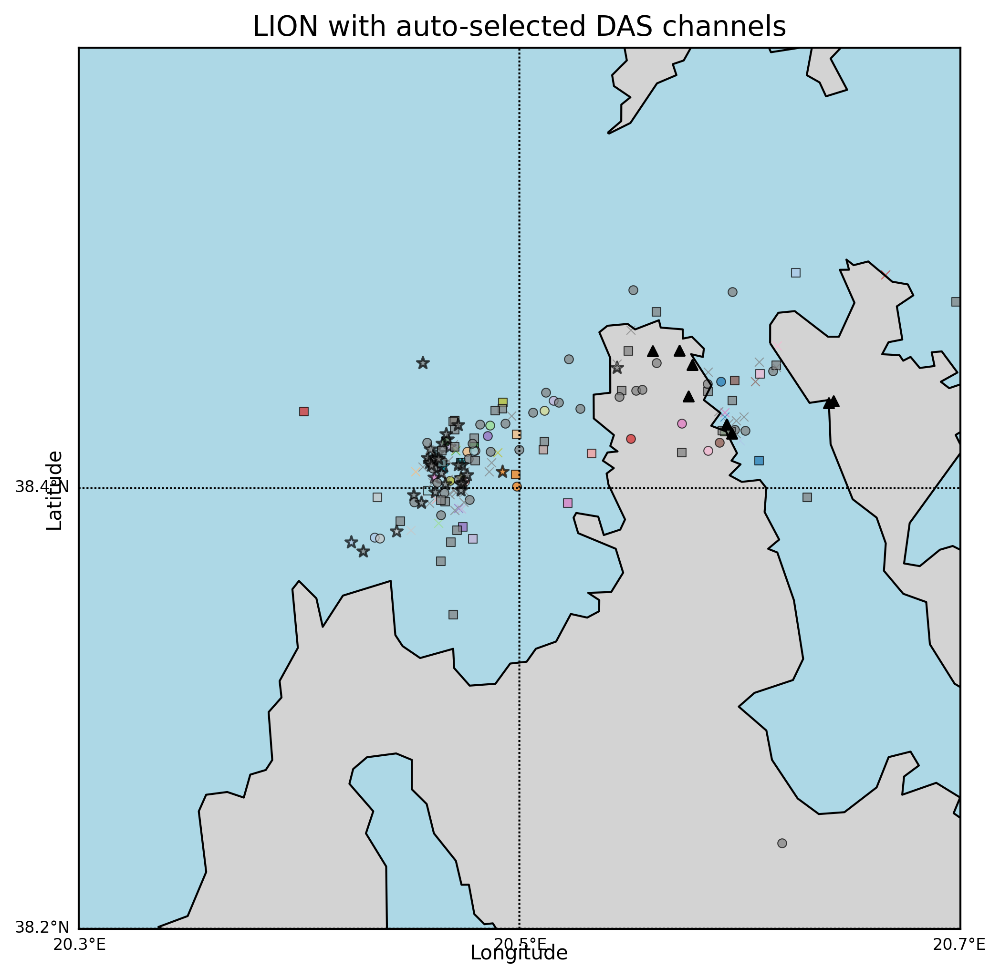

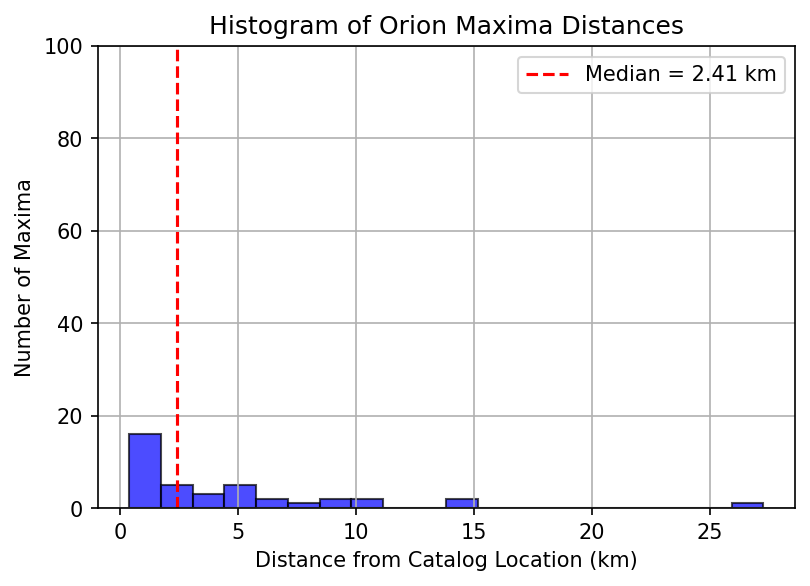

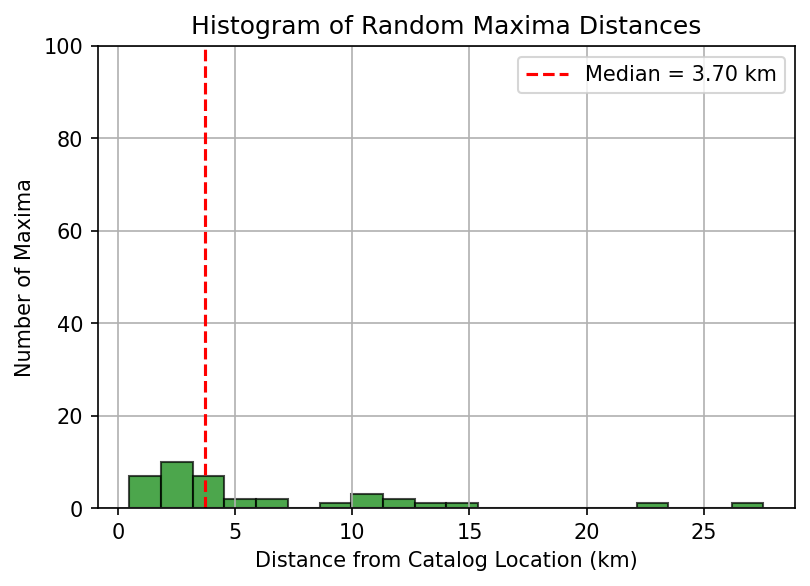

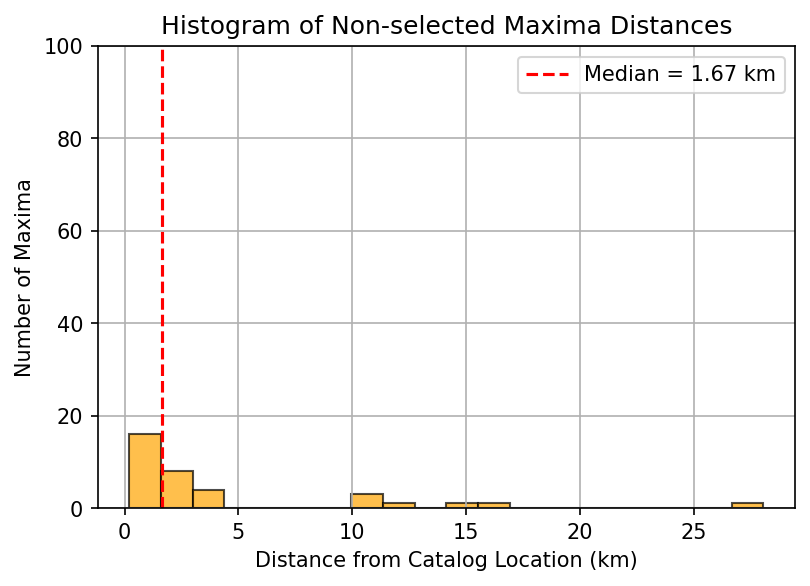

In [9]:
plot_fiber_only_map_with_maxima(
    ref_lat=38.10,
    ref_lon=20.20,
    das_hyb={
        "FIB-0262 (SEL HYB)": (38.4622, 20.5605),
        "FIB-1092 (SEL HYB)": (38.4626, 20.5725),
        "FIB-1738 (SEL HYB)": (38.4559, 20.5785),
        "FIB-3248 (SEL HYB)": (38.4418, 20.5767),
        "FIB-4512 (SEL HYB)": (38.4289, 20.5941),
        "FIB-4755 (SEL HYB)": (38.4249, 20.5965),
        "FIB-6970 (SEL HYB)": (38.4387, 20.6403),
        "FIB-7197 (SEL HYB)": (38.4395, 20.6426),
    },
    earthquake_location=(38.40435, 20.45875),
    cartesian_grid_x=cartesian_grid_x,
    cartesian_grid_y=cartesian_grid_y,
    lat_range=(38.2, 38.6),
    lon_range=(20.3, 20.7),
    parent_folder='/home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_das_high_freq_complete_weak_subsection_also_non_selected/',
    title="LION with auto-selected DAS channels"
)


In [37]:
def plot_fiber_only_map_with_percentile_sum(ref_lat, ref_lon, das_hyb,
                                            earthquake_location, cartesian_grid_x,
                                            cartesian_grid_y, lat_range, lon_range,
                                            parent_folder, title="Fiber 99th Percentile Sum Map"):
    import matplotlib.pyplot as plt
    from mpl_toolkits.basemap import Basemap
    from matplotlib.colors import Normalize
    from matplotlib import cm
    from scipy.interpolate import griddata
    import numpy as np
    import os
    import glob

    def cartesian_to_geographic(x, y, origin_lat, origin_lon):
        earth_radius = 6371  # km
        lat = origin_lat + (y / earth_radius) * (180 / np.pi)
        lon = origin_lon + (x / (earth_radius * np.cos(np.radians(origin_lat)))) * (180 / np.pi)
        return lat, lon

    def collect_percentile_sum(folder_path):
        nx, ny = cartesian_grid_x.shape
        percentile_sum = np.zeros((ny, nx))  # Shape: (lat, lon)

        for event_folder in os.listdir(folder_path):
            event_path = os.path.join(folder_path, event_folder, 'fiber')
            if not os.path.isdir(event_path):
                continue

            npy_files = glob.glob(os.path.join(event_path, "corrmatrix_trial_*_fiber.npy"))
            for file in npy_files:
                try:
                    corrmatrix_das = np.load(file)
                    total_size = corrmatrix_das.size
                    if total_size % (nx * ny) != 0:
                        raise ValueError(f"File {file} shape is incompatible with grid size.")

                    nz = total_size // (nx * ny)
                    corrmatrix = corrmatrix_das.reshape((nx, ny, nz))
                    corrmatrix = corrmatrix / np.nanmax(corrmatrix)
                    CXY = np.nanpercentile(corrmatrix, 99, axis=2).T  # Shape: (ny, nx)
                    percentile_sum += np.nan_to_num(CXY)
                except Exception as e:
                    print(f"Failed to process {file}: {e}")
        return percentile_sum

    percentile_sum = collect_percentile_sum(parent_folder)

    fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
    m = Basemap(projection='cyl', llcrnrlat=lat_range[0], urcrnrlat=lat_range[1],
                llcrnrlon=lon_range[0], urcrnrlon=lon_range[1], resolution='h', ax=ax)

    m.drawcoastlines()
    m.drawcountries()
    m.fillcontinents(color='lightgray', lake_color='lightblue')
    m.drawmapboundary(fill_color='lightblue')
    m.drawparallels(np.arange(lat_range[0], lat_range[1] + 0.01, 0.2), labels=[1,0,0,0], fontsize=8)
    m.drawmeridians(np.arange(lon_range[0], lon_range[1] + 0.01, 0.2), labels=[0,0,0,1], fontsize=8)

    # Convert grid to lat/lon
    lat_grid, lon_grid = cartesian_to_geographic(cartesian_grid_x, cartesian_grid_y, ref_lat, ref_lon)

    # Plot 99th percentile summed heatmap
    norm = Normalize(vmin=np.min(percentile_sum), vmax=np.max(percentile_sum))
    sc = ax.pcolormesh(lon_grid, lat_grid, percentile_sum, cmap=cm.inferno, shading='auto', norm=norm)

    # Plot earthquake catalog location
    ax.scatter(earthquake_location[1], earthquake_location[0], marker='*', color='red', edgecolors='black', s=130, label='Cluster Location')

    # Plot DAS HYB stations
    for name, (lat, lon) in das_hyb.items():
        ax.scatter(lon, lat, marker='o', color='crimson', s=14)

    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
    cbar.set_label("Summed 99th Percentile Coherence")

    ax.legend(loc='lower right', fontsize='small', frameon=True)
    plt.savefig("fiber_99th_percentile_sum_map.pdf", bbox_inches='tight')
    plt.show()


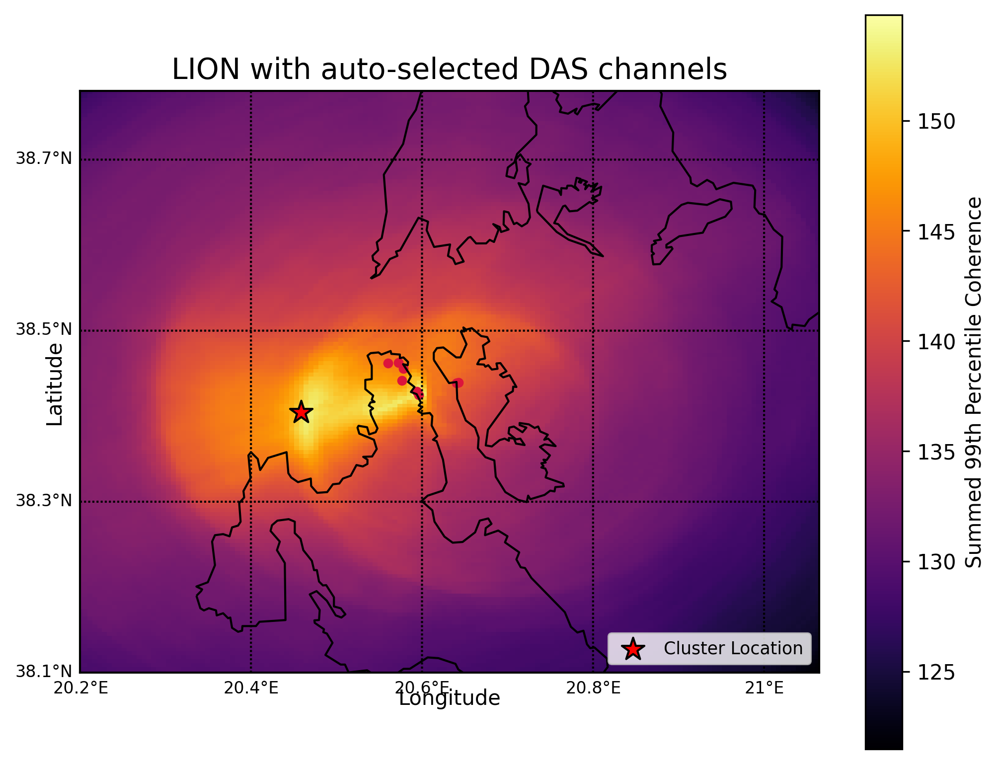

In [6]:
plot_fiber_only_map_with_percentile_sum(
    ref_lat=38.10,
    ref_lon=20.20,
    das_hyb={
        "FIB-0262 (SEL HYB)": (38.4622, 20.5605),
        "FIB-1092 (SEL HYB)": (38.4626, 20.5725),
        "FIB-1738 (SEL HYB)": (38.4559, 20.5785),
        "FIB-3248 (SEL HYB)": (38.4418, 20.5767),
        "FIB-4512 (SEL HYB)": (38.4289, 20.5941),
        "FIB-4755 (SEL HYB)": (38.4249, 20.5965),
        "FIB-6970 (SEL HYB)": (38.4387, 20.6403),
        "FIB-7197 (SEL HYB)": (38.4395, 20.6426),
    },
    earthquake_location=(38.40435, 20.45875),
    cartesian_grid_x=cartesian_grid_x,
    cartesian_grid_y=cartesian_grid_y,
    lat_range=(38.1, 38.78018018018018),
    lon_range=(20.2, 21.064340969963332),
    parent_folder='/home/emanuele/data/emanuele/loki-das/cefalonia/output_orion_complete',
    title="LION with auto-selected DAS channels"
)
